<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 2: Ames Housing Data and Kaggle Challenge

## Contents:
- [Problem Statement](#Problem-Statement)
- [Executive Summary](#Executive-Summary)
- [Datasets](#Datasets)
- [Data Dictionary](#Data-Dictionary)
- [Data Cleaning and EDA](#Data-Cleaning-and-EDA)
- [-Mas Vnr Type and Area](#Check-missing-data-on-Mas-Vnr-Type-and-Area)
- [-Basement values](#Check-missing-data-on-basement-values)
- [-Garage values](#Check-missing-data-on-Garage-values)
- [-Electrical](#Check-missing-data-for-Electrical)
- [-Lot Frontage](#Check-missing-data-on-Lot-Frontage)
- [-Fireplace](#Check-missing-data-on-Fireplace)
- [-Pool Quality](#Check-missing-data-on-Pool-Quality)
- [-Fench](#Check-missing-data-on-Fench)
- [Drop Columns](#Drop-Columns)
- [Converting Ordinal to Values](#Converting-Ordinal-to-Values)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [-Overall Quality](#Overall-Quality)
- [-Neighborhood Features](#Neighborhood-Features)
- [-Price per sqft](#Price-per-sqft)
- [-Positive Conditions 1 and 2](#Positive-Conditions-1-and-2)
- [-Sale Type](#Sale-Type-Order)
- [-Lot Frontage](#Lot-Frontage)
- [-House Age and Year Built](#House-Age-and-Year-Built)
- [-Year Remodeled and Additions](#Year-Remodeled-or-Additions)
- [-Basement Features](#Basement-Features)
- [-Garage Features](#Garage-Features)
- [-Kitchen Quality](#Kitchen-Quality)
- [-Fireplace](#Fireplace)
- [-All Floors sqft](#All-Floors-sqft)
- [-All Baths](#All-Baths)
- [-Ground Living Area](#Ground-Living-Area)
- [-Total Rooms Above Grade](#Total-Rooms-Above-Grade)
- [-Rooms Sizes Above Ground](#Room-Sizes-Above-Ground)
- [-External Porch Area](#External-Porch-Area)
- [-Months Sold](#Months-Sold)
- [-Masonary Veneer Type](#Masonry-Veneer-Type)
- [-MS Zoning](#MS-Zoning)
- [-Exterior 1 and 2](#Exterior-1-and-2)
- [-House Style](#House-Style)
- [-Building Type](#Building-Type)
- [-Roof Type](#Roof-Type)
- [Heatmap Correlation](#Heatmap-Correlation)

For modeling, conclusion and recommendations, refer to the following file.
* [`G2 Ames Housing Modeling.ipynb`]: Modeling evaluation of this project


# Problem Statement

To help novice property flippers manage risks, we will provide consultation upon application, based on our home valuation that predicts the sale prices of homes in Ames, Iowa. We have modeled Linear Regression, Ridge, Lasso and Elastic Net models. The sale price prediction software is also helpful for property buyers or sellers.

To better manage risks for new property flippers, we recommend the Reno Flip. 

Thus, our recommendations will focus on property features that are more likely to increase property value when renovated, and which features to de-prioritise. It is important to have this modelling predicts a good accuracy of the features as it will help the audience (property flippers) to maximise the property potential.

Success will be driven by the most optimal linear regression models with the best RMSE score using Linear regression, ridge, lasso and elastic net modelling.


## Executive Summary

Using the Ames Housing Dataset that is available on Kaggle, we want to identify which features are the best predictors of housing price and create a linear regression model such as linear regression, ridge, lasso and elastic net models that will help us make predictions with the best R2 score and also the RMSE score.

The Kaggle challenge offers a train.csv for us to to train our model with, and a test.csv which we will fit the model onto, in order to make our predictions. Both train.csv and test.csv will be cleaned and performed feature engineering first and saved to train_clean.csv and test_clean.csv. The csv of the predictions is then uploaded to the Kaggle challenge for scoring.

The model will be tuned closely to the Ames Housing dataset, and we might be able to use our findings from the process to understand what are some key predictors we can use in predicting prices for Ames houses in the United States. However, given that this data set has some features that are very specific to Ames, Iowa (e.g. neighborhood), it will not be perfect fit for other housing data in the U.S.

The model, and our understanding of the key features will be beneficial to existing home owners who might be considering selling their property to have a gauge of what prices their property could fetch. We will also advise the home owners what specific features can be upgraded to help them fetch a higher selling price.

With the right kind of predictors, this model aims to make the property market in Ames a fair and competitive one that will benefit both buyers and sellers.


Please note that there are two files to this project. 
- G2 Ames Housing Data Cleaning - Part 1
- G2 Ames Housing Modeling - Part 2

## Datasets
* [`train.csv`](./datasets/train.csv): Train set for training the machine learning models.
* [`test.csv`](./datasets/test.csv): Test set for Kaggle submission.

## Data Dictionary
* [`DataDocumentation.txt`](./datasets/DataDocumentation.txt): Data Dictionary used in train.csv and test.csv
* [`data_dictionary.csv`](./datasets/data_dictionary.csv): Dictionary used in train_clean.csv and test_clean.csv

## Import/Load Libraries

In [2]:
#Load libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from geopy import Nominatim
from geopy.extra.rate_limiter import RateLimiter
plt.style.use('fivethirtyeight')
# fig, ax = plt.subplots()

from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

# Data Cleaning and EDA

### Data Import & Cleaning for Train and Test Set

In [3]:
#Load data in dataframe
df_train = pd.read_csv('./datasets/train.csv')
df_test = pd.read_csv('./datasets/test.csv')

In [4]:
df_train.shape # 81 columns and 2051 rows

(2051, 81)

In [5]:
df_test.shape # 80 columns (without Sales Price and 878 rows)

(878, 80)

In [6]:
pd.set_option('max_columns', None)
df_train.head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


In [7]:
pd.set_option('max_columns', None)
df_test.head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


In [8]:
df_train.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2051.000000,2.051000e+03,2051.000000,1721.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2029.000000,2050.000000,2050.000000,2050.000000,2050.000000,2051.000000,2051.000000,2051.000000,2051.000000,2049.000000,2049.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,1937.000000,2050.000000,2050.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000
mean,1474.033642,7.135900e+08,57.008776,69.055200,10065.208191,6.112140,5.562165,1971.708922,1984.190151,99.695909,442.300488,47.959024,567.728293,1057.987805,1164.488055,329.329108,5.512921,1499.330083,0.427526,0.063446,1.577279,0.371039,2.843491,1.042906,6.435885,0.590931,1978.707796,1.776585,473.671707,93.833740,47.556802,22.571916,2.591419,16.511458,2.397855,51.574354,6.219893,2007.775719,181469.701609
std,843.980841,1.886918e+08,42.824223,23.260653,6742.488909,1.426271,1.104497,30.177889,21.036250,174.963129,461.204124,165.000901,444.954786,449.410704,396.446923,425.671046,51.068870,500.447829,0.522673,0.251705,0.549279,0.501043,0.826618,0.209790,1.560225,0.638516,25.441094,0.764537,215.934561,128.549416,66.747241,59.845110,25.229615,57.374204,37.782570,573.393985,2.744736,1.312014,79258.659352
min,1.000000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,753.500000,5.284581e+08,20.000000,58.000000,7500.000000,5.000000,5.000000,1953.500000,1964.500000,0.000000,0.000000,0.000000,220.000000,793.000000,879.500000,0.000000,0.000000,1129.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,319.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129825.000000
50%,1486.000000,5.354532e+08,50.000000,68.000000,9430.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,368.000000,0.000000,474.500000,994.500000,1093.000000,0.000000,0.000000,1444.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162500.000000
75%,2198.000000,9.071801e+08,70.000000,80.000000,11513.500000,7.000000,6.000000,2001.000000,2004.000000,161.000000,733.750000,0.000000,811.000000,1318.750000,1405.000000,692.500000,0.000000,1728.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,2930.000000,9.241520e+08,190.000000,313.000000,159000.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,5095.000000,1862.000000,1064.000000,5642.000000,3.000000,2.000000,4.000000,2.000000,8.000000,3.000000,15.000000,4.000000,2207.000000,5.000000,1418.000000,1424.000000,547.000000,432.000000,508.000000,490.000000,800.000000,17000.000000,12.000000,2010.000000,611657.000000


In [9]:
df_test.describe()

,Id,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold
count,878.000000,8.780000e+02,878.000000,718.000000,878.000000,878.000000,878.000000,878.000000,878.000000,877.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,833.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,1444.749431,7.162867e+08,58.268793,69.545961,10307.033030,6.050114,5.566059,1970.492027,1984.417995,106.236032,441.328018,53.896355,539.133257,1034.357631,1145.787016,348.398633,2.728929,1496.914579,0.439636,0.055809,1.539863,0.398633,2.879271,1.047836,6.454442,0.618451,1976.759904,1.742597,470.362187,93.430524,47.070615,24.064920,2.597950,14.830296,1.884966,48.498861,6.202733,2007.825740
std,850.838263,1.889103e+08,42.235407,23.533945,10002.674602,1.369065,1.128903,30.395895,20.450725,187.158908,438.457329,178.632355,426.172161,413.446291,375.264111,432.985566,32.572548,506.468967,0.529948,0.229683,0.559060,0.505927,0.830712,0.223966,1.596632,0.669571,25.689763,0.750391,212.734075,121.181702,68.180939,73.249463,24.962482,53.003794,29.916672,550.169317,2.642498,1.327861
min,2.000000,5.263021e+08,20.000000,21.000000,1477.000000,2.000000,1.000000,1880.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,407.000000,0.000000,0.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,692.250000,5.284841e+08,20.000000,59.000000,7297.250000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,216.000000,789.000000,864.000000,0.000000,0.000000,1114.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,322.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000
50%,1433.000000,5.354542e+08,50.000000,68.000000,9446.000000,6.000000,5.000000,1972.000000,1992.000000,0.000000,373.000000,0.000000,452.000000,975.000000,1063.000000,0.000000,0.000000,1436.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,473.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2197.500000,9.071904e+08,70.000000,80.000000,11589.000000,7.000000,6.000000,1999.750000,2003.000000,172.000000,734.750000,0.000000,780.000000,1247.000000,1358.000000,720.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,170.750000,69.750000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2928.000000,1.007100e+09,190.000000,182.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,2288.000000,1526.000000,2046.000000,2630.000000,2674.000000,2065.000000,481.000000,4476.000000,2.000000,1.000000,4.000000,2.000000,6.000000,3.000000,12.000000,3.000000,2010.000000,4.000000,1488.000000,690.000000,742.000000,1012.000000,360.000000,576.000000,555.000000,15500.000000,12.000000,2010.000000


In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   int64  
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

In [11]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     718 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Alley            58 non-null     object 
 8   Lot Shape        878 non-null    object 
 9   Land Contour     878 non-null    object 
 10  Utilities        878 non-null    object 
 11  Lot Config       878 non-null    object 
 12  Land Slope       878 non-null    object 
 13  Neighborhood     878 non-null    object 
 14  Condition 1      878 non-null    object 
 15  Condition 2      878 non-null    object 
 16  Bldg Type        878 non-null    object 
 17  House Style     

## Missing Data

All the missing data will be checked for train and test sets and impute the best option.

In [5]:
# df.missing and df.nan to show missing values in the columns
null_colst = df_train.isnull().sum()
null_colst[null_colst > 0].sort_values(ascending=False)

Pool QC           2042
Misc Feature      1986
Alley             1911
Fence             1651
Fireplace Qu      1000
Lot Frontage       330
Garage Yr Blt      114
Garage Cond        114
Garage Qual        114
Garage Finish      114
Garage Type        113
Bsmt Exposure       58
BsmtFin Type 2      56
Bsmt Cond           55
Bsmt Qual           55
BsmtFin Type 1      55
Mas Vnr Area        22
Mas Vnr Type        22
Bsmt Half Bath       2
Bsmt Full Bath       2
Total Bsmt SF        1
Bsmt Unf SF          1
BsmtFin SF 2         1
Garage Cars          1
Garage Area          1
BsmtFin SF 1         1
dtype: int64

In [9]:
# df.missing and df.nan to show missing values in the columns
null_cols = df_test.isnull().sum()
null_cols[null_cols > 0].sort_values(ascending=False)

Pool QC           874
Misc Feature      837
Alley             820
Fence             706
Fireplace Qu      422
Lot Frontage      160
Garage Yr Blt      45
Garage Finish      45
Garage Qual        45
Garage Cond        45
Garage Type        44
Bsmt Exposure      25
BsmtFin Type 1     25
BsmtFin Type 2     25
Bsmt Cond          25
Bsmt Qual          25
Mas Vnr Area        1
Mas Vnr Type        1
Electrical          1
dtype: int64

Sale price histogram was examined and it is stewing to the right. The reason is that there are outliners of high sale price in small count.

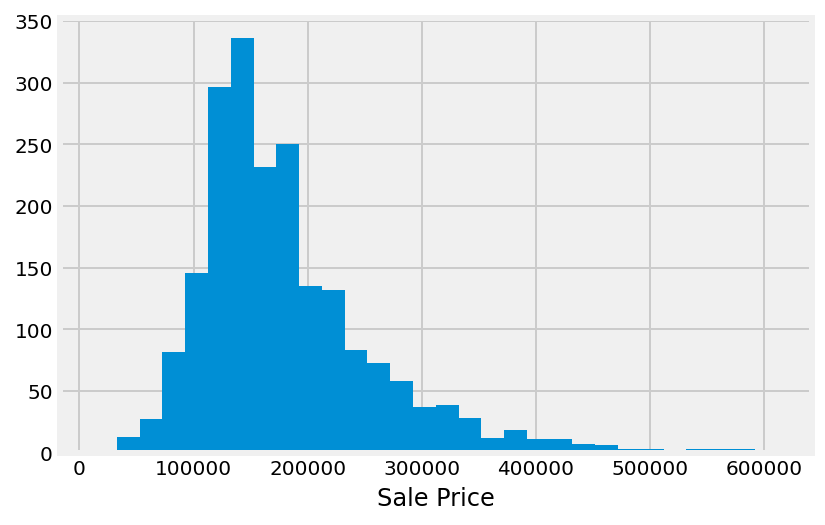

In [14]:
# Looking at the histogram, there are outliers stewing to the right. 
fig = plt.figure()
df_train['SalePrice'].hist(bins=30);
plt.xlabel('Sale Price');
fig.savefig('histsaleprice.jpg')

<Figure size 1152x648 with 0 Axes>

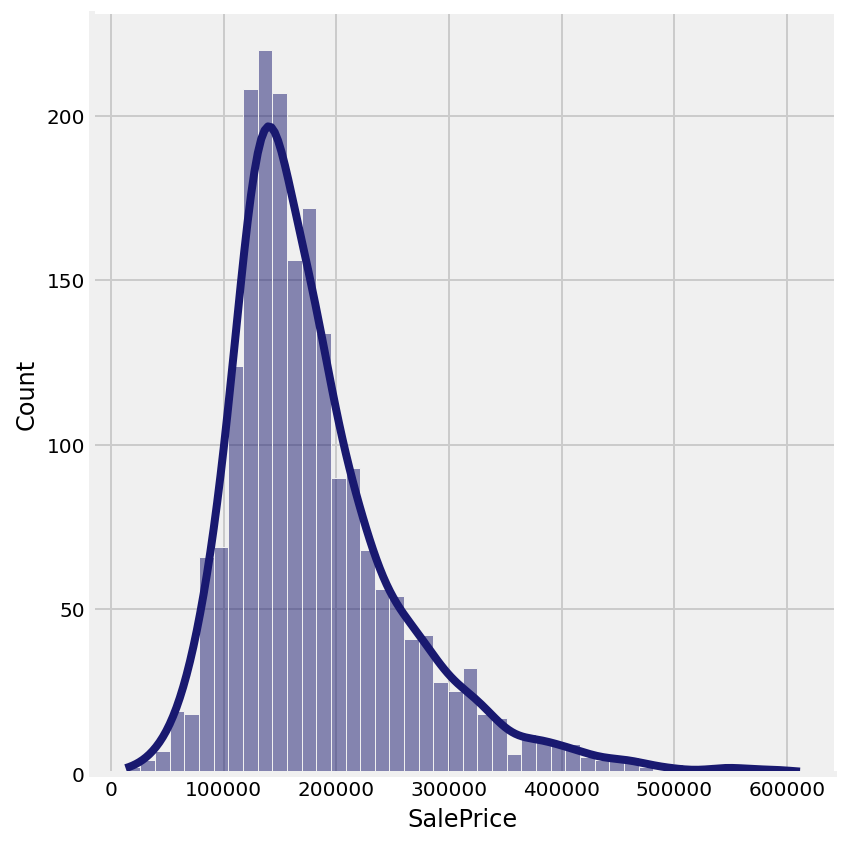

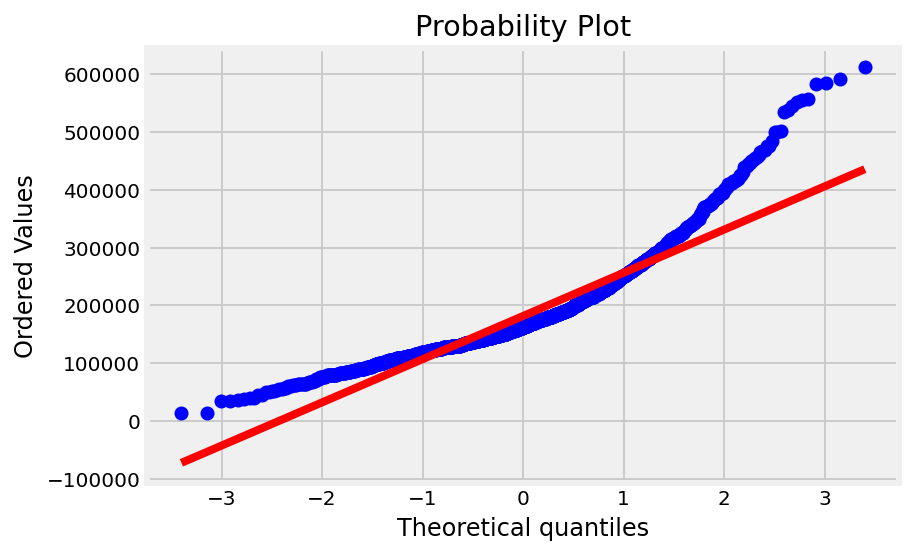

In [15]:
plt.figure(figsize=(16,9))
sns.displot(data=df_train, x='SalePrice', kde=True, color= 'midnightblue', height=6)
fig = plt.figure()
pro = stats.probplot(df_train['SalePrice'], plot=plt);

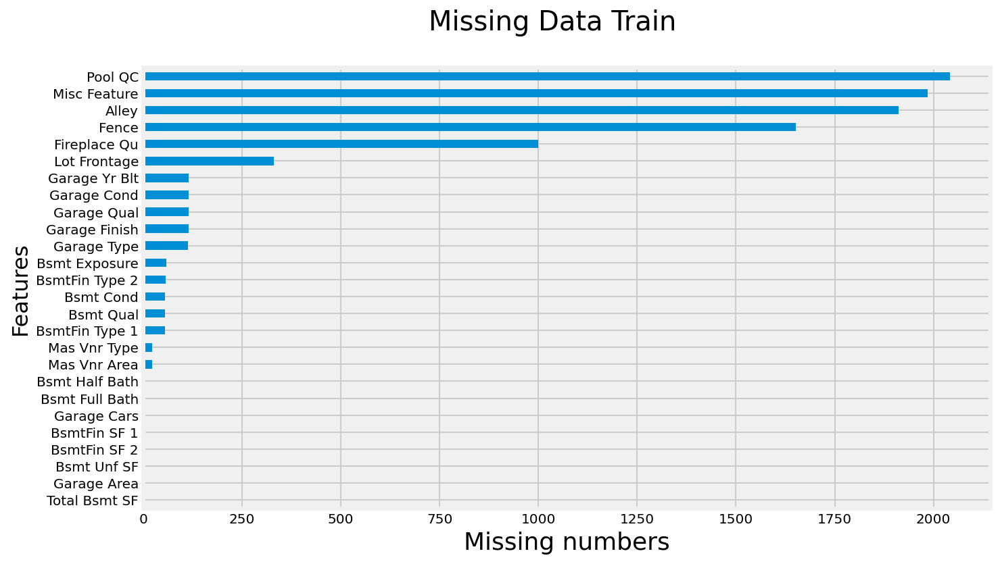

In [7]:
missing_t = null_colst[null_colst > 0].sort_values(ascending=True)
# missing_t.plot.barh(figsize =(16, 12));

fig = plt.figure()
missing_t.plot.barh(figsize =(10, 6))
fig.suptitle('Missing Data Train', fontsize=20)
plt.xlabel('Missing numbers', fontsize=18)
plt.ylabel('Features', fontsize=16);
fig.savefig('missingdatatrain.jpg')

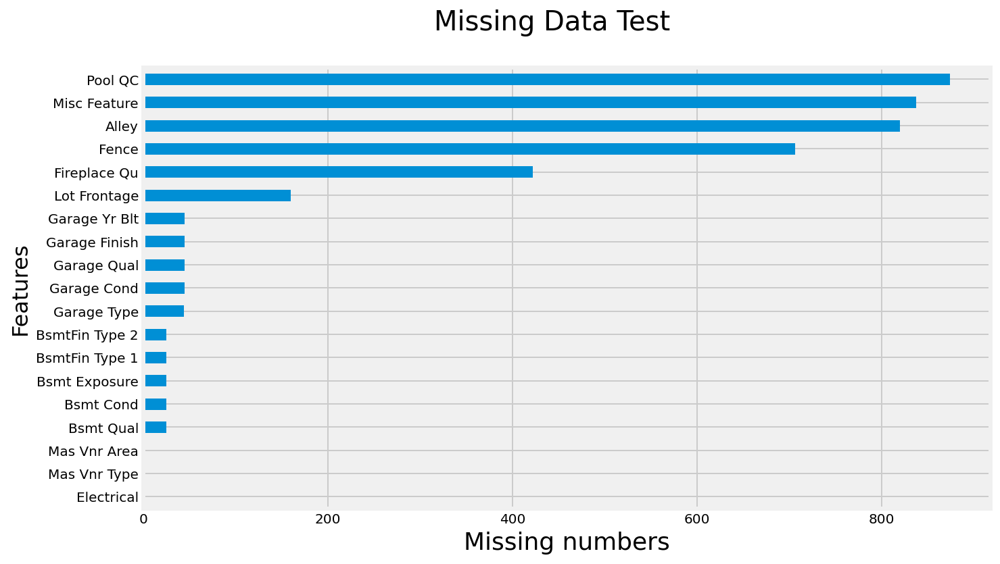

In [10]:
missing_test = null_cols[null_cols > 0].sort_values(ascending=True)
# missing_t.plot.barh(figsize =(16, 12));

fig = plt.figure()
missing_test.plot.barh(figsize =(10, 6))
fig.suptitle('Missing Data Test', fontsize=20)
plt.xlabel('Missing numbers', fontsize=18)
plt.ylabel('Features', fontsize=16);

In [18]:
# df.missing and df.nan to show missing and nan values in the columns
df_train.isna().sum().sort_values(ascending=False)

Pool QC         2042
Misc Feature    1986
Alley           1911
Fence           1651
Fireplace Qu    1000
                ... 
Heating QC         0
Central Air        0
Electrical         0
1st Flr SF         0
SalePrice          0
Length: 81, dtype: int64

### Check missing data on Mas Vnr Type and Area

Train data
- Mas Vnr Area        22
- Mas Vnr Type        22

Test data
- Mas Vnr Area        1
- Mas Vnr Type        1

In [19]:
# Value counts for Mas Vnr Type Area
df_train['Mas Vnr Area'].value_counts()

0.0      1216
120.0      11
176.0      10
200.0      10
108.0       9
         ... 
142.0       1
215.0       1
235.0       1
233.0       1
426.0       1
Name: Mas Vnr Area, Length: 373, dtype: int64

In [20]:
# Value counts for Mas Vnr Type Type
df_train['Mas Vnr Type'].value_counts()

None       1218
BrkFace     630
Stone       168
BrkCmn       13
Name: Mas Vnr Type, dtype: int64

In [21]:
# Total missing number for Mas Vnr Type Area
df_train['Mas Vnr Area'].isnull().sum()

22

In [22]:
# Total missing number for Mas Vnr Type Area
df_test['Mas Vnr Area'].isnull().sum()

1

In [23]:
# Total missing number for Mas Vnr Type Type
df_train['Mas Vnr Type'].isnull().sum()

22

In [24]:
# Total missing number for Mas Vnr Type Type
df_test['Mas Vnr Type'].isnull().sum()

1

In [25]:
# Check if missing data are matching for Mas Vnr Type / Area
df_train[df_train['Mas Vnr Type'].isnull()][['Mas Vnr Type','Mas Vnr Area']]

,Mas Vnr Type,Mas Vnr Area
22,NaN,NaN
41,NaN,NaN
86,NaN,NaN
212,NaN,NaN
276,NaN,NaN
338,NaN,NaN
431,NaN,NaN
451,NaN,NaN
591,NaN,NaN
844,NaN,NaN


In [26]:
# Check if missing data are matching for Mas Vnr Type / Area
df_test[df_test['Mas Vnr Type'].isnull()][['Mas Vnr Type','Mas Vnr Area']]

,Mas Vnr Type,Mas Vnr Area
865,NaN,NaN


In [27]:
# Check the zero or none value for Mas Vnr Type / Area
df_train[df_train['Mas Vnr Area'] == 0][['Mas Vnr Type','Mas Vnr Area']].head()

,Mas Vnr Type,Mas Vnr Area
2,None,0.0
3,None,0.0
4,None,0.0
5,None,0.0
8,None,0.0


The number of missing data for Mas Vnr Type and Area are the same. Hence, we can conclude that it matched and will replace the missing values with None or 0

In [28]:
# Check the zero or none value for Mas Vnr Type / Area
df_test[df_test['Mas Vnr Area'] == 0][['Mas Vnr Type','Mas Vnr Area']].head()

,Mas Vnr Type,Mas Vnr Area
0,None,0.0
1,None,0.0
2,None,0.0
3,None,0.0
5,None,0.0


In [29]:
# Fillna None for Mas Vnr Type
# Fillna Zero for Mas Vnr Area
df_train['Mas Vnr Type'] = df_train['Mas Vnr Type'].fillna('None')
df_train['Mas Vnr Area'] = df_train['Mas Vnr Area'].fillna(0)

In [30]:
# Fillna None for Mas Vnr Type
# Fillna Zero for Mas Vnr Area
df_test['Mas Vnr Type'] = df_test['Mas Vnr Type'].fillna('None')
df_test['Mas Vnr Area'] = df_test['Mas Vnr Area'].fillna(0)

### Check missing data on basement values

Train data

- Bsmt Exposure       58
- BsmtFin Type 2      56
- Bsmt Cond           55
- Bsmt Qual           55
- BsmtFin Type 1      55
- Bsmt Half Bath       2
- Bsmt Full Bath       2
- Total Bsmt SF        1
- Bsmt Unf SF          1
- BsmtFin SF 2         1
- BsmtFin SF 1         1

Test data
- Bsmt Exposure      25
- BsmtFin Type 1     25
- BsmtFin Type 2     25
- Bsmt Cond          25
- Bsmt Qual          25

In [31]:
df_train[df_train['Total Bsmt SF'].isnull()][['Bsmt Qual','Bsmt Cond','Bsmt Exposure',
                                              'BsmtFin Type 1','BsmtFin SF 1',
                                              'BsmtFin Type 2','BsmtFin SF 2',
                                              'Bsmt Unf SF','Total Bsmt SF',
                                              'Bsmt Full Bath','Bsmt Half Bath']].T

,1327
Bsmt Qual,NaN
Bsmt Cond,NaN
Bsmt Exposure,NaN
BsmtFin Type 1,NaN
BsmtFin SF 1,NaN
BsmtFin Type 2,NaN
BsmtFin SF 2,NaN
Bsmt Unf SF,NaN
Total Bsmt SF,NaN
Bsmt Full Bath,NaN


As shown above, there is only one nan value for no basement sq feet and all other basement features related to it also showed null. Hence, we can fillna with zero for this house. Before we do that, we looked at the Full and Half Bath if they have any relation to it.

In [32]:
df_test[df_test['Bsmt Exposure'].isnull()][['Total Bsmt SF', 'Bsmt Exposure',
                                              'BsmtFin Type 1', 'BsmtFin Type 2',
                                              'Bsmt Cond','Bsmt Qual',
                                               'Bsmt Full Bath','Bsmt Half Bath']].T

,15,37,76,78,112,144,189,205,278,291,293,314,320,413,430,480,527,552,613,618,621,625,654,702,771
Total Bsmt SF,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Bsmt Exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFin Type 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFin Type 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bsmt Cond,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bsmt Qual,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bsmt Full Bath,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Bsmt Half Bath,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


As shown above, as the total basement sf is zero, the rest indicated Nan. Hence, we can fillna with zero for this house. 

In [33]:
df_train[df_train['Bsmt Full Bath'].isnull()][['Bsmt Qual','Bsmt Cond','Bsmt Exposure',
                                               'BsmtFin Type 1','BsmtFin SF 1',
                                               'BsmtFin Type 2','BsmtFin SF 2',
                                               'Bsmt Unf SF','Total Bsmt SF',
                                               'Bsmt Full Bath','Bsmt Half Bath']].T

,616,1327
Bsmt Qual,NaN,NaN
Bsmt Cond,NaN,NaN
Bsmt Exposure,NaN,NaN
BsmtFin Type 1,NaN,NaN
BsmtFin SF 1,0.0,NaN
BsmtFin Type 2,NaN,NaN
BsmtFin SF 2,0.0,NaN
Bsmt Unf SF,0.0,NaN
Total Bsmt SF,0.0,NaN
Bsmt Full Bath,NaN,NaN


For train set, it is obvious that the Full Bath and Half Bath should be zero as well as it dont have the basement. Therefore, fillna with NA.

In [34]:
# Filling the 4 features to zero and also Full and Half Bath to zero
df_train['Total Bsmt SF'] = df_train['Total Bsmt SF'].fillna(0)
df_train['BsmtFin SF 1'] = df_train['BsmtFin SF 1'].fillna(0)
df_train['BsmtFin SF 2'] = df_train['BsmtFin SF 2'].fillna(0)
df_train['Bsmt Unf SF'] = df_train['Bsmt Unf SF'].fillna(0)

df_train['Bsmt Full Bath'] = df_train['Bsmt Full Bath'].fillna(0)
df_train['Bsmt Half Bath'] = df_train['Bsmt Half Bath'].fillna(0)

For test set, the 5 features are with the other values with no basement. Therefore, it will be fill with zero.

In [35]:
# Filling the 5 test features to NA

df_test['Bsmt Exposure'] = df_test['Bsmt Exposure'].fillna('NA')
df_test['BsmtFin Type 1'] = df_test['BsmtFin Type 1'].fillna('NA')
df_test['BsmtFin Type 2'] = df_test['BsmtFin Type 2'].fillna('NA')

df_test['Bsmt Cond'] = df_test['Bsmt Cond'].fillna('NA')
df_test['Bsmt Qual'] = df_test['Bsmt Qual'].fillna('NA')

In [36]:
# df.missing and df.nan to show missing values in the columns
null_cols = df_test.isnull().sum()
null_cols[null_cols > 0].sort_values(ascending=False)

Pool QC          874
Misc Feature     837
Alley            820
Fence            706
Fireplace Qu     422
Lot Frontage     160
Garage Yr Blt     45
Garage Finish     45
Garage Qual       45
Garage Cond       45
Garage Type       44
Electrical         1
dtype: int64

In [37]:
df_test[df_test['Bsmt Exposure']== 0][['Total Bsmt SF', 'Bsmt Exposure',
                                              'BsmtFin Type 1', 'BsmtFin Type 2',
                                              'Bsmt Cond','Bsmt Qual',
                                               'Bsmt Full Bath','Bsmt Half Bath']].T

""
Total Bsmt SF
Bsmt Exposure
BsmtFin Type 1
BsmtFin Type 2
Bsmt Cond
Bsmt Qual
Bsmt Full Bath
Bsmt Half Bath


#### Checking the rest of the missing basement data for train set

- Bsmt Exposure       58
- BsmtFin Type 2      56
- Bsmt Cond           55
- Bsmt Qual           55
- BsmtFin Type 1      55

Next is to check if the Total Basement SF with zero is equalevant to Basement Qual

In [38]:
df_train[df_train['Total Bsmt SF'] == 0][['Bsmt Qual','Bsmt Cond','Bsmt Exposure',
                                              'BsmtFin Type 1','BsmtFin SF 1',
                                              'BsmtFin Type 2','BsmtFin SF 2',
                                              'Bsmt Unf SF','Total Bsmt SF',
                                              'Bsmt Full Bath','Bsmt Half Bath']].T

,12,93,114,146,183,240,249,256,390,437,485,499,514,580,581,616,635,642,696,700,737,772,790,794,924,933,954,1007,1022,1049,1089,1098,1125,1157,1211,1222,1252,1256,1270,1327,1331,1377,1387,1428,1481,1594,1620,1681,1684,1686,1859,1875,1889,1933,2010
Bsmt Qual,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bsmt Cond,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bsmt Exposure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFin Type 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFin SF 1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BsmtFin Type 2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BsmtFin SF 2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bsmt Unf SF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Total Bsmt SF,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Bsmt Full Bath,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [39]:
df_train[df_train['Total Bsmt SF'] == 0].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [40]:
df_train[df_train['Bsmt Qual'].isnull()].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [41]:
df_train[df_train['Bsmt Cond'].isnull()].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [42]:
sum(df_train[df_train['Total Bsmt SF'] == 0].index == df_train[df_train['Bsmt Qual'].isnull()].index)

55

In [43]:
sum(df_train[df_train['Total Bsmt SF'] == 0].index == df_train[df_train['Bsmt Cond'].isnull()].index)

55

In [44]:
sum(df_train[df_train['Bsmt Qual'].isnull()].index == df_train[df_train['Bsmt Qual'].isnull()].index)

55

We can conclude that the 55 row are same for Basement SF, Conditions and Quality. Hence we will be doing fillna-> NA to Basement Conditions and Basement Quality for no Basement

In [45]:
# Fill na for Basement Quality and Conditions
df_train['Bsmt Qual'] = df_train['Bsmt Qual'].fillna('NA')
df_train['Bsmt Cond'] = df_train['Bsmt Cond'].fillna('NA')

- Bsmt Exposure       58
- BsmtFin Type 2      56
- BsmtFin Type 1      55

There is one more missing for Type 2 than Type 1. Below is to identify which missing row has other values in it.

In [46]:
df_train[(df_train['BsmtFin Type 2'].isnull()) & (df_train['BsmtFin SF 2']>0)][['Bsmt Qual','Bsmt Cond','Bsmt Exposure',
                                               'BsmtFin Type 1','BsmtFin SF 1',
                                               'BsmtFin Type 2','BsmtFin SF 2',
                                               'Bsmt Unf SF','Total Bsmt SF',
                                               'Bsmt Full Bath','Bsmt Half Bath']]

,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
1147,Gd,TA,No,GLQ,1124.0,NaN,479.0,1603.0,3206.0,1.0,0.0


In [47]:
df_train['BsmtFin Type 2'].value_counts()

Unf    1749
Rec      80
LwQ      60
BLQ      48
ALQ      35
GLQ      23
Name: BsmtFin Type 2, dtype: int64

Apart from unfinished category, the next highest is Average Rec Room (Rec). We will replace it with Rec

In [48]:
df_train.loc[[1147], ['BsmtFin Type 2']] = 'Rec'

In [49]:
df_train[df_train['Total Bsmt SF'] == 0].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [50]:
df_train[df_train['BsmtFin Type 1'].isnull()].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [51]:
df_train[df_train['BsmtFin Type 2'].isnull()].index

Int64Index([  12,   93,  114,  146,  183,  240,  249,  256,  390,  437,  485,
             499,  514,  580,  581,  616,  635,  642,  696,  700,  737,  772,
             790,  794,  924,  933,  954, 1007, 1022, 1049, 1089, 1098, 1125,
            1157, 1211, 1222, 1252, 1256, 1270, 1327, 1331, 1377, 1387, 1428,
            1481, 1594, 1620, 1681, 1684, 1686, 1859, 1875, 1889, 1933, 2010],
           dtype='int64')

In [52]:
sum(df_train[df_train['Total Bsmt SF'] == 0].index == df_train[df_train['BsmtFin Type 2'].isnull()].index)

55

In [53]:
sum(df_train[df_train['Total Bsmt SF'] == 0].index == df_train[df_train['BsmtFin Type 1'].isnull()].index)

55

In [54]:
sum(df_train[df_train['BsmtFin Type 1'].isnull()].index == df_train[df_train['BsmtFin Type 2'].isnull()].index)

55

We can conclude that the 55 row are same for Basement SF, Basement Type 1 and Type 2. Hence we will be doing fillna-> NA to Basement Conditions and Basement Quality for no Basement

In [55]:
# Fill na with the missing value for Basement Finish Type 1 & 2
df_train['BsmtFin Type 1'] = df_train['BsmtFin Type 1'].fillna('NA')
df_train['BsmtFin Type 2'] = df_train['BsmtFin Type 2'].fillna('NA')

- Bsmt Exposure       58

In [56]:
# Display the null values of Basement Exposure that have values for Total Basement SF
df_train[(df_train['Bsmt Exposure'].isnull()) & (df_train['Total Bsmt SF']>0)][['Bsmt Qual','Bsmt Cond','Bsmt Exposure',
                                               'BsmtFin Type 1','BsmtFin SF 1',
                                               'BsmtFin Type 2','BsmtFin SF 2',
                                               'Bsmt Unf SF','Total Bsmt SF',
                                               'Bsmt Full Bath','Bsmt Half Bath']]

,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
1456,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0.0,0.0
1547,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0.0,0.0
1997,Gd,TA,NaN,Unf,0.0,Unf,0.0,936.0,936.0,0.0,0.0


In [57]:
df_train['Bsmt Exposure'].value_counts()

No    1339
Av     288
Gd     203
Mn     163
Name: Bsmt Exposure, dtype: int64

With the highest number as No Exposure (No), we will update No to the 2 rows

In [58]:
df_train.loc[[1456], ['Bsmt Exposure']] = 'No'
df_train.loc[[1547], ['Bsmt Exposure']] = 'No'
df_train.loc[[1997], ['Bsmt Exposure']] = 'No'

In [59]:
df_train['Bsmt Exposure'] = df_train['Bsmt Exposure'].fillna('NA')

### Checking missing data on Garage values

Train data
- Garage Yr Blt      114
- Garage Cond        114
- Garage Qual        114
- Garage Finish      114
- Garage Type        113
- Garage Cars          1
- Garage Area          1

Test data
- Garage Yr Blt      45
- Garage Finish      45
- Garage Qual        45
- Garage Cond        45
- Garage Type        44

In [60]:
df_train[(df_train['Garage Area'].isnull())][['Garage Yr Blt','Garage Cond','Garage Qual',
                                               'Garage Finish','Garage Type',
                                               'Garage Cars','Garage Area']]

,Garage Yr Blt,Garage Cond,Garage Qual,Garage Finish,Garage Type,Garage Cars,Garage Area
1712,NaN,NaN,NaN,NaN,Detchd,NaN,NaN


Garage Cars and Area have the same row. 

In [61]:
df_test[(df_test['Garage Yr Blt'].isnull())][['Garage Yr Blt','Garage Finish','Garage Qual',
                                               'Garage Cond','Garage Type', 'Garage Area', 'Year Remod/Add']]

,Garage Yr Blt,Garage Finish,Garage Qual,Garage Cond,Garage Type,Garage Area,Year Remod/Add
29,NaN,NaN,NaN,NaN,NaN,0,1950
45,NaN,NaN,NaN,NaN,NaN,0,2008
66,NaN,NaN,NaN,NaN,NaN,0,1971
68,NaN,NaN,NaN,NaN,NaN,0,2006
105,NaN,NaN,NaN,NaN,NaN,0,1997
109,NaN,NaN,NaN,NaN,NaN,0,1967
113,NaN,NaN,NaN,NaN,NaN,0,2006
144,NaN,NaN,NaN,NaN,NaN,0,1993
152,NaN,NaN,NaN,NaN,NaN,0,1998
156,NaN,NaN,NaN,NaN,NaN,0,1970


For 764 row, there is a detched garage and area of 360 sf. Hence, we will fill the rest of the fields accordingly. For the rest of the test NaN fields, we will fill with 0.

In [62]:
df_test.loc[[764], ['Garage Yr Blt']] = 1983 #Same as the year built 
df_test.loc[[764], ['Garage Finish']] = 'Unf'
df_test.loc[[764], ['Garage Qual']] = 'TA'
df_test.loc[[764], ['Garage Cond']] = 'TA'

In [63]:
# Fillna with NA for the 4 features
df_test['Garage Finish'] = df_test['Garage Finish'].fillna('NA')
df_test['Garage Qual'] = df_test['Garage Qual'].fillna('NA')
df_test['Garage Cond'] = df_test['Garage Cond'].fillna('NA')
df_test['Garage Type'] = df_test['Garage Type'].fillna('NA')

# For Garage Yr Blt, it will be replace with the Year Remod/Add because it is the Yr Blt if there is no mod/add
df_test['Garage Yr Blt'] = df_test['Garage Yr Blt'].fillna(df_train['Year Remod/Add'])

In [64]:
df_train[df_train['Garage Area'] == 0].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=113)

In [65]:
df_train[df_train['Garage Cars'] == 0].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=113)

In [66]:
sum(df_train[df_train['Garage Area'] == 0].index == df_train[df_train['Garage Cars'] == 0].index)

113

The number of rows for Garage Cars and Area matched.

In [67]:
df_train[df_train['Garage Type'].isnull()].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=113)

The rows for Garage Type is null and Garage Cars/Area = 0 matched. Hence, we can fillna with 0 for Garage Cars and Area and No Garage for Garage Type

In [68]:
df_train['Garage Type'] = df_train['Garage Type'].fillna('NA')
df_train['Garage Cars'] = df_train['Garage Cars'].fillna(0)
df_train['Garage Area'] = df_train['Garage Area'].fillna(0)

- Garage Yr Blt      114
- Garage Cond        114
- Garage Qual        114
- Garage Finish      114

The above 4 values seemed to match the rows for Garage Area/Cars. 

In [69]:
df_train[df_train['Garage Yr Blt'].isnull()].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [70]:
df_train[df_train['Garage Cond'].isnull()].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [71]:
df_train[df_train['Garage Qual'].isnull()].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [72]:
df_train[df_train['Garage Finish'].isnull()].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [73]:
df_train[df_train['Garage Area'] == 0].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [74]:
df_train[df_train['Garage Cars'] == 0].index

Int64Index([  28,   53,   65,   79,  101,  103,  114,  120,  134,  136,
            ...
            1841, 1893, 1927, 1952, 1982, 1991, 2010, 2027, 2039, 2042],
           dtype='int64', length=114)

In [75]:
sum(df_train[df_train['Garage Area'] == 0].index == df_train[df_train['Garage Qual'].isnull()].index)

114

In [76]:
sum(df_train[df_train['Garage Area'] == 0].index == df_train[df_train['Garage Cond'].isnull()].index)

114

In [77]:
sum(df_train[df_train['Garage Area'] == 0].index == df_train[df_train['Garage Yr Blt'].isnull()].index)

114

In [78]:
sum(df_train[df_train['Garage Area'] == 0].index == df_train[df_train['Garage Finish'].isnull()].index)

114

In [79]:
# Fillna with NA for the 3 features
df_train['Garage Finish'] = df_train['Garage Finish'].fillna('NA')
df_train['Garage Qual'] = df_train['Garage Qual'].fillna('NA')
df_train['Garage Cond'] = df_train['Garage Cond'].fillna('NA')

# For Garage Yr Blt, it will be replace with the Year Remod/Add because it is the Yr Blt if there is no mod/add
df_train['Garage Yr Blt'] = df_train['Garage Yr Blt'].fillna(df_train['Year Remod/Add'])

Also, on the df_train.describe, it showed the max value of Garage Yr Built as 2207. It is obviously a type and to correct it to 2007.

In [80]:
df_train[(df_train['Garage Yr Blt'] >= 2020)]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
1699,2261,916384070,20,RL,68.0,8298,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,8,5,2006,2007,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,583.0,Unf,0.0,963.0,1546.0,GasA,Ex,Y,SBrkr,1564,0,0,1564,0.0,0.0,2,0,2,1,Ex,6,Typ,1,Gd,Attchd,2207.0,RFn,2.0,502.0,TA,TA,Y,132,0,0,0,0,0,NaN,NaN,NaN,0,9,2007,New,267300


In [81]:
df_train.loc[[1699], ['Garage Yr Blt']] = 2007

### Check missing data on Electrical

Test data
- Electrical 1

In [82]:
df_test[(df_test['Electrical'].isnull())]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
634,1578,916386080,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD


In [83]:
df_test.loc[[634], ['Electrical']] = 'SBrkr'

We will input standard electrical type for the NaN data

### Checking missing data on Lot Frontage

Train data

- Pool QC           2042
- Misc Feature      1986
- Alley             1911
- Fence             1651
- Fireplace Qu      1000
- Lot Frontage       330

On train data, checking the Lot Frontage (Linear feet of street connected to property). Every house should have a lot frontage and unlikely to have zero. 

Test data
- Pool QC           874
- Misc Feature      837
- Alley             820
- Fence             706
- Fireplace Qu      422
- Lot Frontage      160

In [84]:
# find the value frequency
df_train['Lot Frontage'].value_counts()

60.0     179
70.0      96
80.0      94
50.0      90
65.0      71
        ... 
118.0      1
137.0      1
195.0      1
115.0      1
135.0      1
Name: Lot Frontage, Length: 118, dtype: int64

In [85]:
# describe the Lot Frontage 
df_train['Lot Frontage'].describe()

count    1721.000000
mean       69.055200
std        23.260653
min        21.000000
25%        58.000000
50%        68.000000
75%        80.000000
max       313.000000
Name: Lot Frontage, dtype: float64

In [86]:
# Grouping the lot features to examine further
df_train_lots = df_train[['Lot Frontage', 'Lot Area', 'Lot Shape', 'Lot Config', 'Neighborhood']]

In [87]:
# Grouping the lot features to examine further
df_test_lots = df_test[['Lot Frontage', 'Lot Area', 'Lot Shape', 'Lot Config', 'Neighborhood']]

In [88]:
df_train_lots.groupby(['Neighborhood', 'Lot Config']).median().T

Neighborhood Blmngtn Blueste  BrDale BrkSide                          ClearCr  \
Lot Config    Inside  Inside  Inside  Corner     FR2     FR3  Inside   Corner   
Lot Frontage    43.0    24.0    21.0    51.0    60.0    79.5    51.0     89.0   
Lot Area      3189.0  1866.0  1680.0  6180.0  6911.0  6047.5  6240.0  11075.0   

Neighborhood                    CollgCr                                    \
Lot Config    CulDSac   Inside   Corner  CulDSac     FR2      FR3  Inside   
Lot Frontage     77.5     85.0     85.0     45.0    63.0     90.0    70.0   
Lot Area      46165.5  13275.0  11078.5  10820.0  8772.5  15750.0  9314.5   

Neighborhood  Crawfor                           Edwards                   \
Lot Config     Corner  CulDSac      FR2  Inside  Corner  CulDSac     FR2   
Lot Frontage     56.5     63.0     85.0    65.0    74.0     38.0    60.0   
Lot Area      11435.0  21579.0  19645.0  9635.0  9385.0  10622.0  8558.5   

Neighborhood          Gilbert                            Greens GrnHill  \
Lot Config    Inside   Corner  CulDSac      FR2  Inside  Inside  Inside   
Lot Frontage    62.0     99.5     50.0     57.0    63.0    40.0     NaN   
Lot Area      8877.0  12083.0  11945.0  17166.0  8680.0  3876.0  9001.0   

Neighborhood  IDOTRR                 Landmrk MeadowV Mitchel                   \
Lot Config    Corner     FR3  Inside  Inside  Inside  Corner  CulDSac     FR2   
Lot Frontage    63.5    60.0    60.0     NaN    21.0    78.0     43.5    32.0   
Lot Area      8114.0  7518.0  8375.0  3612.0  1936.0  9400.0  12134.0  4500.0   

Neighborhood            NAmes                           NPkVill          \
Lot Config     Inside  Corner  CulDSac      FR2  Inside  Corner     FR2   
Lot Frontage     74.0    80.0     61.5     60.0    72.0    24.0    24.0   
Lot Area      10148.5  9830.0  11889.0  10068.5  9247.0  2308.0  2280.0   

Neighborhood           NWAmes                                      NoRidge  \
Lot Config    Inside   Corner  CulDSac      FR2      FR3   Inside   Corner   
Lot Frontage    24.0     89.5     52.0      NaN      NaN     80.0     92.0   
Lot Area      2364.0  12528.5  15387.0  16635.0  14311.0  10530.0  12461.0   

Neighborhood                             NridgHt                             \
Lot Config    CulDSac      FR2   Inside   Corner  CulDSac      FR2      FR3   
Lot Frontage     68.0      NaN     86.5    109.0     88.5     96.0    129.0   
Lot Area      12678.5  11000.0  10557.0  13615.0  15411.5  12456.0  16737.0   

Neighborhood          OldTown           SWISU          Sawyer           \
Lot Config     Inside  Corner  Inside  Corner  Inside  Corner  CulDSac   
Lot Frontage     83.5    60.0    60.0    60.0    55.0    80.0     41.5   
Lot Area      10872.0  7308.0  8520.0  6644.0  6646.0  9000.0  10498.5   

Neighborhood                          SawyerW                            \
Lot Config       FR2     FR3  Inside   Corner  CulDSac      FR2  Inside   
Lot Frontage    70.0    70.0    70.0     88.0     59.0     93.5    65.0   
Lot Area      9764.0  8425.0  9709.5  10628.0  13266.0  19587.0  8891.5   

Neighborhood  Somerst                           StoneBr                   \
Lot Config     Corner  CulDSac     FR2  Inside   Corner  CulDSac  Inside   
Lot Frontage     84.5     49.0    65.0    72.0     86.0     60.0    52.0   
Lot Area      10791.0  10168.5  4379.0  8125.0  10778.0  16023.0  5664.0   

Neighborhood   Timber                    Veenker                            
Lot Config     Corner  CulDSac   Inside   Corner  CulDSac     FR2   Inside  
Lot Frontage     92.0     46.0     74.5     95.0     30.0    80.0     94.0  
Lot Area      12852.0  10085.0  11447.0  12549.0  11064.0  9600.0  17778.0

In [89]:
df_test_lots.groupby(['Neighborhood', 'Lot Config']).median().T

Neighborhood Blmngtn Blueste          BrDale BrkSide                  ClearCr  \
Lot Config    Inside CulDSac  Inside  Inside  Corner     FR2  Inside   Corner   
Lot Frontage    43.0    24.0    24.0    21.0    55.0    60.0    51.0    102.0   
Lot Area      3192.5  1879.0  1733.0  1890.0  6120.0  5520.0  6120.0  12671.0   

Neighborhood                    CollgCr                          Crawfor  \
Lot Config    CulDSac   Inside   Corner CulDSac      FR2  Inside  Corner   
Lot Frontage      NaN     79.0     90.0    42.0     56.5    68.5    67.0   
Lot Area      19075.5  15423.5  11248.0  9548.0  10635.0  9003.5  7801.0   

Neighborhood                           Edwards                   Gilbert  \
Lot Config    CulDSac     FR2   Inside  Corner  CulDSac  Inside   Corner   
Lot Frontage      NaN    54.0     70.0    74.5      NaN    67.0     96.0   
Lot Area      25485.0  7681.0  12168.0  9790.5  11500.0  9060.0  11631.0   

Neighborhood                                     Greens          IDOTRR  \
Lot Config    CulDSac      FR2      FR3  Inside CulDSac  Inside  Corner   
Lot Frontage     72.0     70.0      NaN    63.0    36.0    40.0    60.0   
Lot Area      18504.0  11207.0  13085.5  9729.0  3771.0  3840.0  7200.0   

Neighborhood         MeadowV Mitchel                                    \
Lot Config    Inside  Inside  Corner  CulDSac     FR2     FR3   Inside   
Lot Frontage    59.5    21.0    76.0     42.5    32.0    62.0     75.0   
Lot Area      9000.0  1890.0  8780.0  10181.0  4500.0  6710.0  11075.0   

Neighborhood   NAmes                           NPkVill           NWAmes  \
Lot Config    Corner  CulDSac      FR2  Inside     FR2  Inside   Corner   
Lot Frontage    80.5     53.0     65.0    74.0    24.0    24.0     90.0   
Lot Area      9477.0  10450.0  10125.0  9495.0  2308.0  2280.0  11700.0   

Neighborhood                                      NoRidge                    \
Lot Config    CulDSac      FR2      FR3   Inside   Corner  CulDSac      FR2   
Lot Frontage      NaN     79.0      NaN     80.0    112.5     92.0     84.0   
Lot Area      12834.0  11850.0  10464.0  10140.0  15841.0  14091.5  22109.5   

Neighborhood           NridgHt                            OldTown          \
Lot Config     Inside   Corner  CulDSac      FR2   Inside  Corner  Inside   
Lot Frontage     86.5    102.0     59.0     96.0     83.0    60.0    60.0   
Lot Area      11025.0  14215.0  23303.0  12469.0  11146.0  6900.0  8094.0   

Neighborhood   SWISU          Sawyer                  SawyerW                  \
Lot Config    Corner  Inside  Corner  CulDSac  Inside  Corner CulDSac  Inside   
Lot Frontage    65.0    60.0    85.0      NaN    72.0    75.5     NaN    65.0   
Lot Area      6300.0  8400.0  9432.5  11616.0  9000.0  9605.0  9453.0  8425.0   

Neighborhood Somerst                                  StoneBr          \
Lot Config    Corner  CulDSac     FR2     FR3  Inside  Corner CulDSac   
Lot Frontage    84.0     85.0    57.5    35.0    72.0    74.5    28.0   
Lot Area      8314.0  14598.0  4447.0  3735.0  8640.0  9387.0  6179.0   

Neighborhood            Timber                    Veenker           
Lot Config     Inside   Corner  CulDSac   Inside      FR2   Inside  
Lot Frontage     69.0     88.0     44.0     85.0     80.0     95.0  
Lot Area      11302.0  13159.0  13758.0  12571.0  12878.5  14694.0

In [90]:
df_train[(df_train['Lot Frontage'].isnull())][['Lot Frontage','Lot Config', 'Neighborhood']].T

,0,7,8,23,27,31,42,50,59,62,71,75,76,90,91,94,106,108,111,114,117,118,122,125,141,142,148,150,160,161,166,169,176,177,192,200,208,210,221,223,226,236,250,253,262,268,284,285,290,293,295,309,310,311,320,327,328,333,334,335,337,339,346,370,372,375,389,403,411,416,428,430,435,444,446,452,453,454,463,469,471,482,490,500,504,511,514,515,531,541,543,545,547,549,553,555,557,560,561,570,572,575,576,593,595,603,626,628,639,660,661,668,671,680,681,691,694,716,727,731,732,733,737,742,745,747,748,750,757,760,764,765,767,781,811,818,827,830,835,849,850,864,871,875,876,877,913,919,921,926,927,938,941,944,950,957,966,971,980,982,1000,1004,1007,1009,1017,1030,1042,1048,1049,1052,1066,1067,1070,1079,1090,1105,1113,1114,1117,1121,1125,1142,1152,1165,1167,1173,1181,1183,1185,1203,1208,1211,1212,1216,1223,1233,1237,1240,1243,1244,1249,1259,1264,1271,1275,1277,1288,1293,1303,1306,1311,1313,1316,1333,1336,1338,1342,1357,1370,1372,1387,1393,1397,1398,1414,1420,1426,1427,1430,1436,1438,1450,1453,1458,1469,1475,1491,1492,1495,1508,1513,1514,1515,1521,1523,1527,1530,1533,1536,1538,1540,1548,1565,1566,1567,1576,1582,1583,1587,1597,1605,1606,1608,1610,1611,1616,1623,1625,1631,1660,1664,1666,1668,1690,1695,1696,1702,1721,1726,1735,1736,1740,1741,1742,1745,1757,1765,1770,1783,1784,1791,1803,1807,1813,1816,1822,1832,1843,1858,1865,1866,1869,1873,1874,1882,1910,1918,1924,1925,1926,1933,1941,1943,1947,1949,1956,1960,1963,1967,1977,1998,2001,2003,2008,2015,2016,2022,2028,2031,2047
Lot Frontage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lot Config,CulDSac,Inside,Inside,Inside,Inside,Corner,Corner,Inside,Corner,Inside,Inside,Inside,Inside,Inside,Corner,Corner,FR2,CulDSac,Inside,Corner,Inside,Corner,Inside,CulDSac,Inside,Corner,Inside,Inside,Inside,Inside,Inside,CulDSac,Inside,Inside,Inside,Inside,Inside,CulDSac,Inside,Inside,FR2,Corner,CulDSac,Inside,Corner,Inside,Inside,Corner,Corner,Inside,Inside,CulDSac,CulDSac,CulDSac,Inside,Inside,Inside,Inside,Inside,FR2,Inside,Inside,CulDSac,Inside,Inside,Inside,Inside,Inside,Corner,Inside,CulDSac,FR2,Corner,CulDSac,Inside,CulDSac,Inside,FR2,Inside,Inside,CulDSac,Inside,Corner,Inside,Inside,Inside,CulDSac,Corner,Inside,Inside,CulDSac,CulDSac,Inside,Inside,Inside,Inside,Inside,Inside,CulDSac,CulDSac,Inside,Inside,Corner,CulDSac,Inside,Inside,Inside,Corner,Corner,Inside,CulDSac,Inside,CulDSac,CulDSac,Inside,Inside,CulDSac,CulDSac,CulDSac,Corner,CulDSac,Corner,CulDSac,Inside,Inside,CulDSac,Inside,Inside,Corner,CulDSac,Inside,Inside,Inside,FR2,Inside,Inside,CulDSac,Inside,Inside,Inside,Inside,Inside,Inside,Inside,Inside,Corner,CulDSac,Inside,Corner,FR2,FR2,Inside,Corner,Corner,Inside,Inside,Corner,CulDSac,Corner,Inside,Inside,Inside,Inside,CulDSac,Inside,Inside,Inside,Insid

In [91]:
df_test[(df_test['Lot Frontage'].isnull())][['Lot Frontage','Lot Config', 'Neighborhood']].T

,1,4,7,13,20,21,23,26,30,37,41,57,59,63,65,66,69,72,73,74,75,78,87,88,90,100,106,107,111,114,123,143,147,155,159,174,181,182,186,187,195,204,210,216,219,224,226,235,241,273,277,281,285,294,295,299,305,306,308,309,319,325,331,333,347,349,373,385,388,395,398,412,417,428,438,440,441,443,444,450,455,466,467,470,472,480,481,486,488,493,495,498,505,507,522,524,538,552,553,565,567,570,577,584,593,595,601,603,612,619,635,644,646,649,654,660,663,672,673,677,684,691,694,700,706,713,732,734,737,741,743,744,745,746,748,753,772,773,774,777,780,785,791,792,803,804,811,812,819,827,832,839,842,846,851,853,859,866,867,869
Lot Frontage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Lot Config,Inside,Inside,CulDSac,Inside,Inside,Corner,CulDSac,FR2,Inside,Inside,Corner,Inside,Inside,Inside,CulDSac,Corner,Inside,CulDSac,FR2,Inside,CulDSac,Inside,Inside,Corner,Corner,Inside,Inside,Inside,Inside,Inside,Corner,FR2,FR2,Inside,Inside,Corner,Inside,Inside,Inside,Corner,CulDSac,Corner,Inside,Inside,Inside,Corner,Corner,Corner,Inside,Inside,FR2,Inside,FR2,Corner,Inside,Corner,Inside,Corner,Inside,CulDSac,Corner,Inside,FR3,CulDSac,Corner,Inside,Inside,CulDSac,CulDSac,Inside,CulDSac,Inside,Corner,Inside,FR2,CulDSac,Corner,Inside,FR3,Inside,Corner,CulDSac,Inside,CulDSac,Inside,CulDSac,Corner,Inside,Inside,Corner,Inside,Inside,CulDSac,Inside,Inside,Inside,CulDSac,Inside,CulDSac,CulDSac,Inside,Inside,Inside,Inside,Inside,CulDSac,Corner,FR2,Inside,Inside,Corner,Inside,Inside,CulDSac,Corner,FR2,Corner,Inside,Inside,Inside,Corner,Corner,Inside,Inside,Corner,Corner,Inside,Corner,CulDSac,CulDSac,Inside,Corner,Inside,Inside,Inside,Corner,Inside,Corner,Inside,CulDSac,Inside,Inside,Inside,Inside,Inside,FR3,Inside,CulDSac,CulDSac,Corner,Inside,Inside,Inside,Inside,Inside,Corner,Corner,Inside,CulDSac,Inside
Neighborhood,Sawyer,NAmes,CollgCr,SawyerW,Sawyer,Sawyer,ClearCr,NAmes,NAmes,Sawyer,Gilbert,NAmes,CollgCr,NWAmes,NoRidge,NAmes,CollgCr,Crawfor,Gilbert,NAmes,NWAmes,NAmes,NWAmes,Timber,Sawyer,Veenker,Gilbert,NWAmes,Somerst,SawyerW,Gilbert,Gilbert,CollgCr,NAmes,CollgCr,Gilbert,NWAmes,Veenker,Gilbert,BrkSide,Mitchel,OldTown,Gilbert,ClearCr,NAmes,SWISU,CollgCr,Gilbert,NWAmes,Crawfor,Veenker,SWISU,NoRidge,Sawyer,CollgCr,Crawfor,Sawyer,Timber,Edwards,Sawyer,BrkSide,NPkVill,Gilbert,Greens,NAmes,Sawyer,NoRidge,ClearCr,Mitchel,OldTown,Sawyer,NWAmes,Timber,Mitchel,Somerst,SawyerW,NAmes,Veenker,NWAmes,NAmes,Somerst,ClearCr,CollgCr,SawyerW,Gilbert,Edwards,Gilbert,CollgCr,Somerst,NWAmes,Blmngtn,Mitchel,CollgCr,BrkSide,IDOTRR,Blmngtn,CollgCr,BrkSide,ClearCr,CollgCr,Somerst,Mitchel,CollgCr,NAmes,BrkSide,NWAmes,CollgCr,NWAmes,CollgCr,Gilbert,Somerst,NWAmes,CollgCr,Gilbert,BrkSide,NWAmes,NWAmes,NoRidge,BrkSide,MeadowV,SawyerW,Sawyer,ClearCr,CollgCr,Mitchel,NAmes,CollgCr,NAmes,NWAmes,NWAmes,OldTown,Gilbert,ClearCr,CollgCr,OldTown,NAmes,NAmes,NAmes,Crawfor,NAmes,Somerst,Sawyer,CollgCr,SawyerW,SWISU,Gilbert,NoRidge,Sawyer,SawyerW,NAmes,CollgCr,NAmes,ClearCr,NAmes,NWAmes,NAmes,Mitchel,Timber,StoneBr,ClearCr


In [92]:
df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'Inside') & (df_train['Neighborhood'] == 'Blmngtn')]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
208,2421,528228325,120,RL,NaN,3196,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,7,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,18.0,Gd,TA,PConc,Gd,TA,Gd,Unf,0.0,Unf,0.0,1374.0,1374.0,GasA,Ex,Y,SBrkr,1557,0,0,1557,0.0,0.0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2003.0,Fin,2.0,420.0,TA,TA,Y,143,20,0,0,0,0,NaN,NaN,NaN,0,10,2006,WD,234000
504,1744,528228375,120,RL,NaN,3621,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,8,5,2003,2003,Hip,CompShg,VinylSd,VinylSd,BrkFace,72.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1084.0,Unf,0.0,322.0,1406.0,GasA,Ex,Y,SBrkr,1589,0,0,1589,1.0,0.0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2003.0,Fin,3.0,630.0,TA,TA,Y,143,20,0,0,0,0,NaN,NaN,NaN,0,11,2007,WD,226500
511,1082,528228405,120,RM,NaN,3940,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,7,5,2004,2004,Hip,CompShg,VinylSd,VinylSd,BrkFace,24.0,Gd,TA,PConc,Gd,TA,No,GLQ,1087.0,Unf,0.0,306.0,1393.0,GasA,Ex,Y,SBrkr,1576,0,0,1576,1.0,0.0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2004.0,RFn,3.0,668.0,TA,TA,Y,143,20,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,219990
1223,2423,528228360,120,RL,NaN,2938,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,7,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,40.0,Gd,TA,PConc,Gd,TA,Av,GLQ,1038.0,Unf,0.0,330.0,1368.0,GasA,Ex,Y,SBrkr,1511,0,0,1511,1.0,0.0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,2002.0,Fin,2.0,398.0,TA,TA,Y,130,30,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,246990
1311,2422,528228340,120,RL,NaN,3196,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,8,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,40.0,Gd,TA,PConc,Gd,TA,Gd,Unf,0.0,Unf,0.0,1273.0,1273.0,GasA,Ex,Y,SBrkr,1456,0,0,1456,0.0,0.0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2003.0,Fin,2.0,400.0,TA,TA,Y,143,20,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,215000
1813,2425,528228430,120,RM,NaN,3072,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Blmngtn,Norm,Norm,TwnhsE,1Story,7,5,2004,2004,Hip,CompShg,VinylSd,VinylSd,BrkFace,18.0,Gd,TA,PConc,Gd,TA,No,GLQ,1059.0,Unf,0.0,306.0,1365.0,GasA,Ex,Y,SBrkr,1548,0,0,1548,1.0,0.0,2,0,2,1,Gd,7,Typ,1,TA,Attchd,2004.0,Fin,2.0,388.0,TA,TA,Y,143,20,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,225000


In [93]:
df_train.loc[[208], ['Lot Frontage', 'Neighborhood', 'Lot Config']]

,Lot Frontage,Neighborhood,Lot Config
208,NaN,Blmngtn,Inside


In [94]:
# Replace the Neighborhood and Lot Config value into the null fields of same features
df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'Inside') & (df_train['Neighborhood'] == 'Blmngtn') , 'Lot Frontage'] = 43

In [95]:
# Check the values from the previous 208 row
df_train.loc[[208], ['Lot Frontage', 'Neighborhood', 'Lot Config']]

,Lot Frontage,Neighborhood,Lot Config
208,43.0,Blmngtn,Inside


In [96]:
# Create a function to enter the neighborhood Lot Frontage value
def lot_frontage_v(neighborhood, cvalue, culvalue, fr2value, fr3value, ivalue):
    if cvalue != 0:
        df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'Corner') & (df_train['Neighborhood'] == neighborhood) , 'Lot Frontage'] = cvalue

    if culvalue != 0:
        df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'CulDSac') & (df_train['Neighborhood'] == neighborhood) , 'Lot Frontage'] = culvalue

    if fr2value !=0:
        df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'FR2') & (df_train['Neighborhood'] == neighborhood) , 'Lot Frontage'] = fr2value
    
    if fr3value != 0:
        df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'FR3') & (df_train['Neighborhood'] == neighborhood) , 'Lot Frontage'] = fr3value
    
    if ivalue !=0:
        df_train.loc[(df_train['Lot Frontage'].isna()) & (df_train['Lot Config'] == 'Inside') & (df_train['Neighborhood'] == neighborhood) , 'Lot Frontage'] = ivalue    

In [97]:
# Create a function to enter the neighborhood Lot Frontage value
def lot_frontage_test(neighborhood, cvalue, culvalue, fr2value, fr3value, ivalue):
    if cvalue != 0:
        df_test.loc[(df_test['Lot Frontage'].isna()) & (df_test['Lot Config'] == 'Corner') & (df_test['Neighborhood'] == neighborhood) , 'Lot Frontage'] = cvalue

    if culvalue != 0:
        df_test.loc[(df_test['Lot Frontage'].isna()) & (df_test['Lot Config'] == 'CulDSac') & (df_test['Neighborhood'] == neighborhood) , 'Lot Frontage'] = culvalue

    if fr2value !=0:
        df_test.loc[(df_test['Lot Frontage'].isna()) & (df_test['Lot Config'] == 'FR2') & (df_test['Neighborhood'] == neighborhood) , 'Lot Frontage'] = fr2value
    
    if fr3value != 0:
        df_test.loc[(df_test['Lot Frontage'].isna()) & (df_test['Lot Config'] == 'FR3') & (df_test['Neighborhood'] == neighborhood) , 'Lot Frontage'] = fr3value
    
    if ivalue !=0:
        df_test.loc[(df_test['Lot Frontage'].isna()) & (df_test['Lot Config'] == 'Inside') & (df_test['Neighborhood'] == neighborhood) , 'Lot Frontage'] = ivalue    

In [98]:
df_train_lots.groupby(['Neighborhood', 'Lot Config']).median().T

Neighborhood Blmngtn Blueste  BrDale BrkSide                          ClearCr  \
Lot Config    Inside  Inside  Inside  Corner     FR2     FR3  Inside   Corner   
Lot Frontage    43.0    24.0    21.0    51.0    60.0    79.5    51.0     89.0   
Lot Area      3189.0  1866.0  1680.0  6180.0  6911.0  6047.5  6240.0  11075.0   

Neighborhood                    CollgCr                                    \
Lot Config    CulDSac   Inside   Corner  CulDSac     FR2      FR3  Inside   
Lot Frontage     77.5     85.0     85.0     45.0    63.0     90.0    70.0   
Lot Area      46165.5  13275.0  11078.5  10820.0  8772.5  15750.0  9314.5   

Neighborhood  Crawfor                           Edwards                   \
Lot Config     Corner  CulDSac      FR2  Inside  Corner  CulDSac     FR2   
Lot Frontage     56.5     63.0     85.0    65.0    74.0     38.0    60.0   
Lot Area      11435.0  21579.0  19645.0  9635.0  9385.0  10622.0  8558.5   

Neighborhood          Gilbert                            Greens GrnHill  \
Lot Config    Inside   Corner  CulDSac      FR2  Inside  Inside  Inside   
Lot Frontage    62.0     99.5     50.0     57.0    63.0    40.0     NaN   
Lot Area      8877.0  12083.0  11945.0  17166.0  8680.0  3876.0  9001.0   

Neighborhood  IDOTRR                 Landmrk MeadowV Mitchel                   \
Lot Config    Corner     FR3  Inside  Inside  Inside  Corner  CulDSac     FR2   
Lot Frontage    63.5    60.0    60.0     NaN    21.0    78.0     43.5    32.0   
Lot Area      8114.0  7518.0  8375.0  3612.0  1936.0  9400.0  12134.0  4500.0   

Neighborhood            NAmes                           NPkVill          \
Lot Config     Inside  Corner  CulDSac      FR2  Inside  Corner     FR2   
Lot Frontage     74.0    80.0     61.5     60.0    72.0    24.0    24.0   
Lot Area      10148.5  9830.0  11889.0  10068.5  9247.0  2308.0  2280.0   

Neighborhood           NWAmes                                      NoRidge  \
Lot Config    Inside   Corner  CulDSac      FR2      FR3   Inside   Corner   
Lot Frontage    24.0     89.5     52.0      NaN      NaN     80.0     92.0   
Lot Area      2364.0  12528.5  15387.0  16635.0  14311.0  10530.0  12461.0   

Neighborhood                             NridgHt                             \
Lot Config    CulDSac      FR2   Inside   Corner  CulDSac      FR2      FR3   
Lot Frontage     68.0      NaN     86.5    109.0     88.5     96.0    129.0   
Lot Area      12678.5  11000.0  10557.0  13615.0  15411.5  12456.0  16737.0   

Neighborhood          OldTown           SWISU          Sawyer           \
Lot Config     Inside  Corner  Inside  Corner  Inside  Corner  CulDSac   
Lot Frontage     83.5    60.0    60.0    60.0    55.0    80.0     41.5   
Lot Area      10872.0  7308.0  8520.0  6644.0  6646.0  9000.0  10498.5   

Neighborhood                          SawyerW                            \
Lot Config       FR2     FR3  Inside   Corner  CulDSac      FR2  Inside   
Lot Frontage    70.0    70.0    70.0     88.0     59.0     93.5    65.0   
Lot Area      9764.0  8425.0  9709.5  10628.0  13266.0  19587.0  8891.5   

Neighborhood  Somerst                           StoneBr                   \
Lot Config     Corner  CulDSac     FR2  Inside   Corner  CulDSac  Inside   
Lot Frontage     84.5     49.0    65.0    72.0     86.0     60.0    52.0   
Lot Area      10791.0  10168.5  4379.0  8125.0  10778.0  16023.0  5664.0   

Neighborhood   Timber                    Veenker                            
Lot Config     Corner  CulDSac   Inside   Corner  CulDSac     FR2   Inside  
Lot Frontage     92.0     46.0     74.5     95.0     30.0    80.0     94.0  
Lot Area      12852.0  10085.0  11447.0  12549.0  11064.0  9600.0  17778.0

In [99]:
df_test_lots.groupby(['Neighborhood', 'Lot Config']).median().T

Neighborhood Blmngtn Blueste          BrDale BrkSide                  ClearCr  \
Lot Config    Inside CulDSac  Inside  Inside  Corner     FR2  Inside   Corner   
Lot Frontage    43.0    24.0    24.0    21.0    55.0    60.0    51.0    102.0   
Lot Area      3192.5  1879.0  1733.0  1890.0  6120.0  5520.0  6120.0  12671.0   

Neighborhood                    CollgCr                          Crawfor  \
Lot Config    CulDSac   Inside   Corner CulDSac      FR2  Inside  Corner   
Lot Frontage      NaN     79.0     90.0    42.0     56.5    68.5    67.0   
Lot Area      19075.5  15423.5  11248.0  9548.0  10635.0  9003.5  7801.0   

Neighborhood                           Edwards                   Gilbert  \
Lot Config    CulDSac     FR2   Inside  Corner  CulDSac  Inside   Corner   
Lot Frontage      NaN    54.0     70.0    74.5      NaN    67.0     96.0   
Lot Area      25485.0  7681.0  12168.0  9790.5  11500.0  9060.0  11631.0   

Neighborhood                                     Greens          IDOTRR  \
Lot Config    CulDSac      FR2      FR3  Inside CulDSac  Inside  Corner   
Lot Frontage     72.0     70.0      NaN    63.0    36.0    40.0    60.0   
Lot Area      18504.0  11207.0  13085.5  9729.0  3771.0  3840.0  7200.0   

Neighborhood         MeadowV Mitchel                                    \
Lot Config    Inside  Inside  Corner  CulDSac     FR2     FR3   Inside   
Lot Frontage    59.5    21.0    76.0     42.5    32.0    62.0     75.0   
Lot Area      9000.0  1890.0  8780.0  10181.0  4500.0  6710.0  11075.0   

Neighborhood   NAmes                           NPkVill           NWAmes  \
Lot Config    Corner  CulDSac      FR2  Inside     FR2  Inside   Corner   
Lot Frontage    80.5     53.0     65.0    74.0    24.0    24.0     90.0   
Lot Area      9477.0  10450.0  10125.0  9495.0  2308.0  2280.0  11700.0   

Neighborhood                                      NoRidge                    \
Lot Config    CulDSac      FR2      FR3   Inside   Corner  CulDSac      FR2   
Lot Frontage      NaN     79.0      NaN     80.0    112.5     92.0     84.0   
Lot Area      12834.0  11850.0  10464.0  10140.0  15841.0  14091.5  22109.5   

Neighborhood           NridgHt                            OldTown          \
Lot Config     Inside   Corner  CulDSac      FR2   Inside  Corner  Inside   
Lot Frontage     86.5    102.0     59.0     96.0     83.0    60.0    60.0   
Lot Area      11025.0  14215.0  23303.0  12469.0  11146.0  6900.0  8094.0   

Neighborhood   SWISU          Sawyer                  SawyerW                  \
Lot Config    Corner  Inside  Corner  CulDSac  Inside  Corner CulDSac  Inside   
Lot Frontage    65.0    60.0    85.0      NaN    72.0    75.5     NaN    65.0   
Lot Area      6300.0  8400.0  9432.5  11616.0  9000.0  9605.0  9453.0  8425.0   

Neighborhood Somerst                                  StoneBr          \
Lot Config    Corner  CulDSac     FR2     FR3  Inside  Corner CulDSac   
Lot Frontage    84.0     85.0    57.5    35.0    72.0    74.5    28.0   
Lot Area      8314.0  14598.0  4447.0  3735.0  8640.0  9387.0  6179.0   

Neighborhood            Timber                    Veenker           
Lot Config     Inside   Corner  CulDSac   Inside      FR2   Inside  
Lot Frontage     69.0     88.0     44.0     85.0     80.0     95.0  
Lot Area      11302.0  13159.0  13758.0  12571.0  12878.5  14694.0

In [100]:
df_train_lots.groupby(['Neighborhood']).median().T

Neighborhood,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,Greens,GrnHill,IDOTRR,Landmrk,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
Lot Frontage,43.0,24.0,21.0,51.0,82.5,70.0,64.0,63.0,63.0,40.0,NaN,60.0,NaN,21.0,74.0,72.0,24.0,80.0,88.5,93.0,60.0,60.0,70.0,67.0,73.0,60.0,79.0,80.0
Lot Area,3189.0,1866.0,1680.0,6240.0,15593.0,9746.0,11435.0,9170.0,9148.0,3876.0,9001.0,8250.0,3612.0,1936.0,10062.0,9496.0,2308.0,11029.0,11013.5,12205.0,8100.0,6644.0,9535.0,9554.0,8126.0,8103.5,11506.0,14330.0


In [101]:
df_test_lots.groupby(['Neighborhood']).median().T

Neighborhood,Blmngtn,Blueste,BrDale,BrkSide,ClearCr,CollgCr,Crawfor,Edwards,Gilbert,Greens,IDOTRR,MeadowV,Mitchel,NAmes,NPkVill,NWAmes,NoRidge,NridgHt,OldTown,SWISU,Sawyer,SawyerW,Somerst,StoneBr,Timber,Veenker
Lot Frontage,43.0,24.0,21.0,51.0,79.5,70.0,70.0,67.5,65.0,38.0,60.0,21.0,75.0,74.5,24.0,80.0,93.5,86.5,60.0,60.0,75.0,66.0,72.0,65.0,85.0,80.0
Lot Area,3192.5,1806.0,1890.0,6120.0,15584.0,9375.0,10582.0,9367.5,10784.0,3782.0,7731.5,1890.0,10621.0,9500.0,2294.0,10709.0,11787.0,11961.5,7613.0,8145.0,9050.0,9304.0,8555.0,8147.0,13028.5,14694.0


In [102]:
df_train_lots.groupby(['Lot Config']).median().T

Lot Config,Corner,CulDSac,FR2,FR3,Inside
Lot Frontage,80.0,50.0,60.0,80.0,66.0
Lot Area,10378.5,12384.0,9139.0,8425.0,9037.0


In [103]:
df_test_lots.groupby(['Lot Config']).median().T

Lot Config,Corner,CulDSac,FR2,FR3,Inside
Lot Frontage,79.5,48.5,65.0,48.5,67.0
Lot Area,9671.0,11500.0,10635.0,10464.0,9192.0


In [104]:
# Replace the Neighborhood and Lot Config value into the null fields of same features
# (Neighborhood, Corner, CulDSac, FR2, FR3, Inside)
# When there is no Lot Config for that neighborhood, it is entered as 0
lot_frontage_v('Blueste', 0, 0, 0, 0, 24)
lot_frontage_v('BrDale', 0, 0, 0, 0, 21)
lot_frontage_v('BrkSide', 51, 0, 60, 79.5, 51)
lot_frontage_v('ClearCr', 89, 77.5, 0, 0, 85)
lot_frontage_v('CollgCr', 85, 45, 63, 90, 70)
lot_frontage_v('Crawfor', 56.5, 63, 85, 0, 65)
lot_frontage_v('Edwards', 74, 38, 60, 0, 62)
lot_frontage_v('Gilbert', 99.6, 50, 57, 0, 63)
lot_frontage_v('Greens', 0, 0, 0, 0, 40)
lot_frontage_v('GrnHill', 0, 0, 0, 0, 66) # NaN for Inside. Hence, replaced with Inside Median 66.0
lot_frontage_v('IDOTRR', 63.5, 0, 0, 60, 60)
lot_frontage_v('Landmrk', 0, 0, 0, 0, 66) # NaN for Inside. Hence, replaced with Inside Median 66.0
lot_frontage_v('MeadowV', 0, 0, 0, 0, 21)
lot_frontage_v('Mitchel', 78, 43.5, 32, 0, 74)
lot_frontage_v('NAmes', 80, 61.5, 60, 0, 72)
lot_frontage_v('NPkVill', 24, 0, 24, 0, 24)
lot_frontage_v('NWAmes', 89.5, 52, 80, 80 ,80) #FR2 and FR3 are NaN. Hence, it is replaced with NWAmes median 80
lot_frontage_v('NoRidge', 92, 68, 88.5, 0, 86.5) #FR2 is NaN. Hence, it is replaced with NoRidge median 88.5
lot_frontage_v('NridgHt', 109, 88.5, 96, 129, 83.5)
lot_frontage_v('OldTown', 60, 0, 0, 0, 60)
lot_frontage_v('SWISU', 60, 0, 0, 0, 55)
lot_frontage_v('Sawyer', 80, 41.5, 70, 70, 70)
lot_frontage_v('SawyerW', 88, 59, 93.5, 0, 65)
lot_frontage_v('Somerst', 84.5, 49, 65, 0, 72)
lot_frontage_v('StoneBr', 86, 60, 0, 0, 52)
lot_frontage_v('Timber', 92, 46, 0, 0, 74.5)
lot_frontage_v('Veenker', 95, 30, 80, 0, 94)

In [105]:
# Replace the Neighborhood and Lot Config value into the null fields of same features
# (Neighborhood, Corner, CulDSac, FR2, FR3, Inside)
# When there is no Lot Config for that neighborhood, it is entered as 0
lot_frontage_test('Blmngtn', 0, 0, 0, 0, 43)
lot_frontage_test('Blueste', 0, 24, 0, 0, 24)
lot_frontage_test('BrDale', 0, 0, 0, 0, 21)
lot_frontage_test('BrkSide', 55, 0, 60, 0, 51)
lot_frontage_test('ClearCr', 102, 79.5, 0, 0, 79) #CulDSac is NaN. Hence, it is replaced with ClearCr median 79.5
lot_frontage_test('CollgCr', 90, 42, 56.5, 0, 68.5)
lot_frontage_test('Crawfor', 67, 70, 54, 0, 70) #CulDSac is NaN. Hence, it is replaced with Crawfor median 70
lot_frontage_test('Edwards', 74.5, 67.5, 0, 0, 67) #CulDSac is NaN. Hence, it is replaced with Edwards median 67.5
lot_frontage_test('Gilbert', 96, 72, 70, 65, 63) #FR3 is NaN. Hence, it is replaced with Gilbert median 65
lot_frontage_test('Greens', 0, 36, 0, 0, 40)
# lot_frontage_test('GrnHill', 0, 0, 0, 0, 66) 
lot_frontage_test('IDOTRR', 60, 0, 0, 0, 59.5)
# lot_frontage_test('Landmrk', 0, 0, 0, 0, 66) 
lot_frontage_test('MeadowV', 0, 0, 0, 0, 21)
lot_frontage_test('Mitchel', 76, 42.5, 32, 62, 75)
lot_frontage_test('NAmes', 80.5, 53, 65, 0, 74)
lot_frontage_test('NPkVill', 0, 0, 24, 0, 24)
lot_frontage_test('NWAmes', 90, 80, 79, 80 ,80) #FR2 and CulDSac are NaN. Hence, it is replaced with NWAmes median 80
lot_frontage_test('NoRidge', 112.5, 92, 84, 0, 86.5) 
lot_frontage_test('NridgHt', 102, 59, 96, 0, 83)
lot_frontage_test('OldTown', 60, 0, 0, 0, 60)
lot_frontage_test('SWISU', 65, 0, 0, 0, 60)
lot_frontage_test('Sawyer', 85, 75, 0, 0, 72) #CulDSac are NaN. Hence, it is replaced with Sawyer median 75
lot_frontage_test('SawyerW', 75.5, 66, 0, 0, 65) #CulDSac are NaN. Hence, it is replaced with SawyerW median 66
lot_frontage_test('Somerst', 84, 85, 57.5, 35, 72)
lot_frontage_test('StoneBr', 74.5, 28, 0, 0, 69)
lot_frontage_test('Timber', 88, 44, 0, 0, 85)
lot_frontage_test('Veenker', 0, 0, 80, 0, 95)

### Check missing data on Fireplace

Train data
- Pool QC           2042
- Misc Feature      1986
- Alley             1911
- Fence             1651
- Fireplace Qu      1000


Test data

- Pool QC           874
- Misc Feature      837
- Alley             820
- Fence             706
- Fireplace Qu      422

In [106]:
# find the value frequency
df_train['Fireplace Qu'].value_counts()

Gd    523
TA    407
Fa     59
Po     31
Ex     31
Name: Fireplace Qu, dtype: int64

In [107]:
# find the value frequency
df_test['Fireplace Qu'].value_counts()

Gd    220
TA    193
Fa     16
Po     15
Ex     12
Name: Fireplace Qu, dtype: int64

In [108]:
# Check on the null values compared to number of Fireplaces
df_train[(df_train['Fireplace Qu'].isnull())][['Fireplace Qu','Fireplaces']]

,Fireplace Qu,Fireplaces
0,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
6,NaN,0
...,...,...
2034,NaN,0
2038,NaN,0
2039,NaN,0
2044,NaN,0


In [109]:
# Check on the null values compared to number of Fireplaces
df_test[(df_test['Fireplace Qu'].isnull())][['Fireplace Qu','Fireplaces']].T

,0,1,3,5,6,7,8,10,11,17,21,24,25,27,28,29,30,31,35,37,38,39,40,42,47,48,49,50,51,53,54,55,56,61,63,64,66,68,70,74,77,78,81,83,84,86,89,90,91,92,94,98,99,102,105,108,109,113,117,123,124,126,127,134,136,137,139,141,142,144,145,146,147,148,149,150,151,152,154,155,156,157,161,162,166,167,169,171,173,176,177,178,179,183,185,188,189,192,193,198,199,201,202,203,204,205,207,212,215,218,219,220,221,225,227,228,231,236,241,246,255,256,261,262,265,266,268,269,271,272,274,275,276,278,279,281,282,283,287,288,289,290,291,292,293,296,300,302,303,304,305,308,309,311,314,320,321,323,324,325,326,327,330,331,332,334,336,337,341,343,347,350,352,356,357,359,361,362,363,364,368,369,370,371,374,379,380,388,389,390,393,394,398,399,400,404,405,409,410,411,417,418,421,422,423,427,428,430,431,432,434,438,440,442,446,447,449,454,457,459,461,464,468,469,470,471,473,476,477,478,480,482,483,489,490,491,492,496,499,502,503,505,512,513,514,520,521,522,523,527,528,529,530,532,533,536,538,540,541,542,543,547,549,550,552,553,554,556,558,560,561,562,563,564,565,566,568,571,572,573,575,576,577,579,586,587,590,591,592,593,596,597,598,601,602,605,606,607,608,610,614,616,618,620,621,622,623,624,626,627,629,630,633,634,635,636,638,641,644,645,647,648,650,651,653,654,657,665,669,670,674,675,677,679,684,685,689,690,691,695,696,698,701,703,710,711,712,713,714,717,720,722,723,729,730,733,735,738,739,743,748,750,751,754,755,757,758,764,767,772,774,775,776,777,778,779,782,783,784,789,791,796,797,800,801,803,804,805,809,810,813,815,817,818,819,821,823,824,827,828,829,831,837,839,841,844,845,849,850,852,855,856,857,858,859,861,862,865,868,869,872,876
Fireplace Qu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fireplaces,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [110]:
df_train[df_train['Fireplaces'] == 0].index

Int64Index([   0,    2,    3,    4,    6,    7,    8,   10,   11,   13,
            ...
            2017, 2019, 2021, 2027, 2030, 2034, 2038, 2039, 2044, 2047],
           dtype='int64', length=1000)

In [111]:
df_train[df_train['Fireplace Qu'].isnull()].index

Int64Index([   0,    2,    3,    4,    6,    7,    8,   10,   11,   13,
            ...
            2017, 2019, 2021, 2027, 2030, 2034, 2038, 2039, 2044, 2047],
           dtype='int64', length=1000)

In [112]:
sum(df_train[df_train['Fireplaces'] == 0].index == df_train[df_train['Fireplace Qu'].isnull()].index)

1000

We can again conclude that the null values for Fireplace Quality matched the Fireplaces = 0. Hence, we will fillna the missing value with NA to match fireplaces = 0 for both train and test

In [113]:
df_train['Fireplace Qu'] = df_train['Fireplace Qu'].fillna('NA')

In [114]:
df_test['Fireplace Qu'] = df_test['Fireplace Qu'].fillna('NA')

### Check missing data on Pool Quality 
Train data
- Pool QC           2042
- Misc Feature      1986
- Alley             1911
- Fence             1651


Test data
- Pool QC           874
- Misc Feature      837
- Alley             820
- Fence             706

In [115]:
# find the value frequency
df_train['Pool QC'].value_counts()

Gd    4
Fa    2
TA    2
Ex    1
Name: Pool QC, dtype: int64

In [116]:
# find the value frequency
df_test['Pool QC'].value_counts()

Ex    3
TA    1
Name: Pool QC, dtype: int64

In [117]:
# Check on the null values compared to number of Fireplaces
df_train[(df_train['Pool QC'].isnull())][['Pool QC','Pool Area']]

,Pool QC,Pool Area
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
2046,NaN,0
2047,NaN,0
2048,NaN,0
2049,NaN,0


In [118]:
# Check on the null values compared to number of Fireplaces
df_test[(df_test['Pool QC'].isnull())][['Pool QC','Pool Area']].T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
Pool QC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [119]:
# Check null values for Pool Quality
df_train[df_train['Pool QC'].isnull()].index

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050],
           dtype='int64', length=2042)

In [120]:
# Check 0 values for Pool Area
df_train[df_train['Pool Area'] == 0].index

Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
            ...
            2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050],
           dtype='int64', length=2042)

In [121]:
sum(df_train[df_train['Pool Area'] == 0].index == df_train[df_train['Pool QC'].isnull()].index)

2042

With the above matching, we will fillna with NA to represent no pool for both train and test

In [122]:
df_train['Pool QC'] = df_train['Pool QC'].fillna('NA')

In [123]:
df_test['Pool QC'] = df_test['Pool QC'].fillna('NA')

### Check missing data on Fence
Train data
- Misc Feature      1986
- Alley             1911
- Fence             1651

Train Data

There are a total of 2051 rows. There is no significant relation of Fence and also the Neighborhood. And the missing data is >80%. For Misc Features and Alley, the missing values is >90%. With the high number of missing data, it does not aid in the machine learning with more than 80% missing. Hence, these 3 features are dropped.

Test data
- Misc Feature      837
- Alley             820
- Fence             706

Test Data

There are a total of 878 rows. There is no significant relation of Fence and also the Neighborhood. And the missing data is >80%. For Misc Features and Alley, the missing values is >90%. With the high number of missing data, it does not aid in the machine learning with more than 80% missing. Hence, these 3 features are dropped.

In [124]:
# Check 0 values for Pool Area
df_train['Fence'].value_counts()

MnPrv    227
GdPrv     83
GdWo      80
MnWw      10
Name: Fence, dtype: int64

In [125]:
# Check on the not null values compared to Neighborhood to see if any neighborhood specifically used certain Fence.
df_train[(df_train['Fence'].notnull())][['Fence','Neighborhood']].T

,7,8,17,18,23,25,26,29,30,37,47,48,51,52,55,57,58,64,66,83,93,96,97,102,105,107,110,111,119,121,124,127,129,147,149,154,159,161,168,170,181,182,188,193,197,203,209,214,216,219,228,238,241,253,260,262,263,266,267,271,275,278,279,285,292,297,311,312,335,340,347,349,352,356,365,368,375,382,383,386,388,391,393,396,402,408,411,413,416,423,424,438,442,456,459,460,468,470,490,491,495,496,507,508,510,516,518,528,544,549,553,554,555,557,558,565,570,574,586,587,588,590,599,603,605,614,629,630,652,654,657,659,660,662,663,664,667,677,680,681,685,690,702,708,709,711,713,715,716,730,732,736,740,749,755,757,760,761,768,770,781,790,794,811,815,820,827,829,833,851,853,861,868,876,882,883,894,900,918,919,923,926,941,944,945,946,948,958,959,966,969,970,974,980,982,991,993,997,1000,1002,1012,1023,1027,1029,1031,1035,1048,1053,1062,1073,1075,1097,1105,1106,1112,1120,1121,1127,1130,1131,1133,1134,1135,1142,1144,1156,1172,1176,1180,1183,1185,1195,1197,1198,1203,1207,1208,1212,1217,1218,1224,1225,1235,1246,1247,1249,1258,1267,1269,1273,1275,1290,1293,1304,1309,1324,1325,1327,1331,1332,1333,1339,1345,1346,1356,1359,1365,1370,1373,1379,1386,1391,1396,1402,1403,1405,1406,1416,1417,1420,1429,1431,1441,1442,1445,1450,1452,1453,1457,1461,1463,1470,1471,1475,1478,1479,1485,1486,1491,1495,1501,1505,1509,1510,1511,1523,1526,1536,1538,1539,1549,1562,1563,1564,1568,1570,1583,1595,1597,1607,1616,1631,1635,1642,1646,1647,1650,1652,1656,1660,1663,1672,1675,1676,1679,1682,1683,1698,1705,1707,1709,1712,1713,1736,1743,1749,1751,1752,1753,1756,1759,1761,1763,1767,1768,1777,1783,1797,1798,1803,1812,1818,1822,1830,1833,1838,1844,1846,1860,1862,1865,1875,1876,1884,1886,1887,1893,1894,1895,1900,1912,1913,1917,1920,1922,1928,1937,1938,1961,1969,1972,1978,1986,1989,2016,2026,2032,2037,2038,2043
Fence,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,GdPrv,MnPrv,GdWo,GdWo,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdWo,MnWw,GdWo,MnPrv,GdPrv,GdPrv,MnWw,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,GdPrv,MnPrv,GdWo,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,GdWo,MnPrv,GdWo,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,GdPrv,GdPrv,GdWo,GdWo,MnPrv,GdPrv,GdWo,MnPrv,GdWo,GdWo,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,GdWo,MnPrv,MnPrv,MnPrv,GdWo,GdWo,GdPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,GdWo,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,GdPrv,GdWo,GdPrv,MnWw,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,GdPrv,GdPrv,MnPrv,MnPrv,GdWo,GdPrv,MnPrv,GdWo,MnPrv,MnPrv,GdPrv,MnPrv,GdWo,GdWo,MnPrv,MnPrv,GdPrv,GdWo,GdWo,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,GdWo,GdPrv,GdPrv,MnPrv,MnPrv,GdWo,GdWo,GdPrv,MnPrv,MnWw,GdWo,MnPrv,GdWo,MnPrv,MnPrv,GdPrv,GdWo,MnPrv,MnPrv,GdPrv,GdWo,MnPrv,MnPrv,MnWw,GdWo,GdPrv,MnWw,GdPrv,GdPrv,MnPrv,MnPrv,GdPrv,GdPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdWo,GdWo,MnPrv,GdPrv,MnPrv,GdWo,MnPrv,MnPrv,MnWw,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,GdPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdWo,GdWo,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,GdPrv,MnPrv,MnPrv,GdPrv,GdPrv,MnPrv,GdPrv,GdPrv,MnPrv,GdWo,MnPrv,GdPrv,MnWw,MnPrv,MnPrv,GdWo,GdWo,GdPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdPrv,MnWw,GdPrv,MnPrv,GdWo,MnPrv,GdPrv,MnPrv,MnPrv,GdPrv,GdPrv,MnPrv,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdWo,MnPrv,GdPrv,MnPrv,GdWo,GdWo,MnPrv,MnPrv,GdWo,GdWo,GdWo,MnPrv,MnPrv,GdPrv,MnPrv,GdPrv,GdWo,MnPrv,MnPrv,GdWo,MnPrv,MnPrv,GdWo,MnPrv,GdPrv,MnPrv,GdPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnWw,MnPrv,GdWo,GdPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,GdPrv,GdPrv,GdWo,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,GdPrv,MnPrv,MnPrv,MnPrv,GdWo,MnPrv,GdPrv,MnPrv,GdWo,MnPrv,MnPrv,MnPrv,MnP

### Drop Columns

In [126]:
# Dropping the 3 features as they do not help in the modelling with 80% missing data
df_train = df_train.drop(['Alley','Fence','Misc Feature'],axis=1)

In [127]:
# Dropping the 3 features as they do not help in the modelling with 80% missing data
df_test = df_test.drop(['Alley','Fence','Misc Feature'],axis=1)

In [128]:
# Check all null values are cleared
df_train.isnull().sum().sum()

0

In [129]:
# Check all null values are cleared
df_test.isnull().sum().sum()

0

### Converting Ordinal to Numeric Values

In [130]:
# Replace the ordinal columns with numeric sequencial values for modelling evaluation
# Lot Shape, Utilities, Land Slope, Overall Qual, Overall Cond, Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, 
# Bsmt Exposure, BsmtFin Type 1, BsmtFin Type 2, HeatingQC, Electrical, KitchenQual, Functional,
# FireplaceQu, Garage Finish, Garage Qual, Garage Cond, Paved Drive, Pool QC, Fence (dropped)

# Lot Shape
df_train['Lot Shape'] = df_train['Lot Shape'].map({'Reg':4, 'IR1':3, 'IR2':2, 'IR3':1})
# Utilities
df_train['Utilities'] = df_train['Utilities'].map({'AllPub':4, 'NoSewr':3, 'NoSeWa':2, 'ELO':1,})
# Land Slope
df_train['Land Slope'] = df_train['Land Slope'].map({'Gtl':3, 'Mod':2, 'Sev':1,})
# Overall Qual & Overall Cond are already nominal numeric
# Exter Qual
df_train['Exter Qual'] = df_train['Exter Qual'].map({'Ex': 5,'Gd': 4,'TA': 3, 'Fa':2,'Po':1})
# Exter Cond
df_train['Exter Cond'] = df_train['Exter Cond'].map({'Ex': 5,'Gd': 4,'TA': 3, 'Fa':2,'Po':1})
# Bsmt Qual
df_train['Bsmt Qual'] = df_train['Bsmt Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Bsmt Cond
df_train['Bsmt Cond'] = df_train['Bsmt Cond'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Bsmt Exposure
df_train['Bsmt Exposure'] = df_train['Bsmt Exposure'].map({'Gd': 4,'Av': 3,'Mn': 2,'No': 1,'NA':0})
# BsmtFin Type 1
df_train['BsmtFin Type 1'] = df_train['BsmtFin Type 1'].map({'GLQ': 6,'ALQ': 5,'BLQ': 4,'Rec': 3,'LwQ':2,'Unf':1,'NA':0})
# BsmtFin Type 2
df_train['BsmtFin Type 2'] = df_train['BsmtFin Type 2'].map({'GLQ': 6,'ALQ': 5,'BLQ': 4,'Rec': 3,'LwQ':2,'Unf':1,'NA':0})
# HeatingQC
df_train['Heating QC'] = df_train['Heating QC'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1})
# Electrical
df_train['Electrical'] = df_train['Electrical'].map({'SBrkr':1, 'FuseA':0, 'FuseF':0, 'FuseP':0, 'Mix':0,})
# KitchenQual
df_train['Kitchen Qual'] = df_train['Kitchen Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1})
# Functional
df_train['Functional'] = df_train['Functional'].map({'Typ': 8,'Min1': 7,'Min2': 6,'Mod': 5,'Maj1': 4,'Maj2':3,'Sev':2,'Sal':1})
# FireplaceQu
df_train['Fireplace Qu'] = df_train['Fireplace Qu'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Garage Finish
df_train['Garage Finish'] = df_train['Garage Finish'].map({'Fin': 3,'RFn': 2,'Unf': 1,'NA':0})
# Garage Qual
df_train['Garage Qual'] = df_train['Garage Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Garage Cond
df_train['Garage Cond'] = df_train['Garage Cond'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Paved Drive
df_train['Paved Drive'] = df_train['Paved Drive'].map({'Y': 2, 'P': 1, 'N': 0,})
# Pool QC
df_train['Pool QC'] = df_train['Pool QC'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2, 'NA':0})

In [131]:
# Replace the ordinal columns with numeric sequencial values
# Lot Shape, Utilities, Land Slope, Overall Qual, Overall Cond, Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, 
# Bsmt Exposure, BsmtFin Type 1, BsmtFin Type 2, HeatingQC, Electrical, KitchenQual, Functional,
# FireplaceQu, Garage Finish, Garage Qual, Garage Cond, Paved Drive, Pool QC, Fence (dropped)

# Lot Shape
df_test['Lot Shape'] = df_test['Lot Shape'].map({'Reg':4, 'IR1':3, 'IR2':2, 'IR3':1})
# Utilities
df_test['Utilities'] = df_test['Utilities'].map({'AllPub':4, 'NoSewr':3, 'NoSeWa':2, 'ELO':1,})
# Land Slope
df_test['Land Slope'] = df_test['Land Slope'].map({'Gtl':3, 'Mod':2, 'Sev':1,})
# Overall Qual & Overall Cond are already nominal numeric
# Exter Qual
df_test['Exter Qual'] = df_test['Exter Qual'].map({'Ex': 5,'Gd': 4,'TA': 3, 'Fa':2,'Po':1})
# Exter Cond
df_test['Exter Cond'] = df_test['Exter Cond'].map({'Ex': 5,'Gd': 4,'TA': 3, 'Fa':2,'Po':1})
# Bsmt Qual
df_test['Bsmt Qual'] = df_test['Bsmt Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Bsmt Cond
df_test['Bsmt Cond'] = df_test['Bsmt Cond'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Bsmt Exposure
df_test['Bsmt Exposure'] = df_test['Bsmt Exposure'].map({'Gd': 4,'Av': 3,'Mn': 2,'No': 1,'NA':0})
# BsmtFin Type 1
df_test['BsmtFin Type 1'] = df_test['BsmtFin Type 1'].map({'GLQ': 6,'ALQ': 5,'BLQ': 4,'Rec': 3,'LwQ':2,'Unf':1,'NA':0})
# BsmtFin Type 2
df_test['BsmtFin Type 2'] = df_test['BsmtFin Type 2'].map({'GLQ': 6,'ALQ': 5,'BLQ': 4,'Rec': 3,'LwQ':2,'Unf':1,'NA':0})
# HeatingQC
df_test['Heating QC'] = df_test['Heating QC'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1})
# Electrical
df_test['Electrical'] = df_test['Electrical'].map({'SBrkr':1, 'FuseA':0, 'FuseF':0, 'FuseP':0, 'Mix':0,})
# KitchenQual
df_test['Kitchen Qual'] = df_test['Kitchen Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1})
# Functional
df_test['Functional'] = df_test['Functional'].map({'Typ': 8,'Min1': 7,'Min2': 6,'Mod': 5,'Maj1': 4,'Maj2':3,'Sev':2,'Sal':1})
# FireplaceQu
df_test['Fireplace Qu'] = df_test['Fireplace Qu'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Garage Finish
df_test['Garage Finish'] = df_test['Garage Finish'].map({'Fin': 3,'RFn': 2,'Unf': 1,'NA':0})
# Garage Qual
df_test['Garage Qual'] = df_test['Garage Qual'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Garage Cond
df_test['Garage Cond'] = df_test['Garage Cond'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2,'Po': 1,'NA':0})
# Paved Drive
df_test['Paved Drive'] = df_test['Paved Drive'].map({'Y': 2, 'P': 1, 'N': 0,})
# Pool QC
df_test['Pool QC'] = df_test['Pool QC'].map({'Ex': 5,'Gd': 4,'TA': 3,'Fa': 2, 'NA':0})


In [132]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 78 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   int64  
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     2051 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Lot Shape        2051 non-null   int64  
 8   Land Contour     2051 non-null   object 
 9   Utilities        2051 non-null   int64  
 10  Lot Config       2051 non-null   object 
 11  Land Slope       2051 non-null   int64  
 12  Neighborhood     2051 non-null   object 
 13  Condition 1      2051 non-null   object 
 14  Condition 2      2051 non-null   object 
 15  Bldg Type        2051 non-null   object 
 16  House Style      2051 non-null   object 
 17  Overall Qual  

In [133]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     878 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Lot Shape        878 non-null    int64  
 8   Land Contour     878 non-null    object 
 9   Utilities        878 non-null    int64  
 10  Lot Config       878 non-null    object 
 11  Land Slope       878 non-null    int64  
 12  Neighborhood     878 non-null    object 
 13  Condition 1      878 non-null    object 
 14  Condition 2      878 non-null    object 
 15  Bldg Type        878 non-null    object 
 16  House Style      878 non-null    object 
 17  Overall Qual    

In [134]:
# Change columns names to lower case and _ 
df_train.columns = df_train.columns.str.lower().str.replace(' ', '_')

In [135]:
# Change columns names to lower case and _ 
df_test.columns = df_test.columns.str.lower().str.replace(' ', '_')

In [136]:
df_train.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,misc_val,mo_sold,yr_sold,sale_type,saleprice
0,109,533352170,60,RL,41.5,13517,Pave,3,Lvl,4,CulDSac,3,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,4,3,CBlock,3,3,1,6,533.0,1,0.0,192.0,725.0,GasA,5,Y,1,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,Attchd,1976.0,2,2.0,475.0,3,3,2,0,44,0,0,0,0,0,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,3,Lvl,4,CulDSac,3,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,4,3,PConc,4,3,1,6,637.0,1,0.0,276.0,913.0,GasA,5,Y,1,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,Attchd,1997.0,2,2.0,559.0,3,3,2,0,74,0,0,0,0,0,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,4,Lvl,4,Inside,3,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,4,CBlock,3,3,1,6,731.0,1,0.0,326.0,1057.0,GasA,3,Y,1,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,Detchd,1953.0,1,1.0,246.0,3,3,2,0,52,0,0,0,0,0,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,4,Lvl,4,Inside,3,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4,3,1,1,0.0,1,0.0,384.0,384.0,GasA,4,Y,1,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,BuiltIn,2007.0,3,2.0,400.0,3,3,2,100,0,0,0,0,0,0,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,3,Lvl,4,Inside,3,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,3,3,PConc,2,4,1,1,0.0,1,0.0,676.0,676.0,GasA,3,Y,1,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,Detchd,1957.0,1,2.0,484.0,3,3,0,0,59,0,0,0,0,0,0,3,2010,WD,138500


In [137]:
df_test.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,misc_val,mo_sold,yr_sold,sale_type
0,2658,902301120,190,RM,69.0,9142,Pave,4,Lvl,4,Inside,3,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,3,2,Stone,2,3,1,1,0,1,0,1020,1020,GasA,4,N,0,908,1020,0,1928,0,0,2,0,4,2,2,9,8,0,0,Detchd,1910.0,1,1,440,1,1,2,0,60,112,0,0,0,0,0,4,2006,WD
1,2718,905108090,90,RL,72.0,9662,Pave,3,Lvl,4,Inside,3,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,3,3,CBlock,4,3,1,1,0,1,0,1967,1967,GasA,3,Y,1,1967,0,0,1967,0,0,2,0,6,2,3,10,8,0,0,Attchd,1977.0,3,2,580,3,3,2,170,0,0,0,0,0,0,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,3,Lvl,4,Inside,3,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,4,3,PConc,4,4,3,6,554,1,0,100,654,GasA,5,Y,1,664,832,0,1496,1,0,2,1,3,1,4,7,8,1,4,Attchd,2006.0,2,2,426,3,3,2,100,24,0,0,0,0,0,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,4,Lvl,4,Inside,3,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,4,3,CBlock,3,3,1,1,0,1,0,968,968,GasA,3,Y,1,968,0,0,968,0,0,1,0,2,1,3,5,8,0,0,Detchd,1935.0,1,2,480,2,3,0,0,0,184,0,0,0,0,0,7,2007,WD
4,625,535105100,20,RL,74.0,9500,Pave,3,Lvl,4,Inside,3,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,3,3,CBlock,4,3,1,4,609,1,0,785,1394,GasA,4,Y,1,1394,0,0,1394,1,0,1,1,3,1,3,6,8,2,4,Attchd,1963.0,2,2,514,3,3,2,0,76,0,0,185,0,0,0,7,2009,WD


In [138]:
# df_test.missing and df_test.nan to show missing values in the columns
null_cols = df_test.isnull().sum()
null_cols[null_cols > 0].sort_values(ascending=False)

Series([], dtype: int64)

## Exploratory Data Analysis
Exploring ordinal, discrete, and continuous variables

Summary Statistics of all the data.

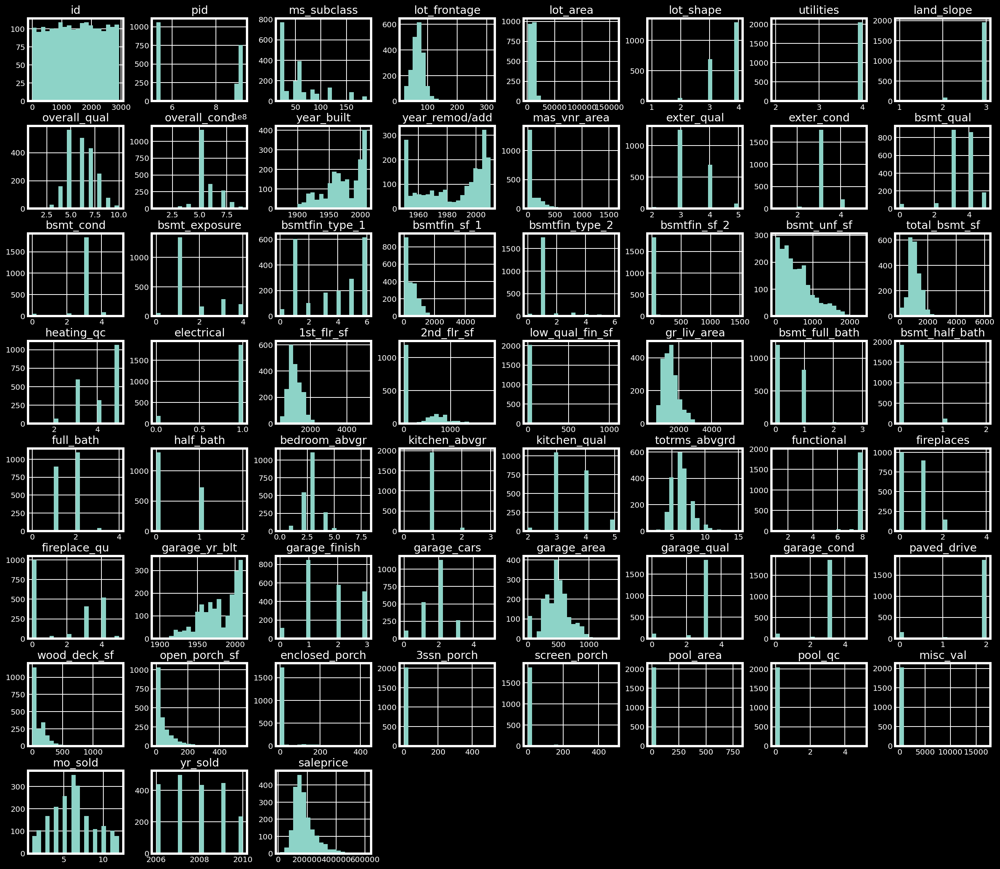

In [139]:
with plt.style.context('dark_background'):
    df_train.hist(figsize=(20,20), bins=20);

In [140]:
geo_heatmap = {
    'neighborhood' : ['Landmrk', 'GrnHill', 'Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr', 'Crawfor', 'Edwards',\
        'Gilbert', 'IDOTRR','MeadowV', 'Mitchel', 'NAmes', 'NoRidge', 'NPkVill', 'NridgHt', 'NWAmes','OldTown',\
        'SWISU','Sawyer','SawyerW', 'Somerst', 'StoneBr', 'Timber','Veenker', 'Greens'],\
    'Latitude' : [42.026798, 42.1415006, 42.0563761, 42.0218678, 42.052795, 42.024546, 42.0360959, 42.0214232, 42.028025, 42.0154024,\
        42.1068177, 42.0204395, 41.997282, 41.9903084, 42.046618, 42.048164, 42.0258352, 42.0597732, 42.0457802,\
        42.029046, 42.0266187, 42.0295218, 42.034611, 42.0508817, 42.0595539, 41.9999732, 42.0413042, 42.001350383364695],\
    'Longitude' : [-93.620178, -124.3428777, -93.6466598, -93.6702853, -93.6310097, -93.6545201, -93.6575849, -93.6584089, -93.6093286,
        -93.6875441, -93.6553512, -93.6243787, -93.6138098, -93.603242, -93.6362807, -93.6496766, -93.6613958,
        -93.65166, -93.6472075, -93.6165288, -93.6486541, -93.7102833, -93.7024257, -93.6485768, -93.6365891,
        -93.6518812, -93.6524905, -93.6446034587931]
}

In [141]:
ames_neighborhood = set(
    df_train['neighborhood'].tolist())

geo_dataframe = pd.DataFrame.from_dict(geo_heatmap)

geo_dataframe = geo_dataframe[geo_dataframe['neighborhood'].isin(ames_neighborhood)]

geo_dataframe["saleprice"] = pd.Series(df_train.groupby(["neighborhood"]).mean()["saleprice"].values,\
                                       index = geo_dataframe.index)

import folium
from folium.plugins import HeatMap
max_amount = float(geo_dataframe['saleprice'].max())
hmap = folium.Map(location = [42.045042,-93.6473567], zoom_start = 12)
hm_wide = HeatMap(list(zip(geo_dataframe.Latitude.values, geo_dataframe.Longitude.values,\
                              geo_dataframe.saleprice.values)),
                   min_opacity = 0.4,
                       radius = 40,
                   blur = 20,
                   max_zoom = 1)

In [142]:
hmap.add_child(hm_wide)

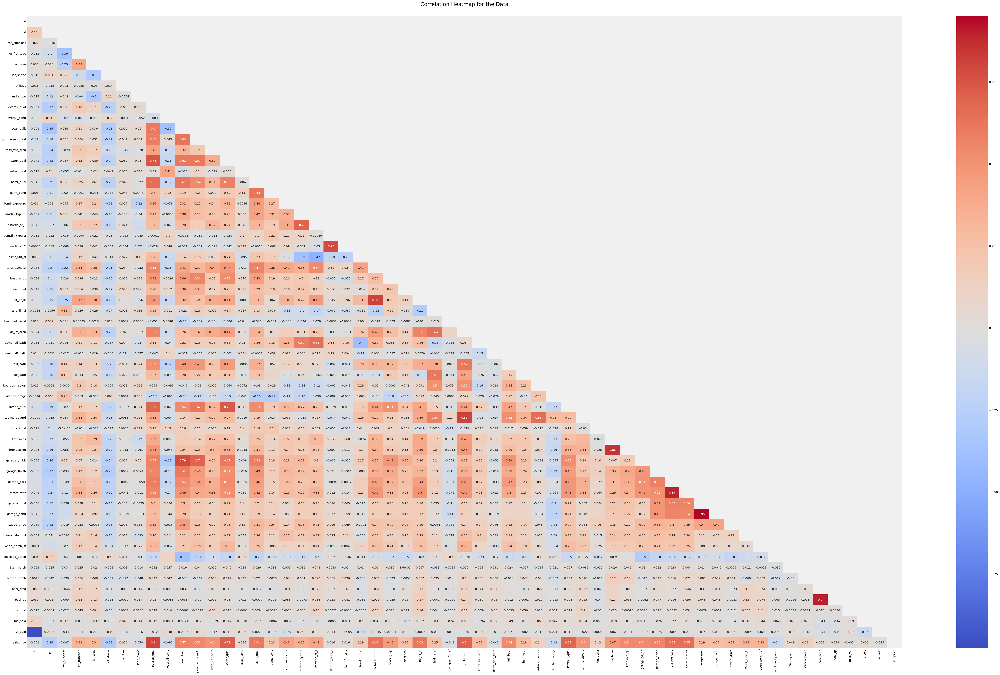

In [143]:
# define the mask to set the values in the upper triangle to True
mask = np.zeros_like(df_train.corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(60, 40))
ax = sns.heatmap(
    df_train.corr(),
    cmap='coolwarm', #BrBG also can
    annot=True,
    mask = mask
)
ax.set_title('Correlation Heatmap for the Data\n', fontdict={'fontsize':18}, pad=16);

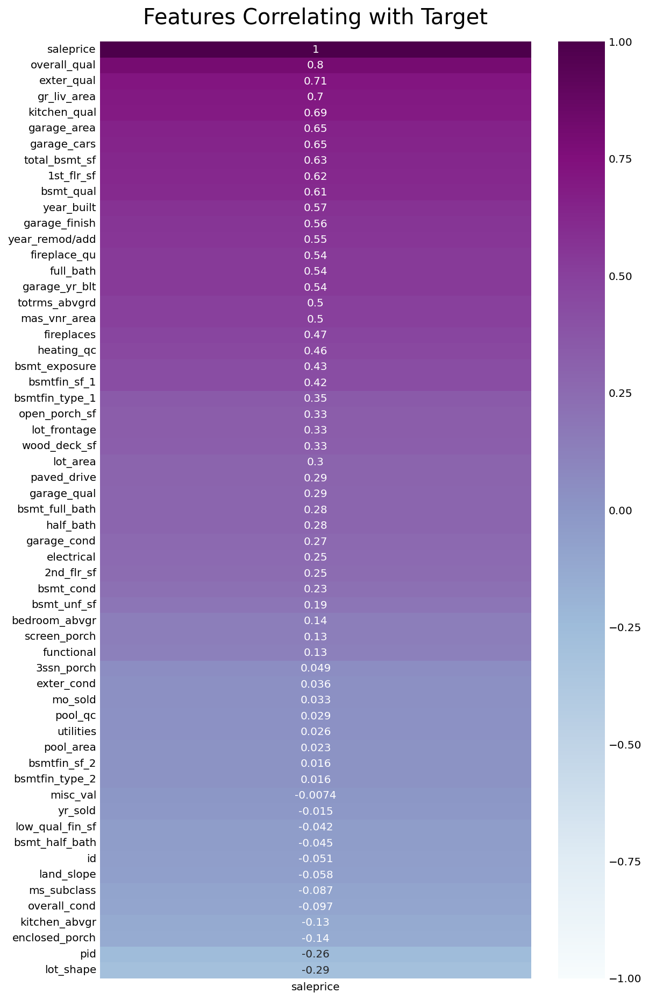

In [144]:
plt.figure(figsize=(8, 16))
heatmap = sns.heatmap(df_train.corr()[['saleprice']].sort_values(by='saleprice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BuPu')
heatmap.set_title('Features Correlating with Target', fontdict={'fontsize':20}, pad=16);

<Figure size 1152x648 with 0 Axes>

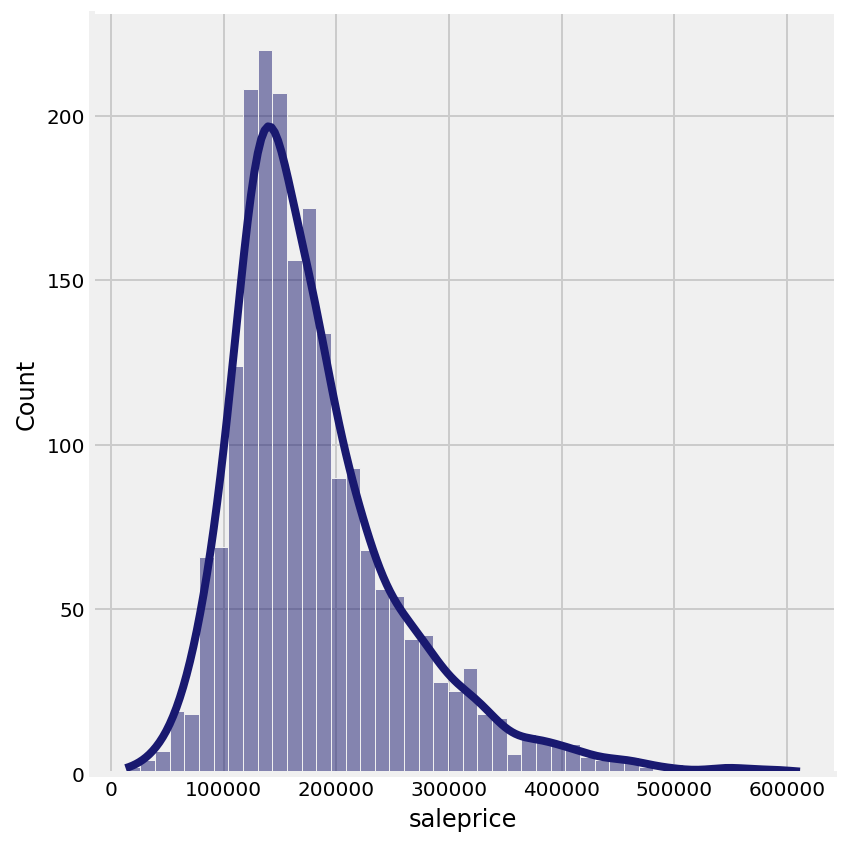

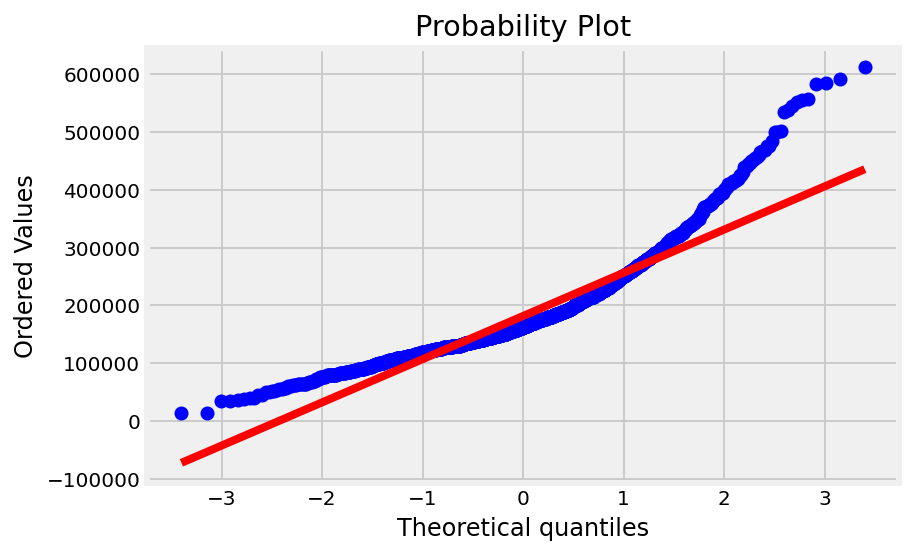

In [145]:
# normalisation check
# check the histgram and probplot to see whether the target feature is normal distributed
from scipy import stats

plt.figure(figsize=(16,9))
sns.displot(data=df_train, x='saleprice', kde=True, color= 'midnightblue', height=6)
fig = plt.figure()
pro = stats.probplot(df_train['saleprice'], plot=plt);

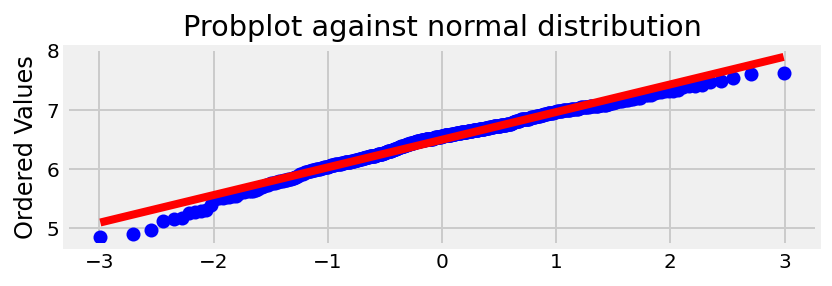

In [146]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

### Overall Quality

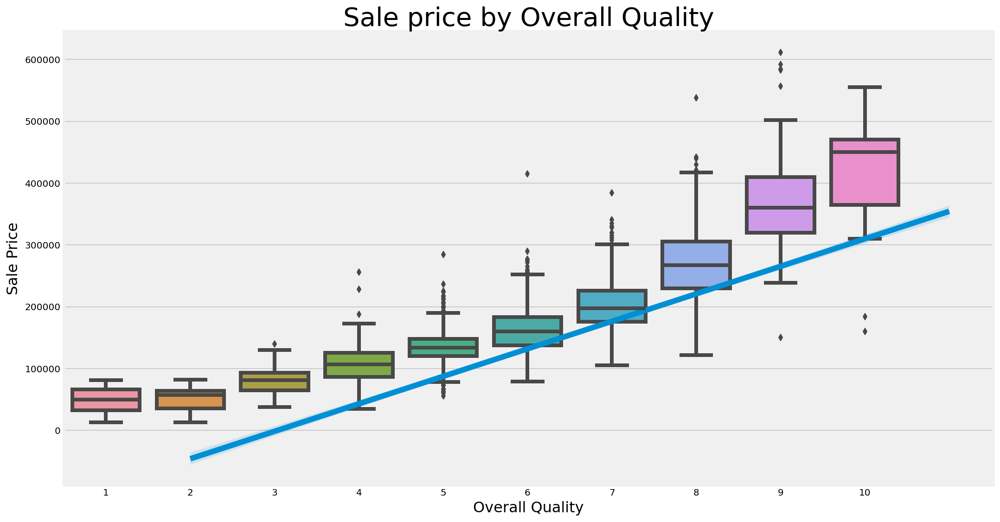

In [147]:
plt.figure(figsize=(16,9))
sns.boxplot(x='overall_qual', y='saleprice', data=df_train)
sns.regplot(x='overall_qual', y='saleprice', data=df_train, scatter=False)
plt.title('Sale price by Overall Quality', fontsize=28)
plt.xlabel('Overall Quality', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

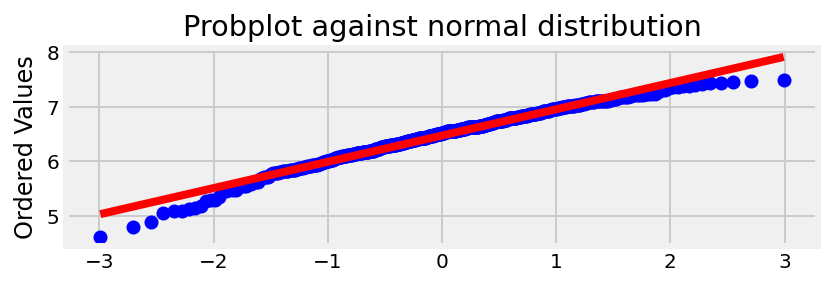

In [148]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

Sale price rises with higher overall quality. Quality from 8 to 10 increased significantly higher.

### Neighborhood Features

<Figure size 432x288 with 0 Axes>

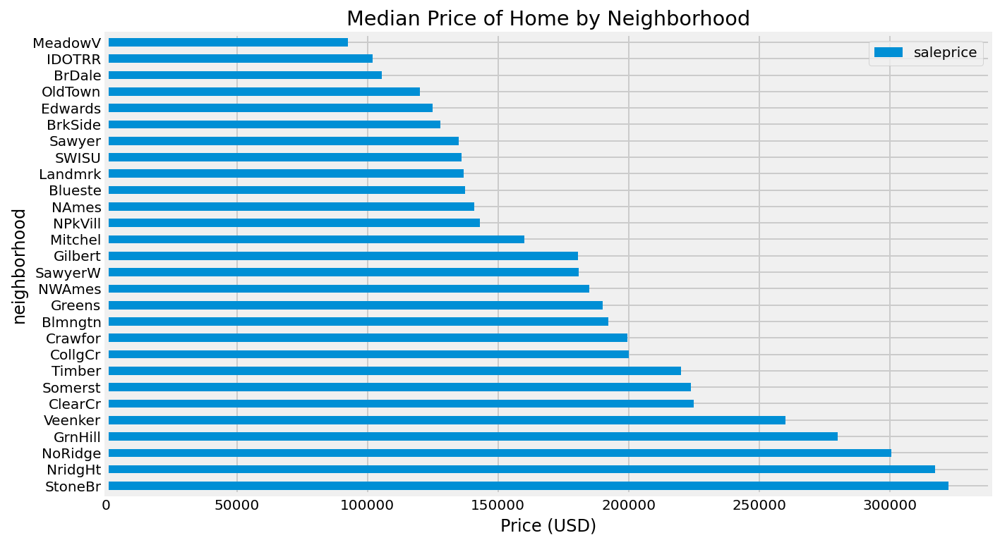

In [149]:
# plot median price by neighborhood
fig = plt.figure()
a = pd.DataFrame(df_train.groupby('neighborhood')['saleprice'].median().sort_values(ascending = False))
a.plot.barh(figsize = (10,6))
plt.xlabel('Price (USD)')
plt.title('Median Price of Home by Neighborhood')
fig.savefig('neighborhoodprice.jpg');

In [150]:
df_train['neighborhood_order'] = ((df_train['overall_qual'] / df_train['overall_qual'].mean()) 
                        + (df_train['overall_cond'] / df_train['overall_cond'].mean())
                        + (df_train['exter_qual'] / df_train['exter_qual'].mean())
                        + (df_train['exter_cond'] / df_train['exter_cond'].mean()) 
                        + (df_train['functional'] / df_train['functional'].mean()))

In [151]:
# Find the median of the neighborhood
df_train['neighborhood_order'].median()

5.04714101813854

In [152]:
# Find the mean of the neighborhood order values of the respective neighbourhoods
df_train['neighborhood_order'].groupby([df_train['neighborhood']]).mean().sort_values()

neighborhood
IDOTRR     4.468456
MeadowV    4.647930
Edwards    4.698619
Landmrk    4.753554
BrDale     4.777785
SWISU      4.783909
Sawyer     4.790745
NAmes      4.828112
BrkSide    4.851064
Mitchel    4.867143
ClearCr    4.887765
OldTown    4.912471
NPkVill    4.935276
Gilbert    5.003039
SawyerW    5.044173
NWAmes     5.074415
CollgCr    5.132777
Crawfor    5.184499
GrnHill    5.210750
Blueste    5.218332
Blmngtn    5.240497
Timber     5.242988
Somerst    5.285908
NoRidge    5.420739
Veenker    5.433313
Greens     5.434287
NridgHt    5.521026
StoneBr    5.546798
Name: neighborhood_order, dtype: float64

With the median at 5, I will use that as the threshold to categorise the neighborhood into 4 different values (1 (low), 2 (mid-low), 3 (mid-high) and 4 (high) instead of dummy which will be more meaningful in terms of machine learning. There are a total of 28 neighborhoods.

In [153]:
# Create a dictionary for neighborhood ordinal 
neighborhood_ord = {'MeadowV': 1, 'IDOTRR' : 1, 'Edwards': 1, 'Landmrk':1, 'BrDale' : 1, 'SWISU': 1, 'Sawyer':1, 
                         'NAmes':2, 'BrkSide':2, 'Mitchel':2, 'ClearCr':2, 'OldTown':2, 'NPkVill':2, 'Gilbert':2,
                         'SawyerW':3, 'NWAmes':3, 'CollgCr':3, 'Crawfor':3, 'GrnHill':3, 'Blueste':3,  'Blmngtn':3, 
                         'Timber':4, 'Somerst':4, 'NoRidge':4, 'Veenker':4, 'Greens':4, 'NridgHt':4, 'StoneBr':4
                   }

In [154]:
df_train['neighborhood_order'] = df_train['neighborhood'].map(neighborhood_ord)

In [155]:
df_test['neighborhood_order'] = df_test['neighborhood'].map(neighborhood_ord)

In [156]:
# Check on the neighborhood values
print(df_train[['neighborhood_order']].dtypes)
df_train[['neighborhood','neighborhood_order']].T

neighborhood_order    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [157]:
# Check on the neighborhood values
print(df_test[['neighborhood_order']].dtypes)
df_test[['neighborhood','neighborhood_order']].T

neighborhood_order    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
neighborhood,OldTown,Sawyer,Gilbert,OldTown,NAmes,MeadowV,OldTown,CollgCr,Somerst,Mitchel,SawyerW,IDOTRR,NAmes,SawyerW,BrkSide,Edwards,OldTown,Edwards,NAmes,OldTown,Sawyer,Sawyer,SawyerW,ClearCr,SawyerW,CollgCr,NAmes,OldTown,NAmes,BrkSide,NAmes,IDOTRR,OldTown,NWAmes,CollgCr,Gilbert,OldTown,Sawyer,NAmes,Somerst,Somerst,Gilbert,NAmes,NAmes,Timber,MeadowV,CollgCr,SawyerW,NAmes,Sawyer,OldTown,OldTown,CollgCr,IDOTRR,BrkSide,NAmes,BrkSide,NAmes,NWAmes,CollgCr,NoRidge,Sawyer,Sawyer,NWAmes,SawyerW,NoRidge,NAmes,NridgHt,Edwards,CollgCr,BrkSide,NridgHt,Crawfor,Gilbert,NAmes,NWAmes,Mitchel,NAmes,NAmes

As there are 28 neighborhoods, I will catergorised it into ordinal values (1 (low), 2 (mid-low), 3 (mid-high) and 4 (high) instead of dummy which will be more meaningful in terms of machine learning.

In [158]:
df_train.groupby('neighborhood_order')['saleprice'].agg(['mean','count'])

,mean,count
neighborhood_order,,
1,124518.200501,399
2,150775.271808,791
3,198180.358242,455
4,278513.036946,406


The distribution is quite spread out. The first two values (1 & 2) total 58% of it.

Neighborhood and lot frontage seemed to be quite consistent.

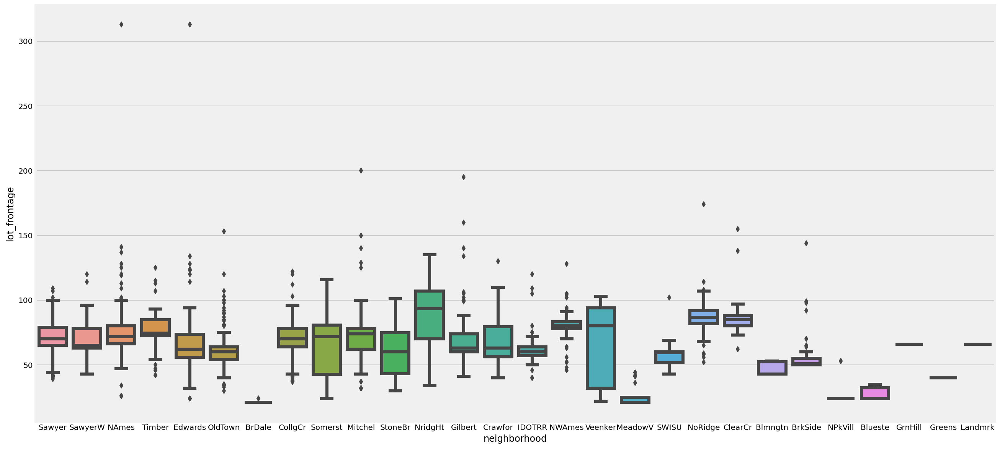

In [159]:
plt.figure(figsize=(20,10))
sns.boxplot(x=df_train['neighborhood'], y=df_train['lot_frontage']);

<Figure size 432x288 with 0 Axes>

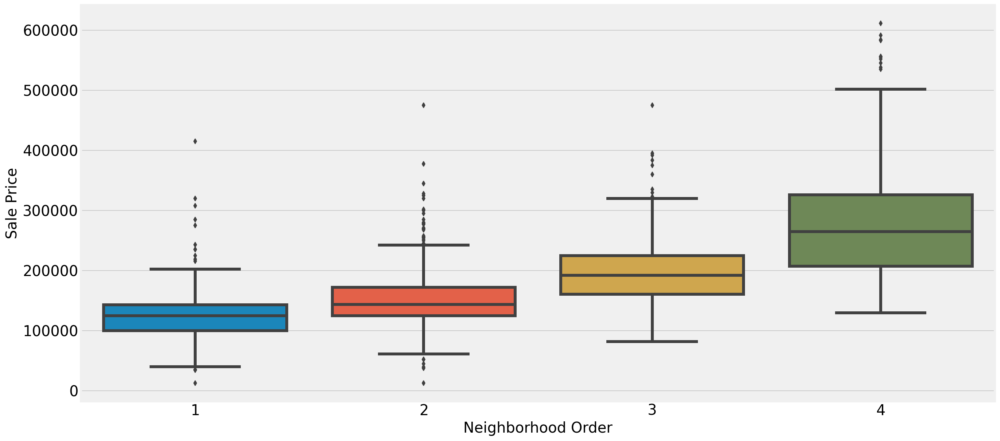

In [160]:
fig = plt.figure()
plt.figure(figsize=(20,10))
ax = sns.boxplot(x=df_train['neighborhood_order'], y=df_train['saleprice'])
ax.tick_params(axis='both', which='major', labelsize=20)
plt.xlabel('Neighborhood Order', fontsize=20)
plt.ylabel('Sale Price', fontsize=20)
plt.savefig('neighbororder.png');

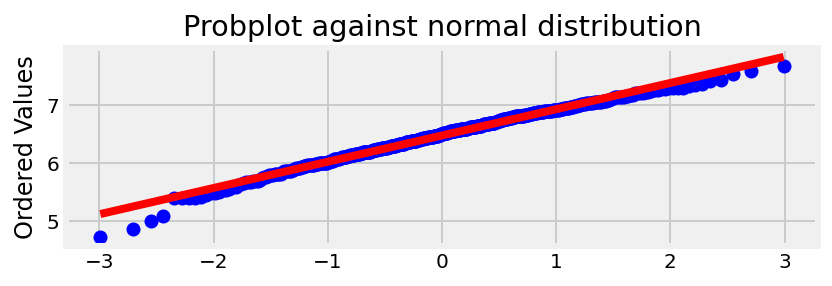

In [161]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

### Price per sqft
Creating price per square feet to have another illustration of the price

In [162]:
df_train['pricepsf'] = df_train['saleprice'] / df_train['gr_liv_area']

In [163]:
print(df_train['saleprice'].mean())
print(df_train['pricepsf'].mean())

181469.70160897123
121.68578646926724


In [164]:
# Positive correlation between 'SalePrice' and 'PriceSF' with 'Location'
print(df_train['saleprice'].groupby(df_train['neighborhood_order']).mean())
print(df_train['pricepsf'].groupby(df_train['neighborhood_order']).mean())

neighborhood_order
1    124518.200501
2    150775.271808
3    198180.358242
4    278513.036946
Name: saleprice, dtype: float64
neighborhood_order
1    103.592002
2    112.612708
3    126.837371
4    151.371141
Name: pricepsf, dtype: float64


In [165]:
# Total mean house size also rises with 'Location'
print(df_train['gr_liv_area'].groupby(df_train['neighborhood_order']).mean())
print(df_train['gr_liv_area'].groupby(df_train['neighborhood_order']).median())

neighborhood_order
1    1262.233083
2    1383.007585
3    1598.542857
4    1847.780788
Name: gr_liv_area, dtype: float64
neighborhood_order
1    1125.0
2    1344.0
3    1582.0
4    1717.0
Name: gr_liv_area, dtype: float64


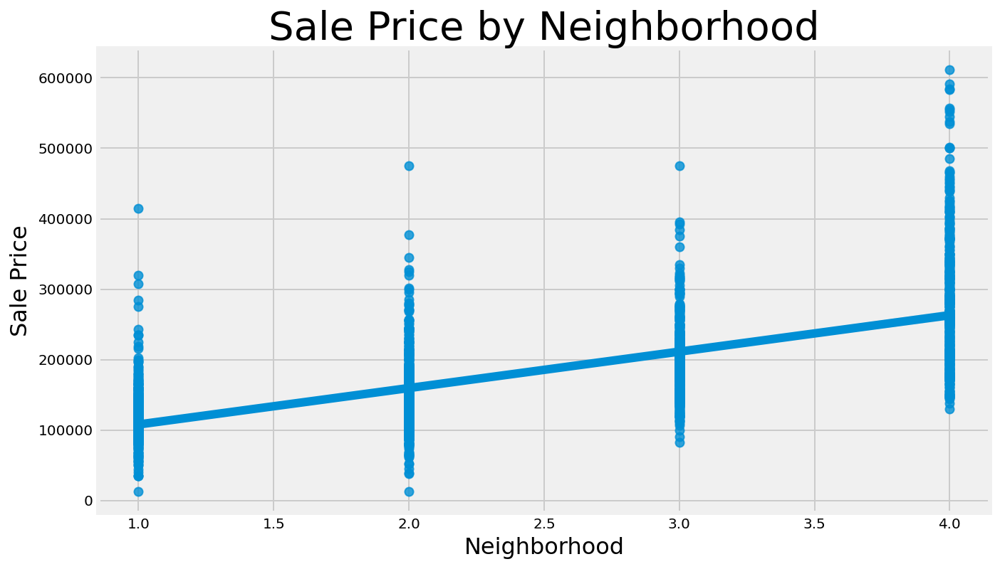

In [166]:
plt.figure(figsize=(10,6))
sns.regplot(x='neighborhood_order', y='saleprice', data=df_train)
plt.title('Sale Price by Neighborhood', fontsize=28)
plt.xlabel('Neighborhood', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

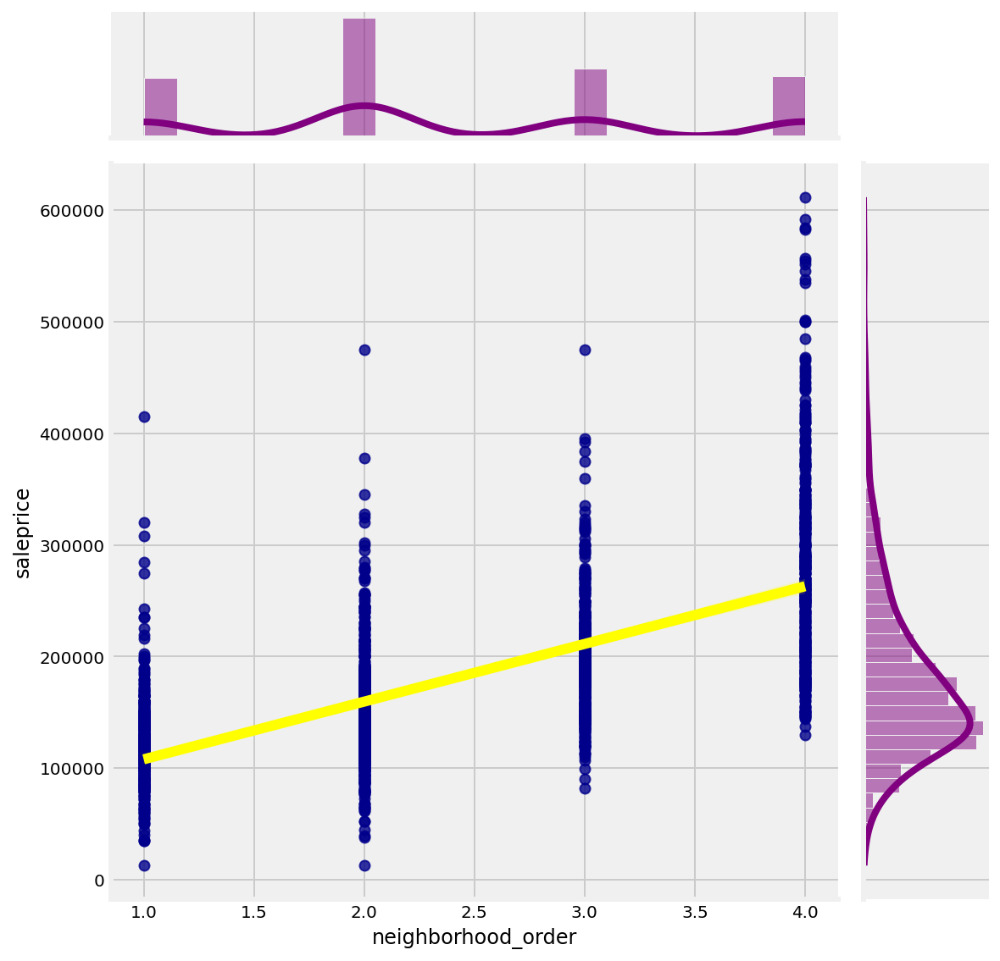

In [167]:
sns.jointplot(x=df_train['neighborhood_order'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### Positive Conditions 1 and 2
Next, let's examine the features that might affect the sale price of the neighborhood location such as green parks (positive) or railways and busy roads (negative)

In [168]:
# Proximity to various conditions from the house
# Value 2 for positive feature; Value 1 for normal and Value 0 for negative feature. 
# Artery-Adjacent to arterial street, Feedr-Adjacent to feeder street, Norm-Normal, RRNn-Within 200' of North-South Railroad
# RRAn-Adjacent to North-South Railroad, PosN-Near positive off-site feature--park, greenbelt, 
# PosA-Adjacent to postive off-site feature, RRNe-Within 200' of East-West Railroad, RRAe-Adjacent to East-West Railroad
        
df_train['positive_cond1'] = df_train['condition_1']
df_train['positive_cond2'] = df_train['condition_2']
df_train_cond1n2_columns = df_train[['positive_cond1', 'positive_cond2']]
cond1n2 = {'Artery':0, 'RRNe':0, 'RRAe':0, 'Feedr':0, 'RRAn':0,
                'Norm':1, 'RRNn':0, 'PosN':2, 'PosA':2,
               }
df_train_cond1n2_columns.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [169]:
# Proximity to various conditions from the house
# Value 2 for positive feature; Value 1 for normal and Value 0 for negative feature. 
# Artery-Adjacent to arterial street, Feedr-Adjacent to feeder street, Norm-Normal, RRNn-Within 200' of North-South Railroad
# RRAn-Adjacent to North-South Railroad, PosN-Near positive off-site feature--park, greenbelt, 
# PosA-Adjacent to postive off-site feature, RRNe-Within 200' of East-West Railroad, RRAe-Adjacent to East-West Railroad
        
df_test['positive_cond1'] = df_test['condition_1']
df_test['positive_cond2'] = df_test['condition_2']
df_test_cond1n2_columns = df_test[['positive_cond1', 'positive_cond2']]
cond1n2 = {'Artery':0, 'RRNe':0, 'RRAe':0, 'Feedr':0, 'RRAn':0,
                'Norm':1, 'RRNn':0, 'PosN':2, 'PosA':2,
               }
df_test_cond1n2_columns.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
positive_cond1,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Feedr,Norm,Artery,Norm,Norm,PosA,Artery,Norm,Feedr,Norm,Norm,Norm,Norm,Feedr,Artery,Feedr,Feedr,Norm,Norm,Norm,Norm,Norm,RRAn,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Feedr,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Feedr,Feedr,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Feedr,Feedr,Norm,Norm,Norm,Norm,Artery,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Norm,Feedr,Norm,Norm,Norm,Feedr,Norm,Norm,RRNn,No

In [170]:
# Convert to ordinal values
for i in df_train_cond1n2_columns.columns:
    df_train.replace({i: cond1n2},inplace = True)
df_train['local_conditions'] = df_train['positive_cond1'] + df_train['positive_cond2'] 

In [171]:
# Convert to ordinal values
for i in df_test_cond1n2_columns.columns:
    df_test.replace({i: cond1n2},inplace = True)
df_test['local_conditions'] = df_test['positive_cond1'] + df_test['positive_cond2'] 

In [172]:
# Check on the neighborhood values
print(df_train[['local_conditions']].dtypes)
df_train[['local_conditions','condition_1', 'condition_2']].T

local_conditions    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [173]:
# Check on the neighborhood values
print(df_test[['local_conditions']].dtypes)
df_test[['local_conditions','condition_1', 'condition_2']].T

local_conditions    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
local_conditions,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,1,2,2,3,1,2,1,2,2,2,2,1,1,1,1,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,0,2,2,1,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,1,1,2,2,2,2,2,1,2,1,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,4,2,2,1,2,1,2,2,2,2,2,2,2,2,2,2,2,1,1,2,2,2,2,2,2,2,2,2,2,1,2,1,2,2,2,2,2,2,2,2,1,1,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,2,3,1,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2,

In [174]:
df_train['local_conditions'].value_counts()

2    1768
1     224
3      34
0      20
4       5
Name: local_conditions, dtype: int64

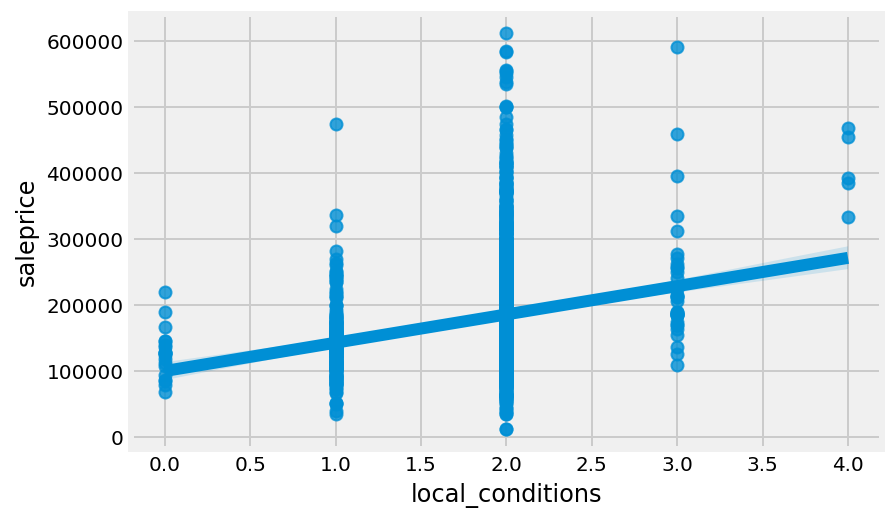

In [175]:
sns.regplot(x=df_train['local_conditions'],y=df_train['saleprice']);

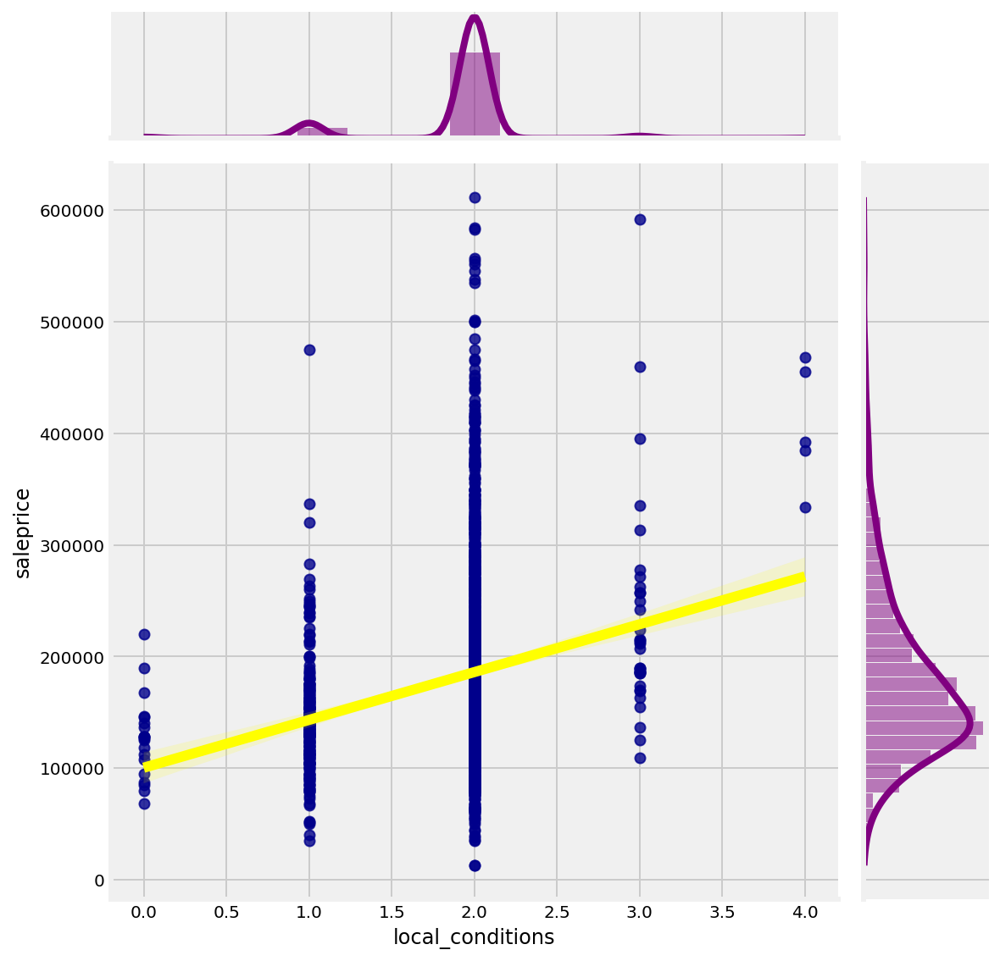

In [176]:
sns.jointplot(x=df_train['local_conditions'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### Sale Type Order

In [177]:
# Create a dictionary for sales type ordinal 
sale_type_ord = {'ConLw':1, 'Oth':1, 'ConLD':1, 'COD':1, 'VWD':1, 'WD':2, 'WD ': 2, 'CWD':3, 'ConLI':3, 'Con':3, 'New':3}

In [178]:
df_train['sale_type_order'] = df_train['sale_type'].map(sale_type_ord)

In [179]:
df_test['sale_type_order'] = df_test['sale_type'].map(sale_type_ord)

In [180]:
# Check on the neighborhood values
print(df_train[['sale_type_order']].dtypes)
df_train[['sale_type','sale_type_order']].T

sale_type_order    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [181]:
# Check on the neighborhood values
print(df_test[['sale_type_order']].dtypes)
df_test[['sale_type','sale_type_order']].T

sale_type_order    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
sale_type,WD,WD,New,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,Con,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,New,WD,WD,WD,COD,New,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,VWD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,COD,WD,WD,WD,New,WD,WD,WD,COD,WD,WD,WD,WD,CWD,WD,WD,CWD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,New,New,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,New,WD,New,WD,WD,WD,WD,WD,WD,COD,WD,WD,WD,WD,WD,WD,ConLD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,New,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,WD,New,WD,WD,WD,WD,WD

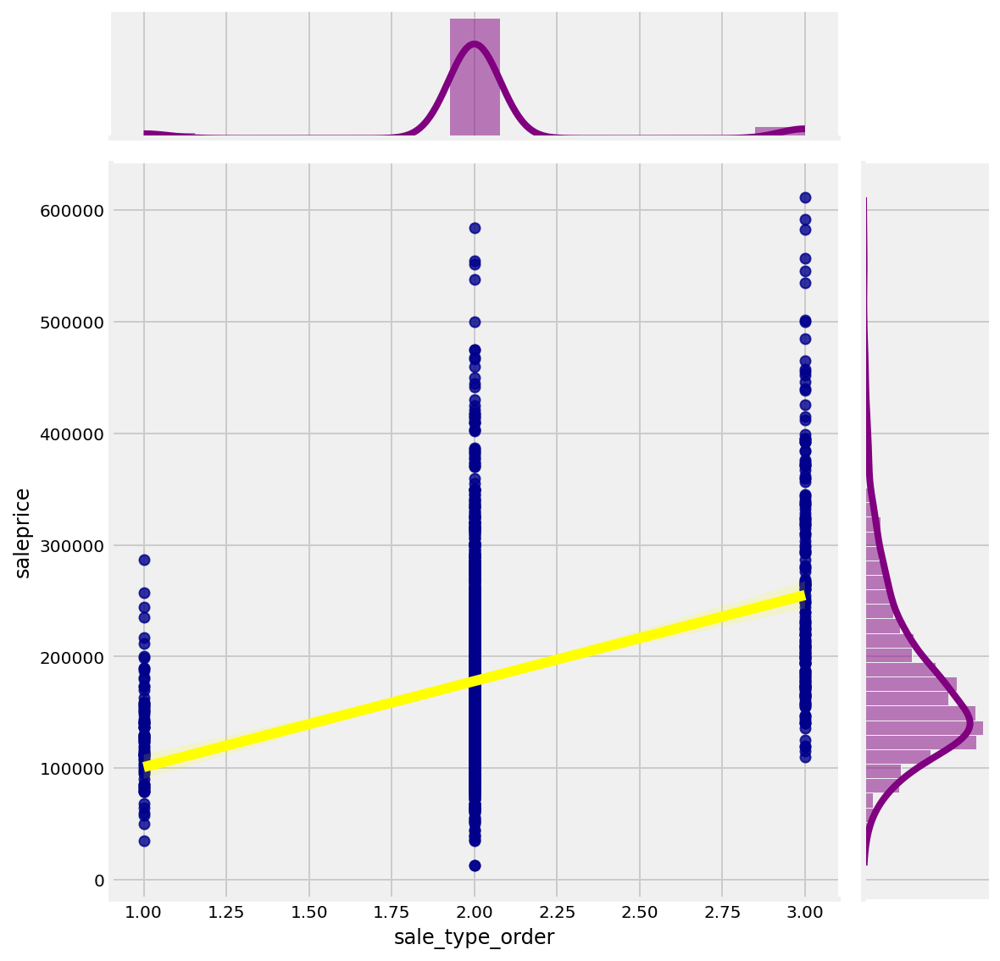

In [182]:
sns.jointplot(x=df_train['sale_type_order'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

In [183]:
df_train.groupby('sale_type')['saleprice'].mean().sort_values()

sale_type
ConLw    124600.000000
Oth      127497.750000
ConLD    129091.352941
COD      133574.523810
WD       174912.251544
CWD      186635.000000
ConLI    207992.857143
Con      241807.500000
New      279021.056250
Name: saleprice, dtype: float64

### Lot Frontage

Looking at the top 3, sale price for new housing sold with better pricing and showed that new loan and higher downpayment 15%, or with low interest makes better pricing.

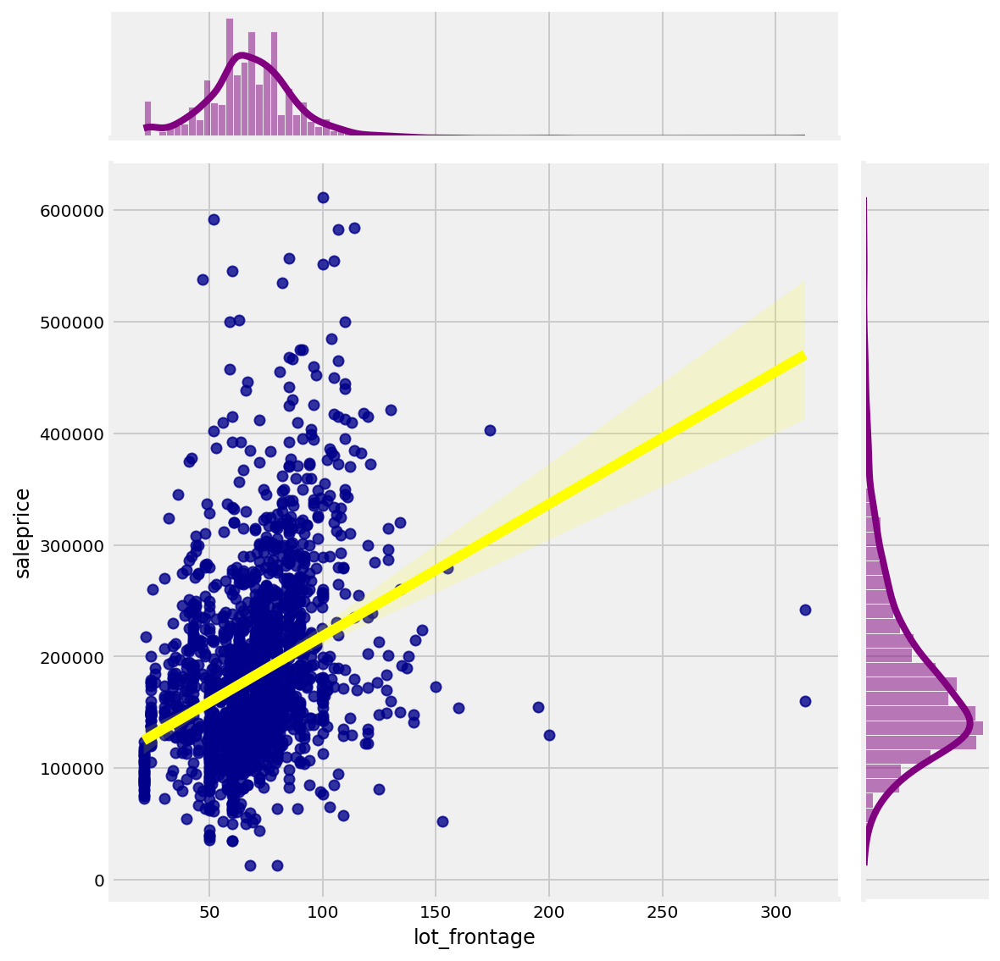

In [184]:
sns.jointplot(x=df_train['lot_frontage'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

There are outliners to the scatterplot and need to remove it to show a better linear regression model. It looked much better after removing the outliners.

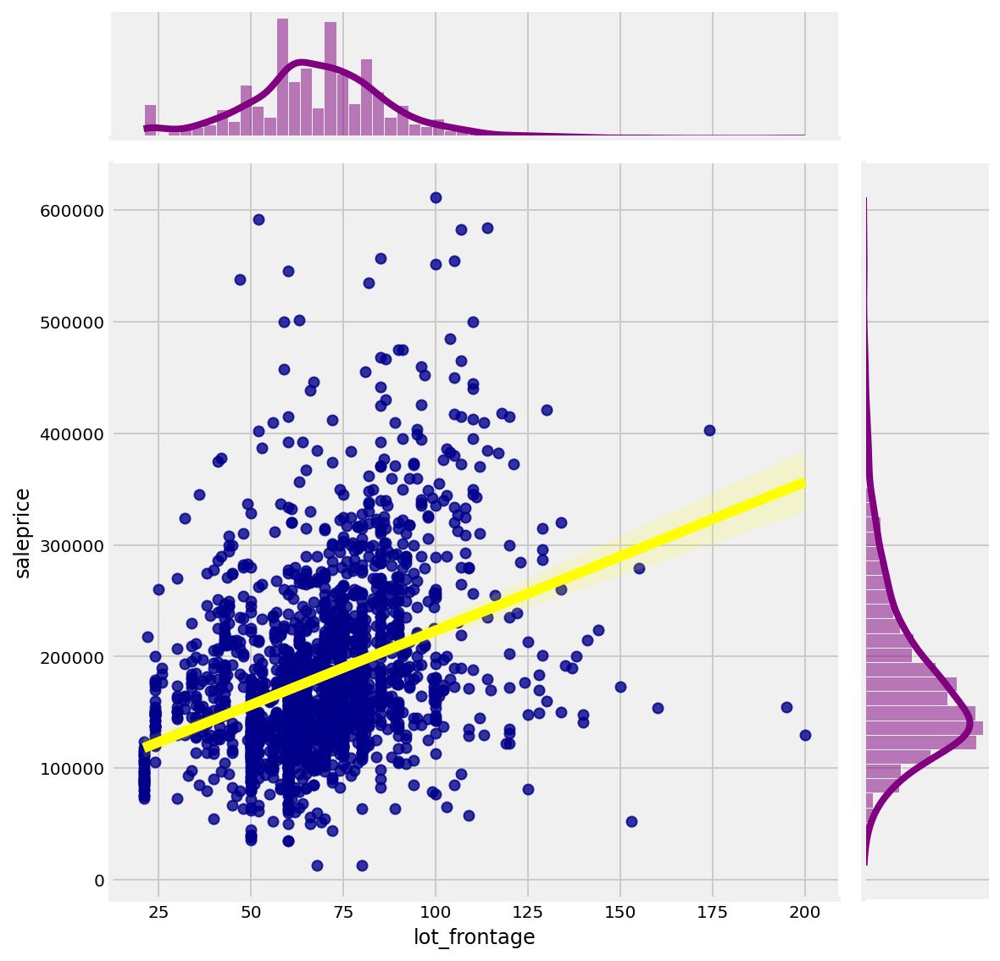

In [185]:
x_frontage = df_train[df_train['lot_frontage'] < 313]
sns.jointplot(x=x_frontage['lot_frontage'], y=x_frontage['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

In [186]:
# Removing the 2 outliners of more than 250 in lot_frontage
df_train = df_train.drop(df_train[(df_train['lot_frontage']> 250)].index)

In [187]:
df_train['lot_frontage'].min()

21.0

In [188]:
df_train['lot_frontage'].max()

200.0

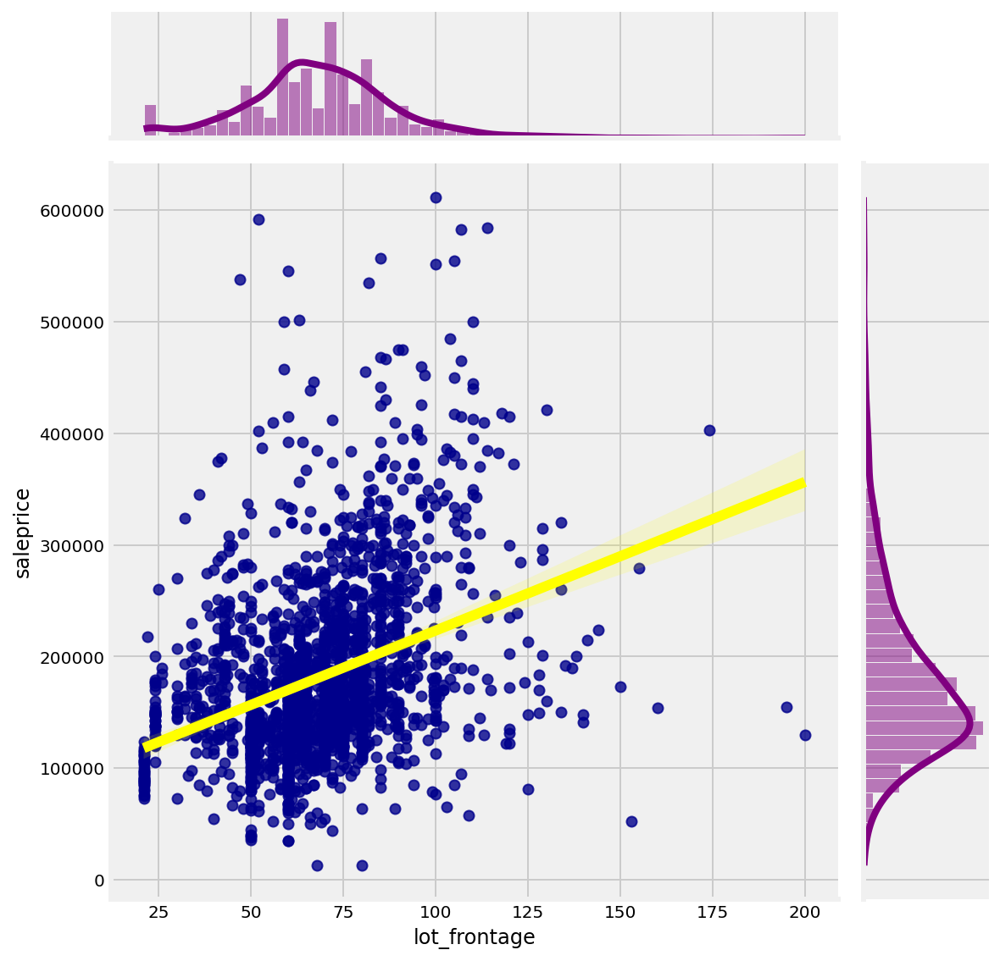

In [189]:
sns.jointplot(x=df_train['lot_frontage'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### House Age and Year Built 

Let's find out more on the Year Built, Year Remod/Add and then determine the Age of the house

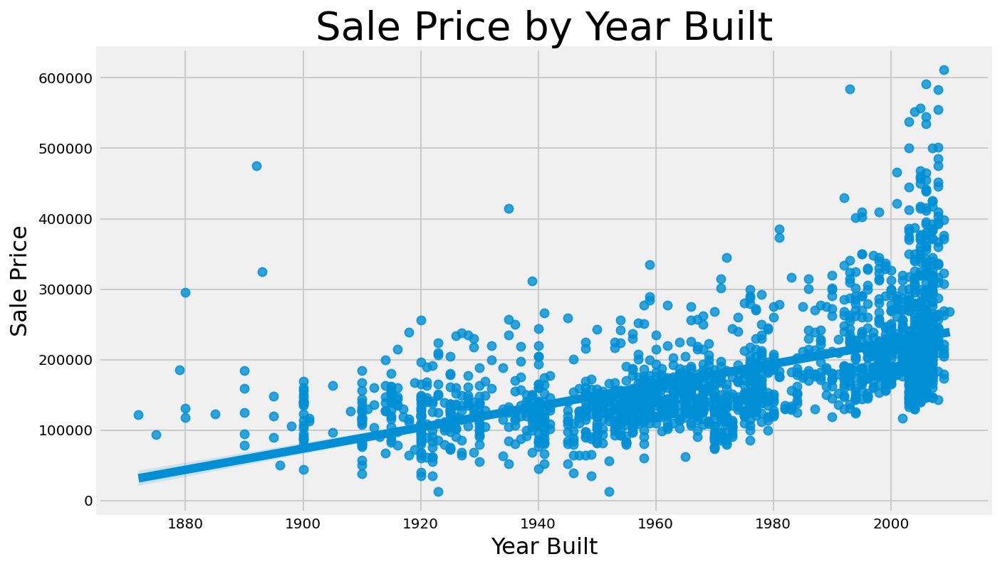

In [190]:
plt.figure(figsize=(10,6))
sns.regplot(x='year_built', y='saleprice', data=df_train)
plt.title('Sale Price by Year Built', fontsize=28)
plt.xlabel('Year Built', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

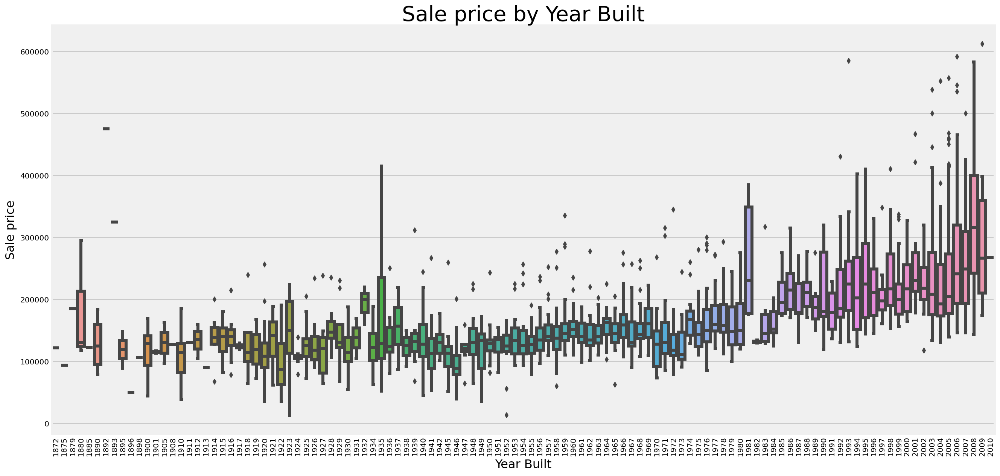

In [191]:
plt.figure(figsize=(20,10))
sns.boxplot(x='year_built', y='saleprice', data= df_train)
plt.title('Sale price by Year Built', fontsize=28)
plt.xlabel('Year Built', fontsize=16)
plt.ylabel('Sale price', fontsize=16)
plt.xticks(size=10,rotation='vertical');

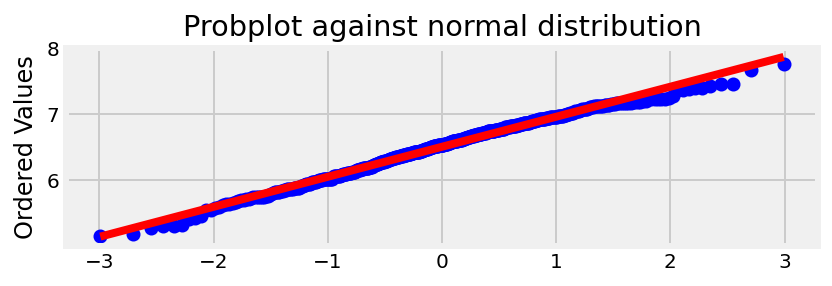

In [192]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

In [193]:
df_train[df_train['year_built'] > 1980]['saleprice'].median()

214000.0

In [194]:
df_train[df_train['year_built'] < 1980]['saleprice'].median()

135000.0

Starting from 1980, there is a jump in the median Sale Price of 214,000.

In [195]:
# Adding age variable comparing the year sold and the year built or if there is remod/add
df_train['age'] = df_train.apply(lambda x: x['yr_sold']- x['year_built'] if (x['year_built']<x['year_remod/add']) 
                                                           else (x['yr_sold']-x['year_remod/add']), axis=1)

In [196]:
# Adding age variable comparing the year sold and the year built or if there is remod/add
df_test['age'] = df_test.apply(lambda x: x['yr_sold']- x['year_built'] if (x['year_built']<x['year_remod/add']) 
                                                           else (x['yr_sold']-x['year_remod/add']), axis=1)

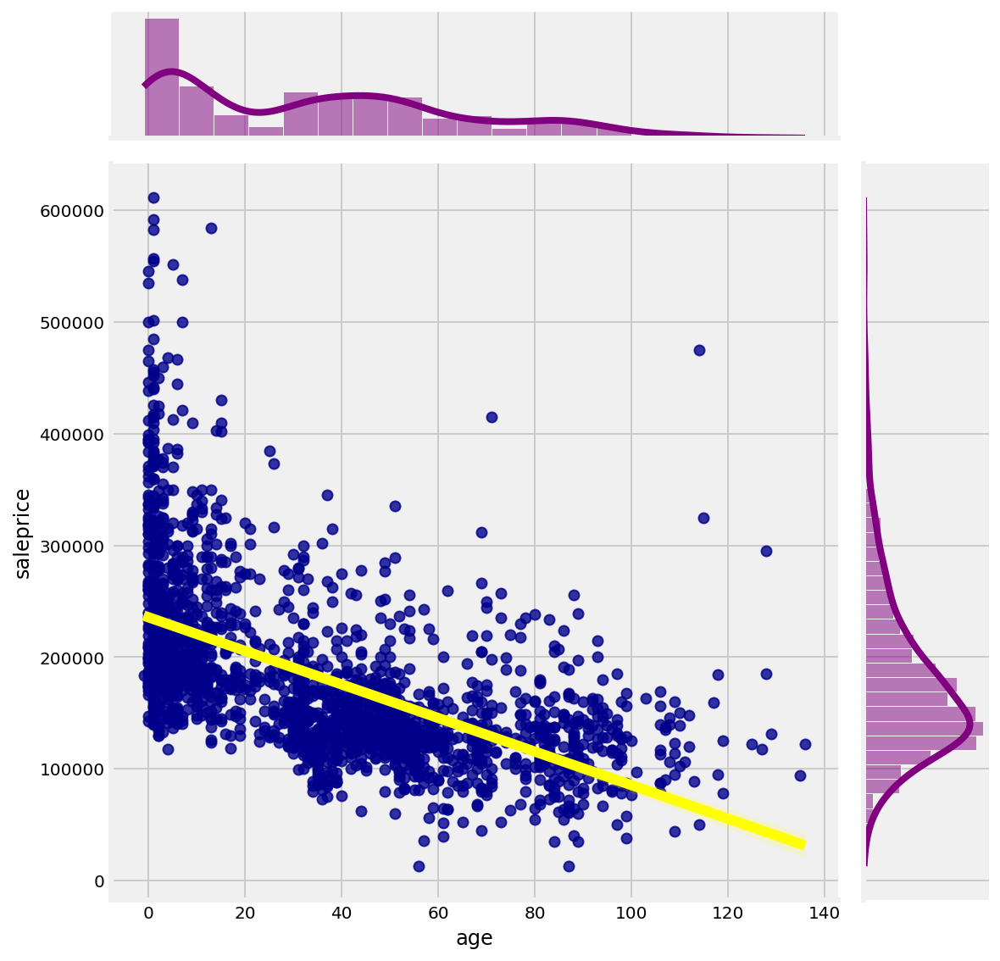

In [197]:
sns.jointplot(x=df_train['age'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### Year Remodeled or Additions

Two points to note here, At age 0 for new houses, the price are strong. The other view is that as the house age increases, the sale price decreases.

Now, we look into basement features and how we can relate to combine sf type 1 and 2.

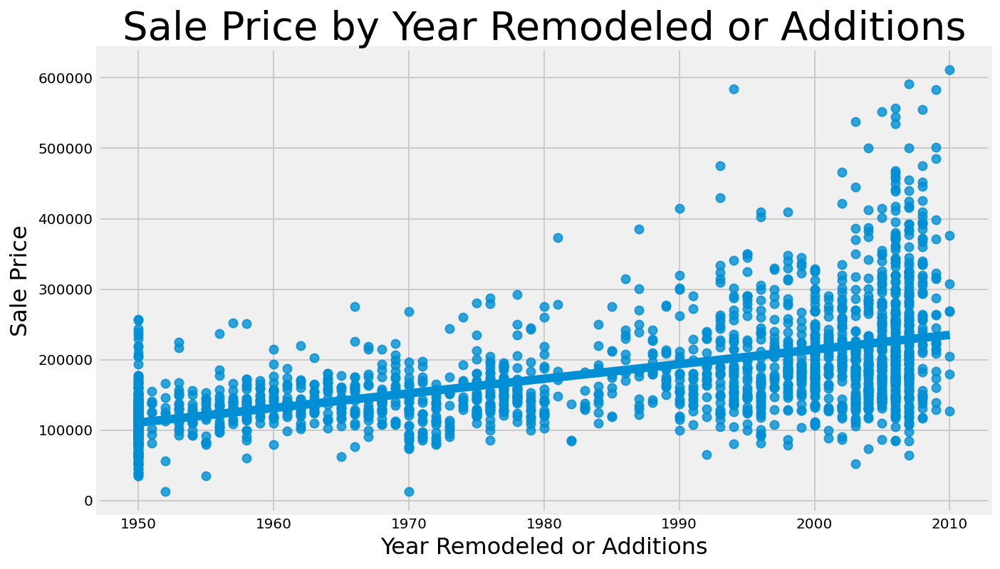

In [198]:
plt.figure(figsize=(10,6))
sns.regplot(x='year_remod/add', y='saleprice', data=df_train)
plt.title('Sale Price by Year Remodeled or Additions', fontsize=28)
plt.xlabel('Year Remodeled or Additions', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

In [199]:
# Dummified if house was remodeled
df_train['was_remodeled'] =  df_train['year_remod/add'] - df_train['year_built'] 
df_train['was_remodeled'] = [1 if i > 0 else 0 for i in df_train['was_remodeled']];

In [200]:
# Dummified if house was remodeled
df_test['was_remodeled'] =  df_test['year_remod/add'] - df_test['year_built'] 
df_test['was_remodeled'] = [1 if i > 0 else 0 for i in df_test['was_remodeled']];

### Basement Features

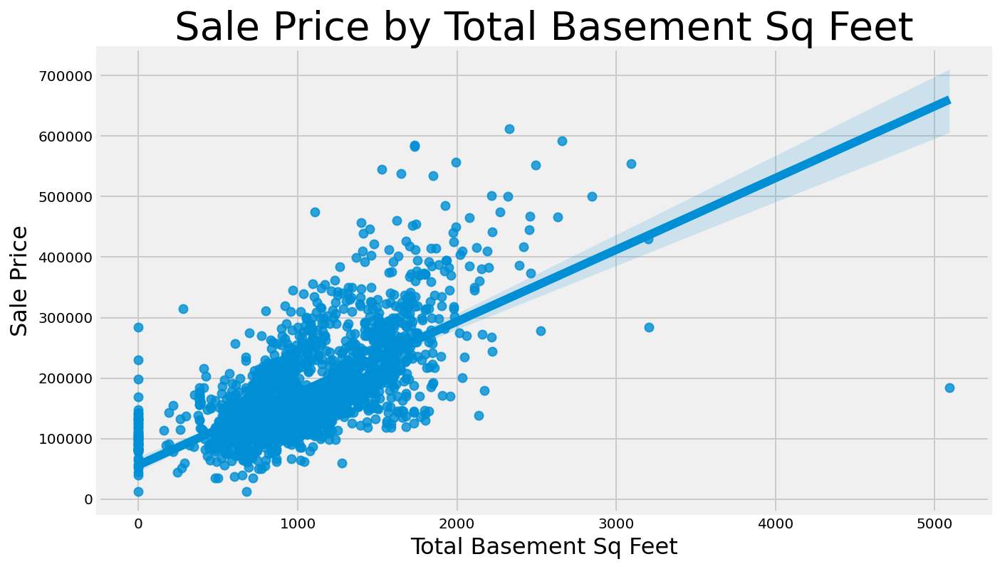

In [201]:
plt.figure(figsize=(10,6))
sns.regplot(x='total_bsmt_sf', y='saleprice', data=df_train)
plt.title('Sale Price by Total Basement Sq Feet', fontsize=28)
plt.xlabel('Total Basement Sq Feet', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

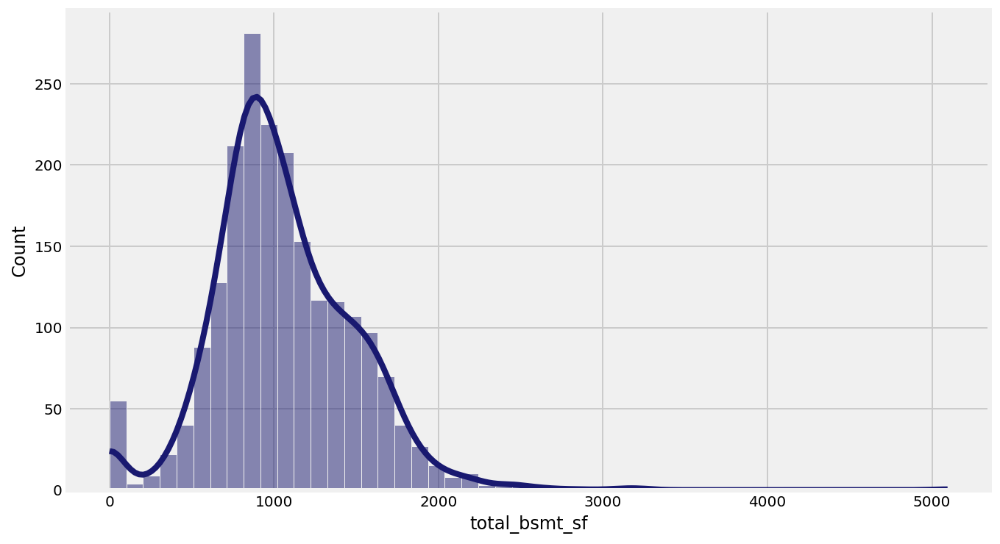

In [202]:
plt.figure(figsize=(10,6))
sns.histplot(data=df_train, x='total_bsmt_sf', kde=True, color= 'midnightblue', bins=50);

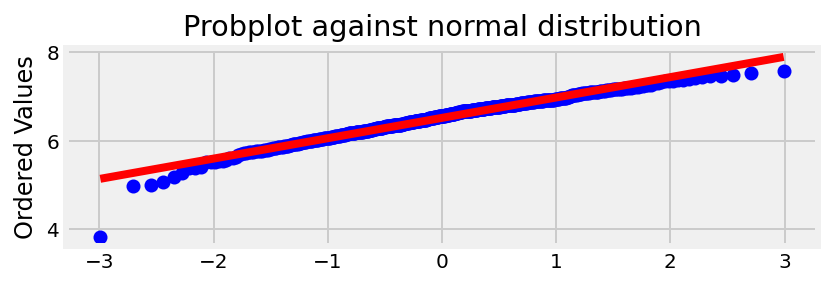

In [203]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

There are houses with basement but the number is much lower than the garage area. Also there are outliners in the total basement area.

Next, we consolidate all the type 1 and 2 and its sf into a single feature

In [204]:
df_train['bsmtfin_type_sf'] = (df_train['bsmtfin_type_1'] * df_train['bsmtfin_sf_1']) + (df_train['bsmtfin_type_2'] * df_train['bsmtfin_sf_2'])


In [205]:
df_test['bsmtfin_type_sf'] = (df_test['bsmtfin_type_1'] * df_test['bsmtfin_sf_1']) + (df_test['bsmtfin_type_2'] * df_test['bsmtfin_sf_2'])



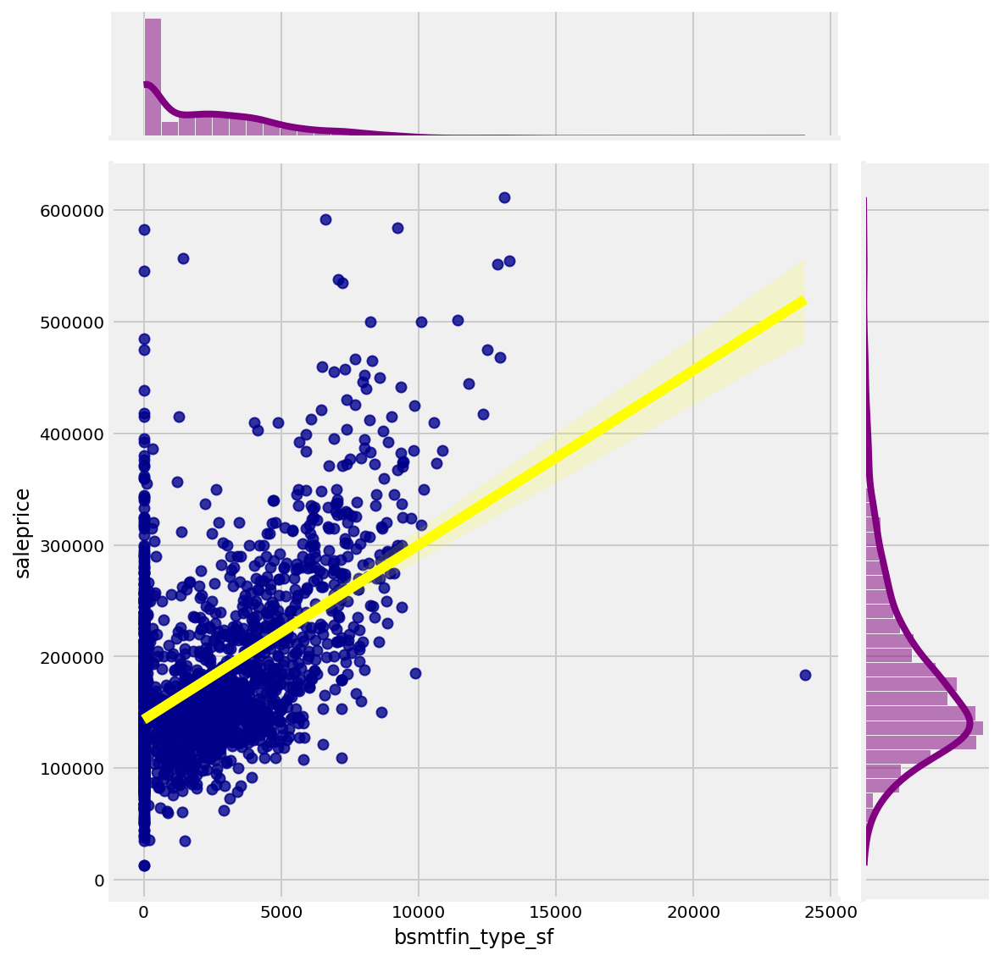

In [206]:
sns.jointplot(x=df_train['bsmtfin_type_sf'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

In [207]:
# Removing the 1 outliner of more than 20,000 in basement type 1 & 2 and sf
df_train = df_train.drop(df_train[(df_train['bsmtfin_type_sf']> 20000)].index)

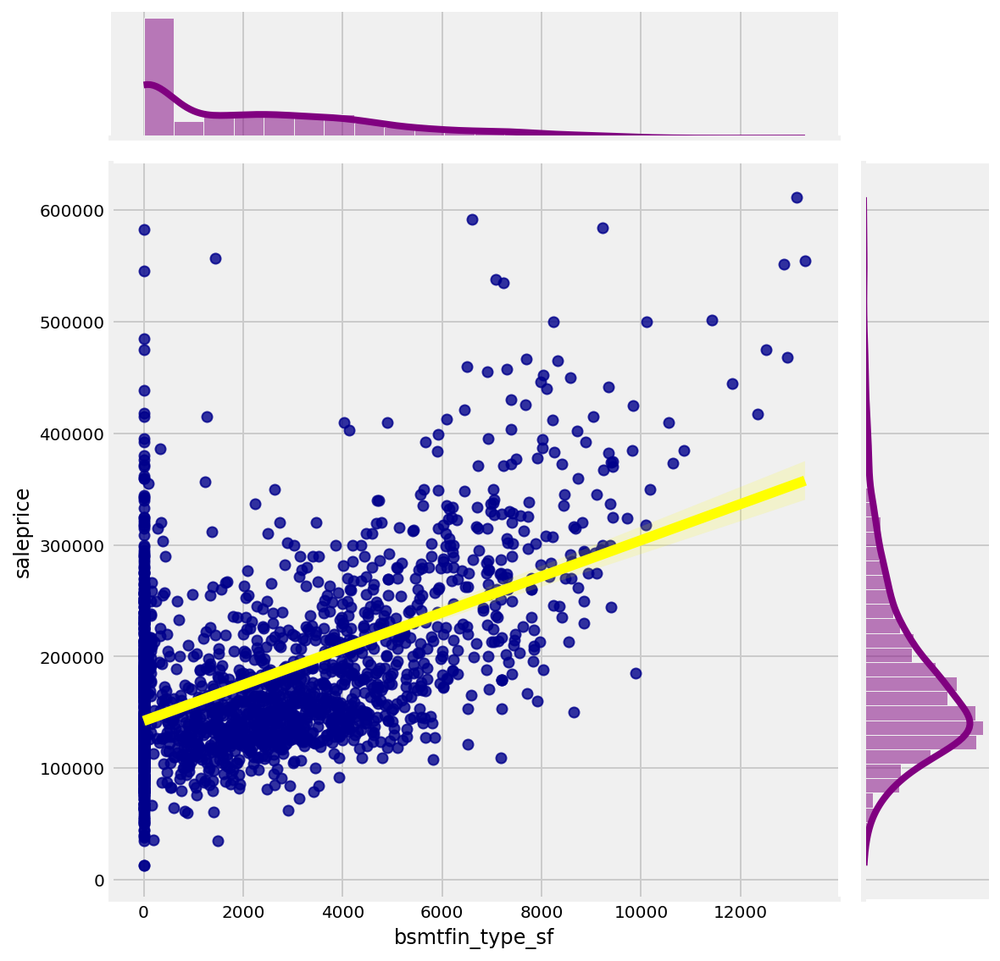

In [208]:
sns.jointplot(x=df_train['bsmtfin_type_sf'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

The data looked much better for modeling now. Next is to do the same for garage features.

### Garage Features

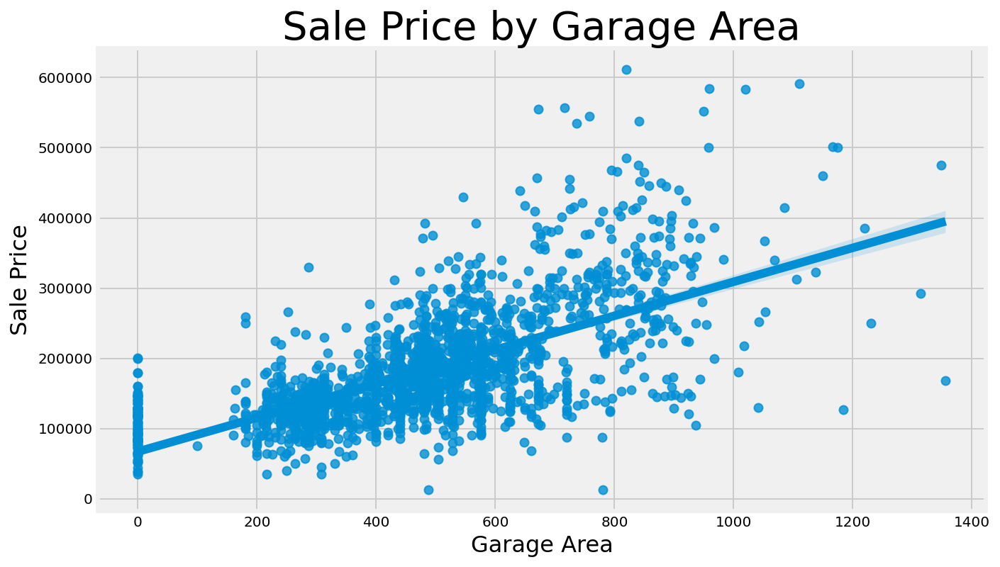

In [209]:
plt.figure(figsize=(10,6))
sns.regplot(x='garage_area', y='saleprice', data=df_train)
plt.title('Sale Price by Garage Area', fontsize=28)
plt.xlabel('Garage Area', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

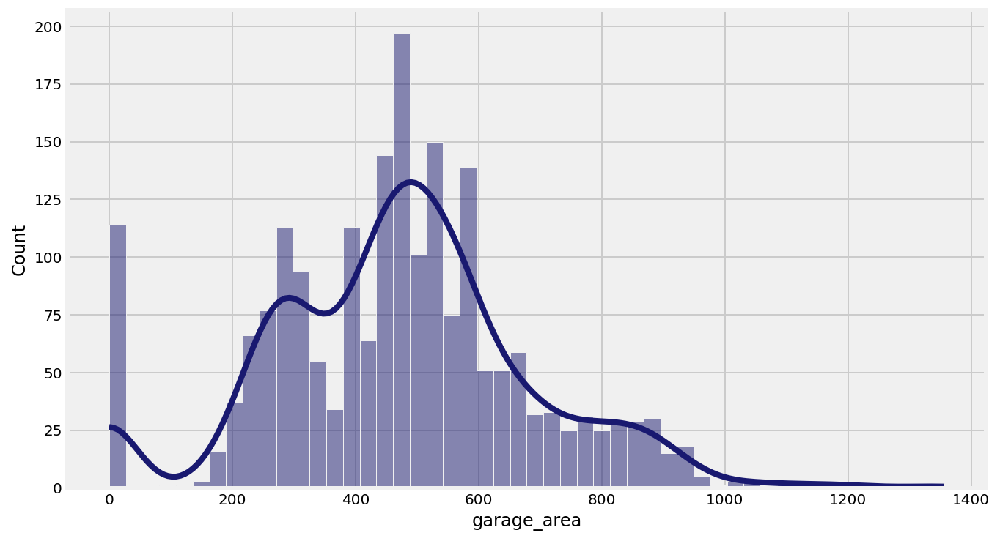

In [210]:
plt.figure(figsize=(10,6))
sns.histplot(data=df_train, x='garage_area', kde=True, color= 'midnightblue', bins=50);

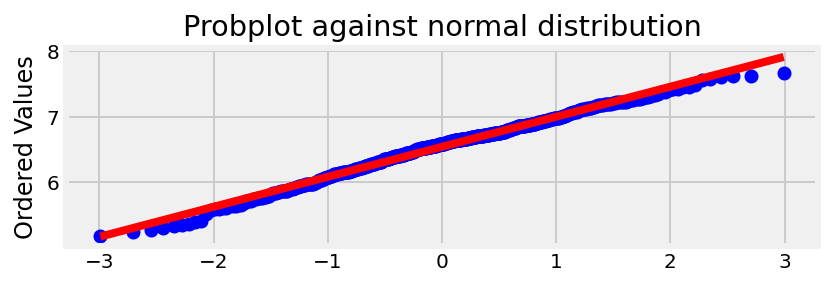

In [211]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

Large number without garage and the linear spread is very wide

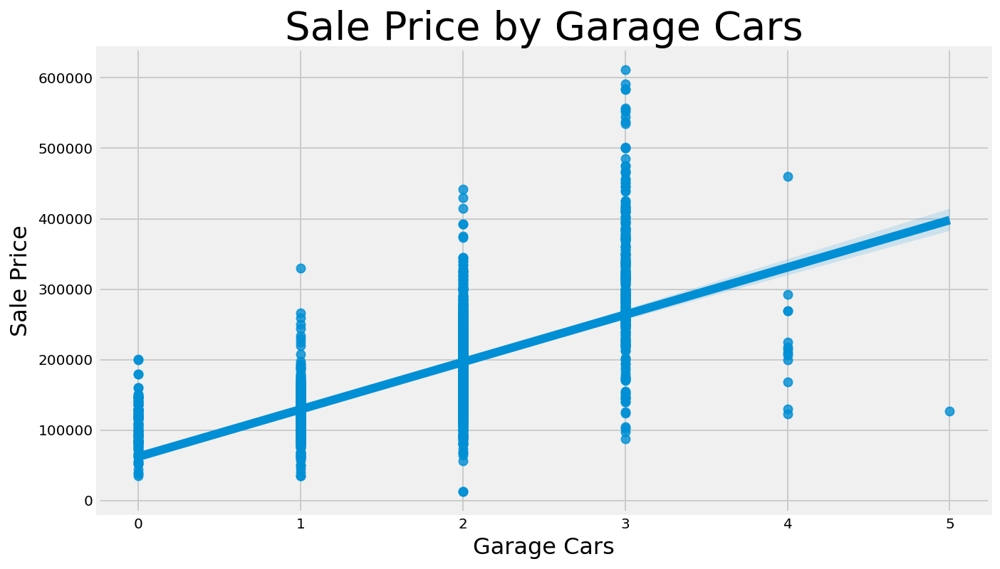

In [212]:
plt.figure(figsize=(10,6))
sns.regplot(x='garage_cars', y='saleprice', data=df_train)
plt.title('Sale Price by Garage Cars', fontsize=28)
plt.xlabel('Garage Cars', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

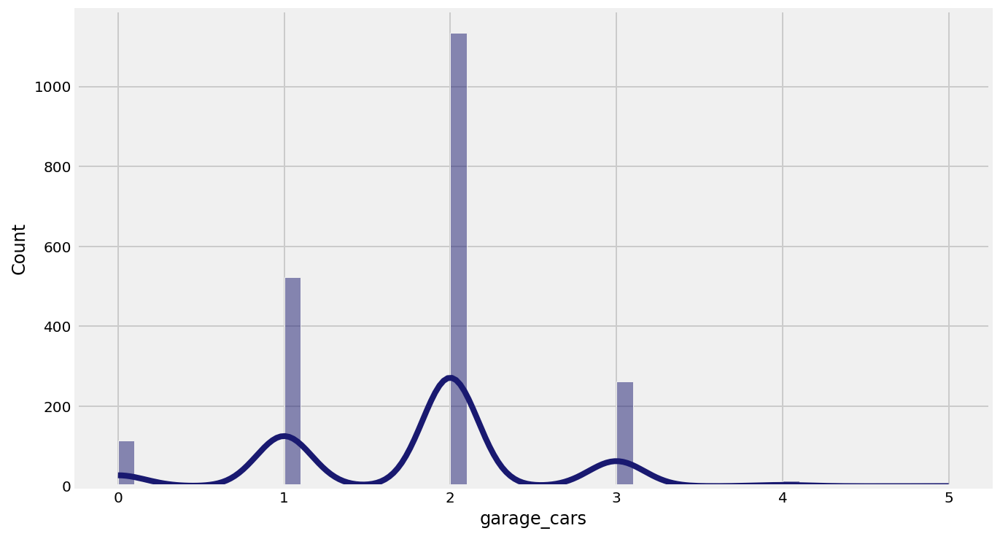

In [213]:
plt.figure(figsize=(10,6))
sns.histplot(data=df_train, x='garage_cars', kde=True, color= 'midnightblue', bins=50);

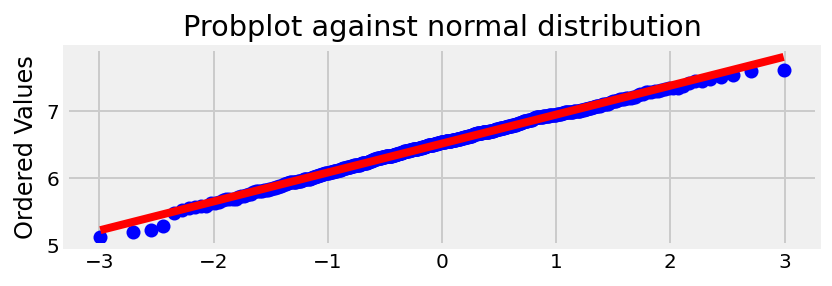

In [214]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

In [215]:
# Garage defines the car capacity and also the space to do work craft.
df_train['garage_fin_area'] = df_train['garage_area']* df_train['garage_finish'] 

In [216]:
# Garage defines the car capacity and also the space to do work craft.
df_test['garage_fin_area'] = df_test['garage_area']* df_test['garage_finish'] 

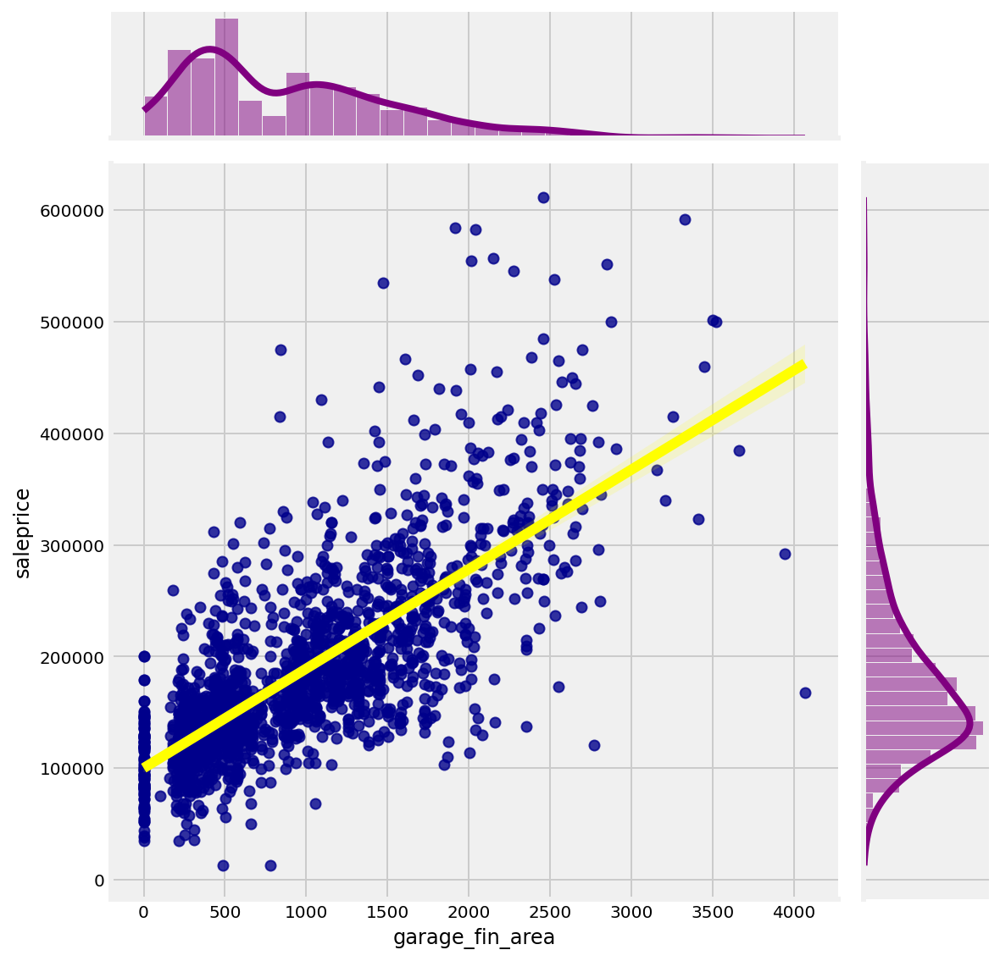

In [217]:
sns.jointplot(x=df_train['garage_fin_area'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

There is no outliner.

Now we look at the important feature Kitchen and Fireplace in the housing.

### Kitchen Quality

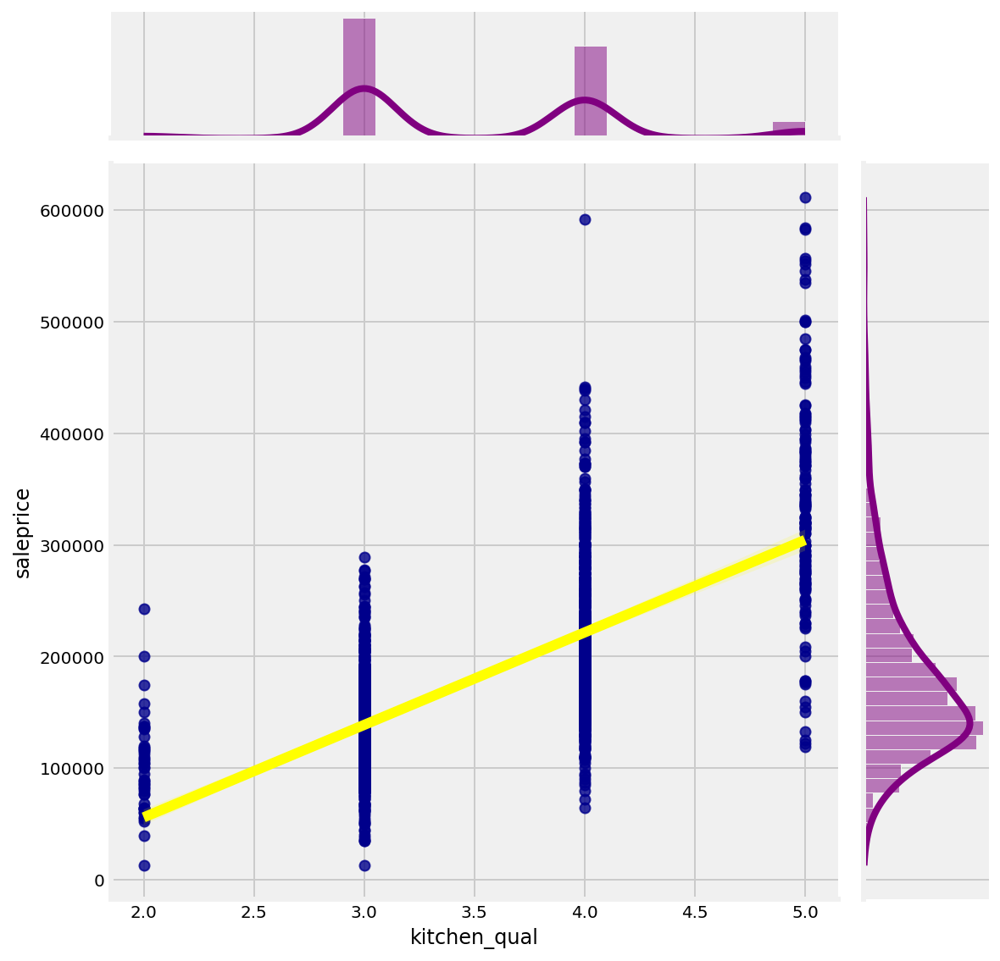

In [218]:
sns.jointplot(x=df_train['kitchen_qual'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### Fireplace

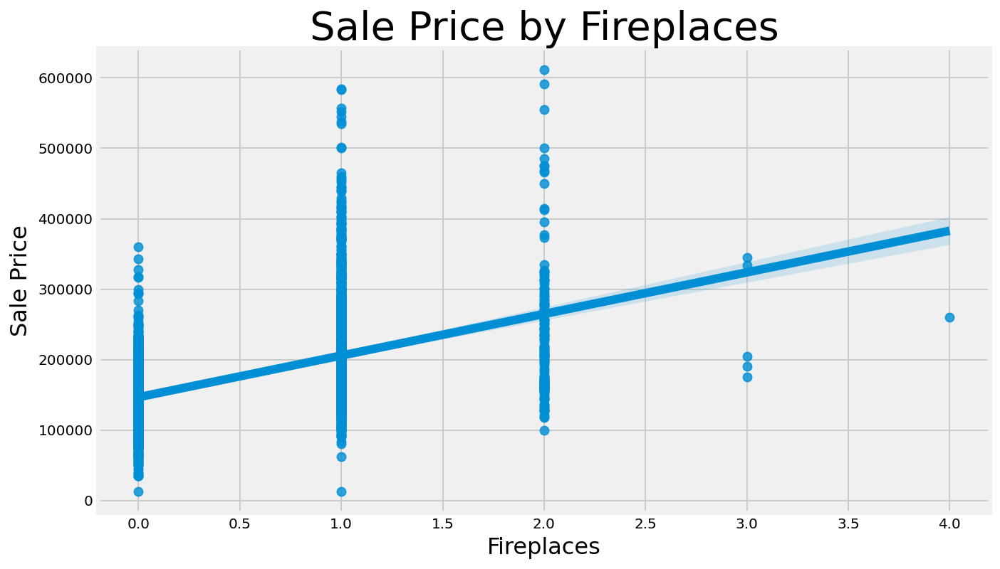

In [219]:
plt.figure(figsize=(10,6))
sns.regplot(x='fireplaces', y='saleprice', data=df_train)
plt.title('Sale Price by Fireplaces', fontsize=28)
plt.xlabel('Fireplaces', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

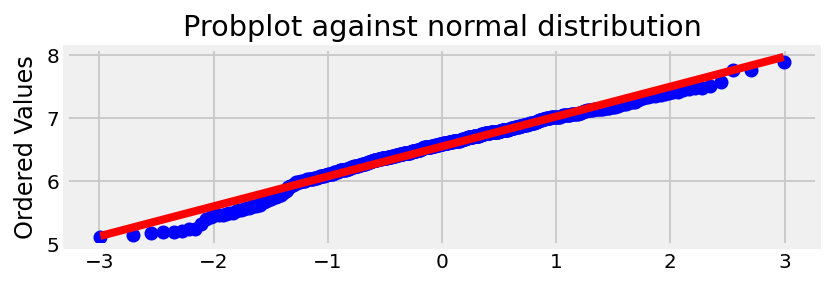

In [220]:
fig = plt.figure()
ax1 = fig.add_subplot(211)
x = stats.loggamma.rvs(5, size=500) + 5
prob = stats.probplot(x, dist=stats.norm, plot=ax1)
ax1.set_xlabel('')
ax1.set_title('Probplot against normal distribution');

### All Floors sqft

In [221]:
df_train['all_floors_sf'] = (df_train['1st_flr_sf'] + df_train['2nd_flr_sf'])

In [222]:
df_test['all_floors_sf'] = (df_test['1st_flr_sf'] + df_test['2nd_flr_sf'])

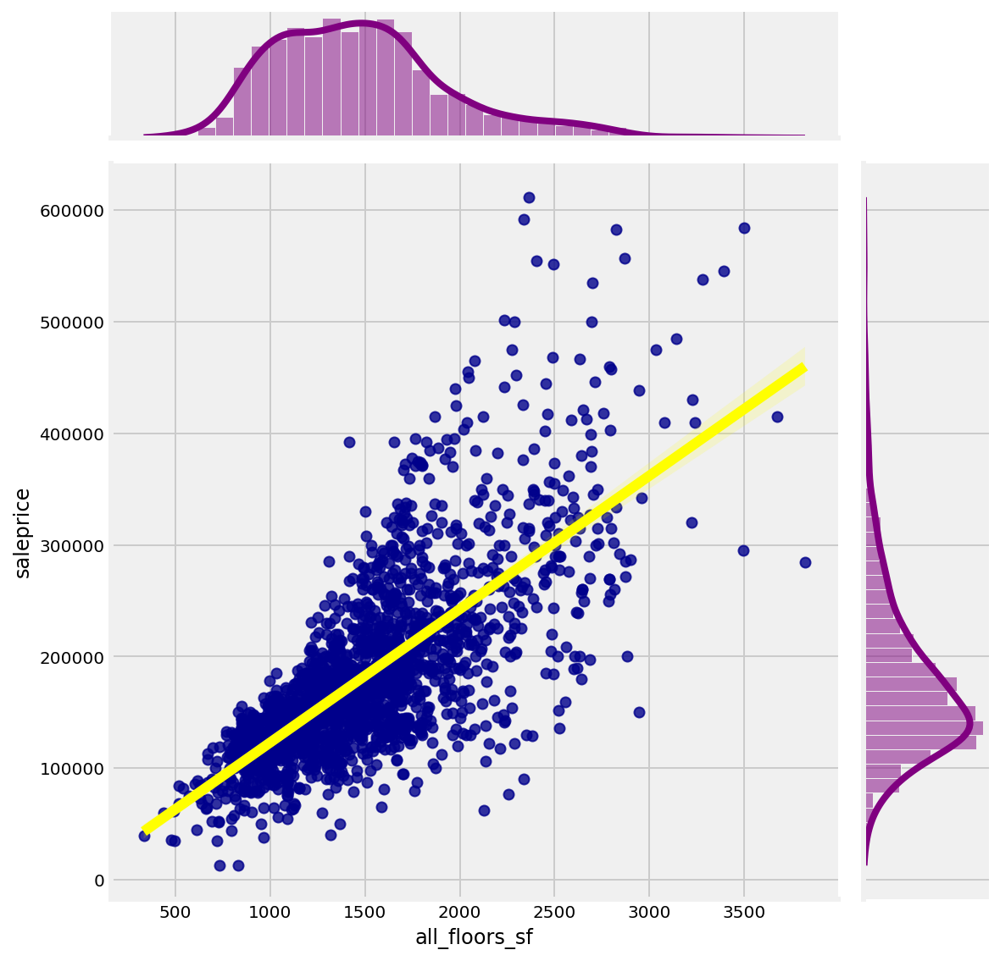

In [223]:
sns.jointplot(x=df_train['all_floors_sf'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### All Baths 

In [224]:
df_train['bsmt_all_baths'] = df_train['bsmt_full_bath']+(df_train['bsmt_half_bath']/2)
df_train['above_all_baths'] = df_train['full_bath']+(df_train['half_bath']/2)
df_train['all_baths'] = df_train['bsmt_all_baths']+df_train['above_all_baths']

In [225]:
df_test['bsmt_all_baths'] = df_test['bsmt_full_bath']+(df_test['bsmt_half_bath']/2)
df_test['above_all_baths'] = df_test['full_bath']+(df_test['half_bath']/2)
df_test['all_baths'] = df_test['bsmt_all_baths']+df_test['above_all_baths']

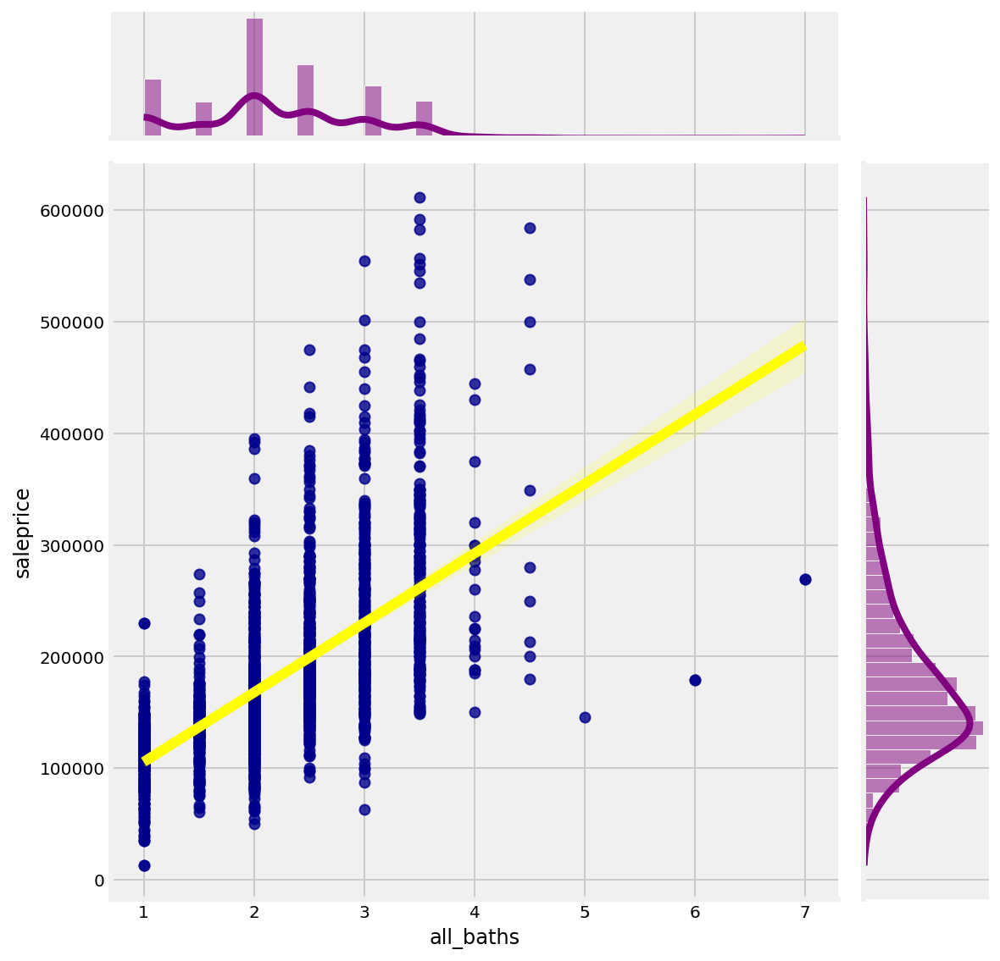

In [226]:
sns.jointplot(x=df_train['all_baths'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

In [227]:
df_train[(df_train['all_baths']==7)][['all_baths','above_all_baths','bsmt_all_baths']]

,all_baths,above_all_baths,bsmt_all_baths
1566,7.0,5.0,2.0
1605,7.0,5.0,2.0


In [228]:
# Removing the 2 outliners with 7 bath rooms
df_train = df_train.drop(df_train[(df_train['all_baths'] == 7)].index)

### Ground Living Area

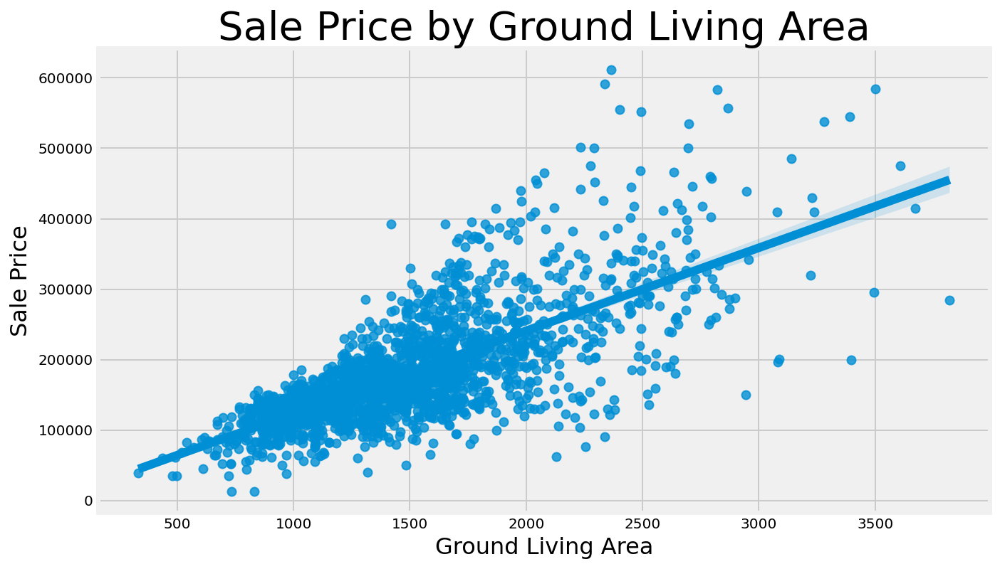

In [229]:
plt.figure(figsize=(10,6))
sns.regplot(x='gr_liv_area', y='saleprice', data=df_train)
plt.title('Sale Price by Ground Living Area', fontsize=28)
plt.xlabel('Ground Living Area', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

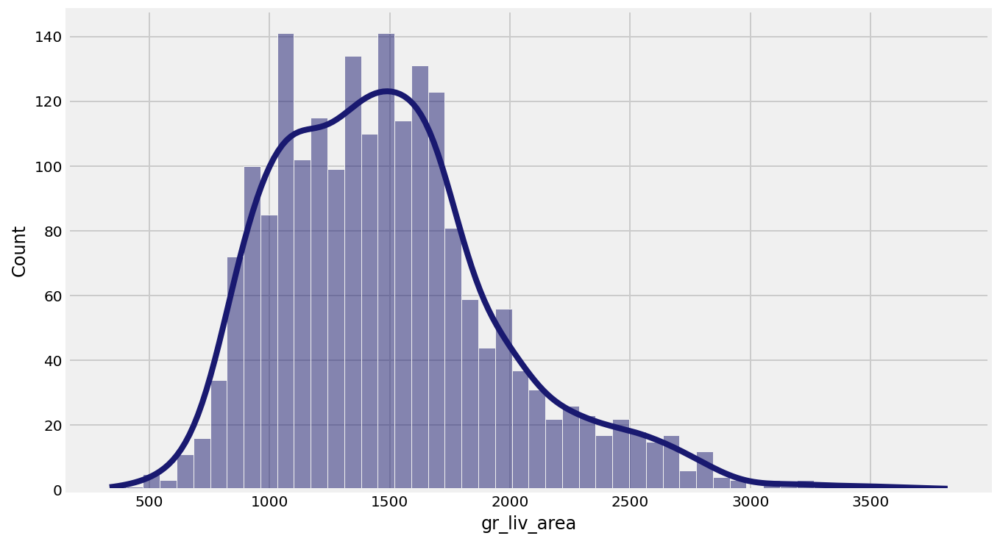

In [230]:
plt.figure(figsize=(10,6))
sns.histplot(data=df_train, x='gr_liv_area', kde=True, color= 'midnightblue', bins=50);

As living space increases sales price strongly increases.

### Total Rooms Above Grade

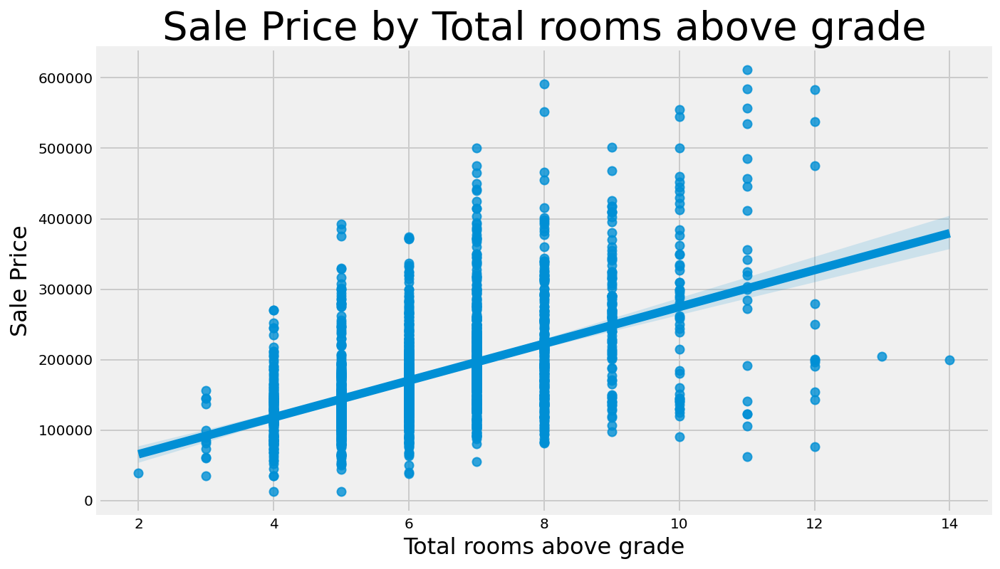

In [231]:
plt.figure(figsize=(10,6))
sns.regplot(x='totrms_abvgrd', y='saleprice', data=df_train)
plt.title('Sale Price by Total rooms above grade', fontsize=28)
plt.xlabel('Total rooms above grade', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

### Room Sizes Above Ground

In [232]:
# Gettting the room size without including the baths. 
df_train['room_size'] = df_train['gr_liv_area'] / (df_train['totrms_abvgrd']) 

In [233]:
# Gettting the room size without including the baths. 
df_test['room_size'] = df_test['gr_liv_area'] / (df_test['totrms_abvgrd']) 

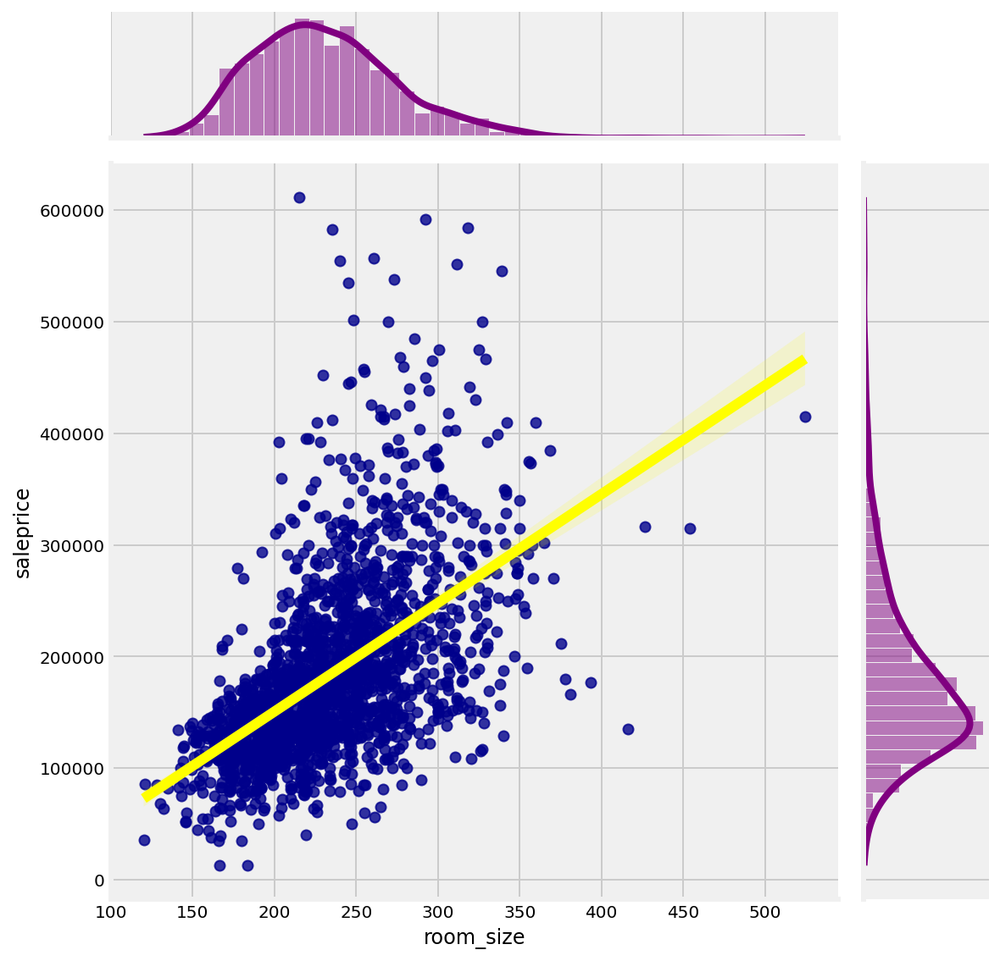

In [234]:
sns.jointplot(x=df_train['room_size'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### External Porch Area

In [235]:
# Combining the exterior porch area to give a single feature
df_train['outside_porch_sf'] = df_train['open_porch_sf'] + df_train['screen_porch'] + df_train['enclosed_porch'] + df_train['3ssn_porch'] + df_train['wood_deck_sf']


In [236]:
# Combining the exterior porch area to give a single feature
df_test['outside_porch_sf'] = df_test['open_porch_sf'] + df_test['screen_porch'] + df_test['enclosed_porch'] + df_test['3ssn_porch'] + df_test['wood_deck_sf'] 

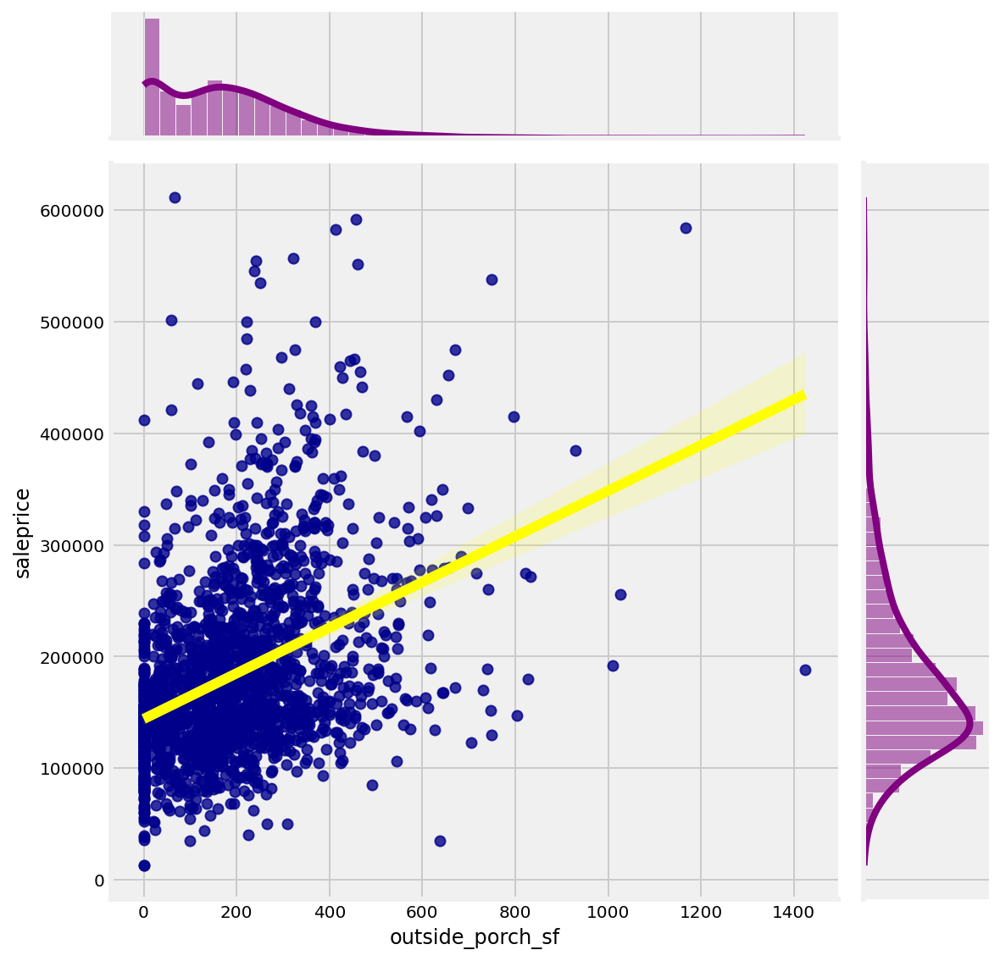

In [237]:
sns.jointplot(x=df_train['outside_porch_sf'], y=df_train['saleprice'], kind='reg', color='darkblue', line_kws={'color':'yellow'},
              marginal_kws={'color':'purple'}, height=8);

### Months Sold

In [238]:
# Checking if months has a strong relations to price
df_train.groupby('mo_sold')['saleprice'].agg(['mean', 'count']).sort_values(by = 'count')

# It showed no strong relations to the price. 

,mean,count
mo_sold,,
1,195576.641026,78
12,182459.615385,78
11,183812.568627,102
2,177626.519231,104
9,188990.761468,109
10,177794.083333,120
8,186927.359281,167
3,174625.779762,168
4,163901.269231,208


### Masonry Veneer Type

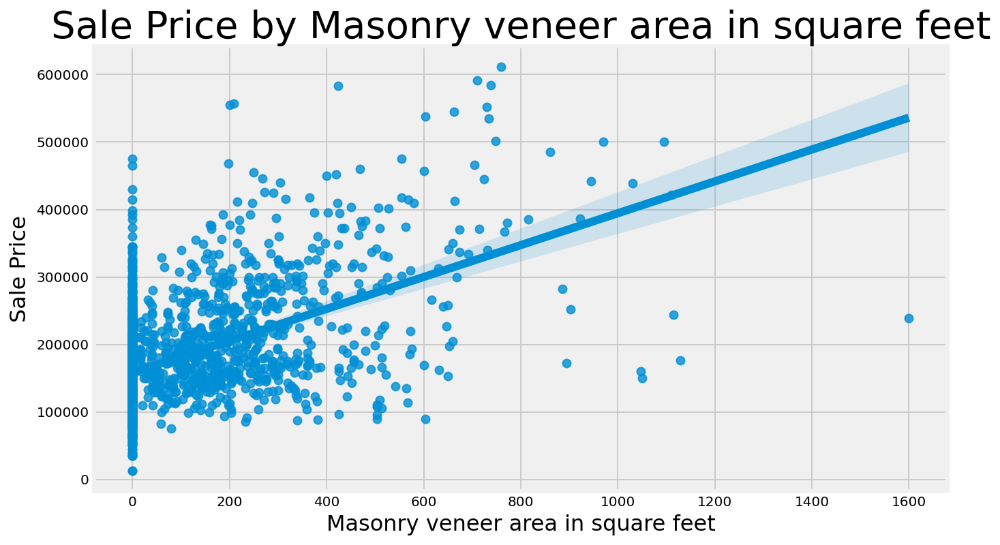

In [239]:
plt.figure(figsize=(10,6))
sns.regplot(x='mas_vnr_area', y='saleprice', data=df_train)
plt.title('Sale Price by Masonry veneer area in square feet', fontsize=28)
plt.xlabel('Masonry veneer area in square feet', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

In [240]:
mas_vnr_ord = {'None':0, 'BrkCmn':0, 'CBlock':0, 'BrkFace':1, 'Stone':1}

In [241]:
ms_zoning_ord = {'A (agr)':0, 'I (all)':0, 'C (all)':0,
                 'RM':1, 'RH':1, 'RL':1, 'FV':1}

In [242]:
df_train['mas_vnr_ord'] = df_train['mas_vnr_type'].map(mas_vnr_ord)

In [243]:
df_test['mas_vnr_ord'] = df_test['mas_vnr_type'].map(mas_vnr_ord)

In [244]:
# Check on the Mas Vnr Type values
print(df_train[['mas_vnr_ord']].dtypes)
df_train[['mas_vnr_type','mas_vnr_ord']].T

mas_vnr_ord    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,102

In [245]:
# Check on the Mas Vnr Type values
print(df_test[['mas_vnr_ord']].dtypes)
df_test[['mas_vnr_type','mas_vnr_ord']].T

mas_vnr_ord    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
mas_vnr_type,None,None,None,None,BrkFace,None,None,None,None,None,None,None,None,BrkFace,None,BrkFace,None,None,BrkFace,None,None,None,None,None,None,None,None,None,BrkFace,None,None,None,None,None,BrkFace,Stone,None,None,None,None,Stone,None,None,BrkCmn,BrkFace,None,BrkFace,None,None,None,None,None,Stone,None,BrkFace,None,None,None,None,None,BrkFace,None,BrkFace,None,None,BrkFace,None,Stone,None,BrkFace,BrkFace,Stone,BrkFace,BrkFace,BrkFace,BrkFace,BrkFace,BrkCmn,None,BrkFace,BrkFace,None,None,None,None,BrkFace,None,BrkFace,BrkFace,None,None,None,None,None,None,None,None,Stone,None,None,Br

### MS Zoning 

In [246]:
df_train['ms_zoning'].value_counts()

RL         1593
RM          316
FV          101
C (all)      19
RH           14
A (agr)       2
I (all)       1
Name: ms_zoning, dtype: int64

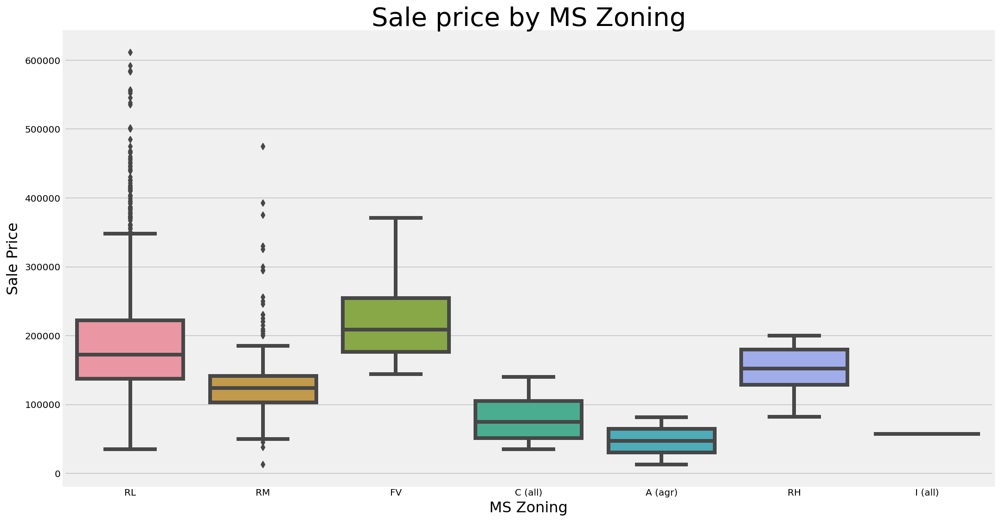

In [247]:
plt.figure(figsize=(16,9))
sns.boxplot(x='ms_zoning', y='saleprice', data=df_train)
plt.title('Sale price by MS Zoning', fontsize=28)
plt.xlabel('MS Zoning', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

In [248]:
df_test['ms_zoning'].value_counts()

RL         674
RM         146
FV          38
RH          13
C (all)      6
I (all)      1
Name: ms_zoning, dtype: int64

In [249]:
ms_zoning_ord = {'A (agr)':0, 'I (all)':0, 'C (all)':0,
                 'RM':1, 'RH':1, 'RL':1, 'FV':1}

In [250]:
df_train['residential'] = df_train['ms_zoning'].map(ms_zoning_ord)

In [251]:
df_test['residential'] = df_test['ms_zoning'].map(ms_zoning_ord)

In [252]:
# Check on the Mas Vnr Type values
print(df_train[['residential']].dtypes)
df_train[['ms_zoning','residential']].T

residential    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,102

In [253]:
# Check on the Mas Vnr Type values
print(df_test[['residential']].dtypes)
df_test[['ms_zoning','residential']].T

residential    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
ms_zoning,RM,RL,RL,RM,RL,RM,RM,RL,FV,RL,RL,RM,RL,RL,RL,RL,RM,RL,RL,RM,RL,RL,RL,RL,RL,RL,RL,RM,RL,RL,RL,RM,RM,RL,RL,RL,RM,RL,RL,FV,FV,RL,RL,RL,RL,RM,RL,RH,RL,RL,RM,RM,RL,RM,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RH,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RM,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RM,RL,RM,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RM,RL,RL,RL,RL,RL,FV,RM,RL,RL,RL,RM,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RM,FV,RL,RL,RL,RL,FV,RL,RL,RL,RL,RL,RL,RL,RM,RL,RL,RM,RM,RL,C (all),RL,RL,RL,RM,RL,RL,RL,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,FV,RL,RL,RL,RL,FV,RL,RL,RL,RL,RM,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RL,RM,RL,RL,

### Exterior 1 and 2

In [254]:
# Exteriod features outside the house
     
df_train['positive_ext1'] = df_train['exterior_1st']
df_train['positive_ext2'] = df_train['exterior_2nd']
df_train_ext1n2_columns = df_train[['positive_ext1', 'positive_ext2']]
ext1n2 = {'AsphShn':1, 'CBlock':1, 'AsbShng':1, 
           'Brk Cmn':2, 'BrkComm':2, 'Stucco':2, 'PreCast':2,
           'Other':3, 'Wd Shng':3, 'Wd Sdng':3, 'MetalSd':3, 'WdShing':3,'HdBoard':3,
           'Plywood':4,
           'BrkFace':5, 'VinylSd':5, 'CmentBd':5, 'CemntBd':5, 'Stone':5, 'ImStucc':5,    
               }
df_train_ext1n2_columns.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,102

In [255]:
# Exteriod features outside the house
     
df_test['positive_ext1'] = df_test['exterior_1st']
df_test['positive_ext2'] = df_test['exterior_2nd']
df_test_ext1n2_columns = df_test[['positive_ext1', 'positive_ext2']]
ext1n2 = {'AsphShn':1, 'CBlock':1, 'AsbShng':1, 
           'Brk Cmn':2, 'BrkComm':2, 'Stucco':2, 'PreCast':2,
           'Other':3, 'Wd Shng':3, 'Wd Sdng':3, 'MetalSd':3, 'WdShing':3,'HdBoard':3,
           'Plywood':4,
           'BrkFace':5, 'VinylSd':5, 'CmentBd':5, 'CemntBd':5, 'Stone':5, 'ImStucc':5,    
               }
df_test_ext1n2_columns.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
positive_ext1,AsbShng,Plywood,VinylSd,Wd Sdng,Plywood,CemntBd,MetalSd,HdBoard,VinylSd,Plywood,Plywood,VinylSd,Wd Sdng,VinylSd,BrkComm,Wd Sdng,Wd Sdng,MetalSd,HdBoard,Wd Sdng,Plywood,MetalSd,Plywood,Plywood,VinylSd,HdBoard,VinylSd,VinylSd,MetalSd,MetalSd,HdBoard,MetalSd,Stucco,HdBoard,VinylSd,VinylSd,Wd Sdng,Wd Sdng,WdShing,CemntBd,VinylSd,VinylSd,MetalSd,Wd Sdng,VinylSd,CemntBd,VinylSd,VinylSd,MetalSd,HdBoard,Wd Sdng,Wd Sdng,VinylSd,Wd Sdng,Stucco,Plywood,Wd Sdng,HdBoard,Plywood,VinylSd,VinylSd,BrkFace,Plywood,HdBoard,VinylSd,Wd Sdng,HdBoard,VinylSd,MetalSd,VinylSd,MetalSd,VinylSd,Wd Sdng,H

In [256]:
# Convert to ordinal values
for i in df_train_ext1n2_columns.columns:
    df_train.replace({i: ext1n2},inplace = True)
df_train['exterior_1n2'] = df_train['positive_ext1'] + df_train['positive_ext2'] 

In [257]:
# Convert to ordinal values
for i in df_test_ext1n2_columns.columns:
    df_test.replace({i: ext1n2},inplace = True)
df_test['exterior_1n2'] = df_test['positive_ext1'] + df_test['positive_ext2'] 

In [258]:
# Check on the Exterior values
print(df_train[['exterior_1n2']].dtypes)
df_train[['exterior_1n2','exterior_1st', 'exterior_2nd']].T

exterior_1n2    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,102

In [259]:
# Check on the Exterior values
print(df_test[['exterior_1n2']].dtypes)
df_test[['exterior_1n2','exterior_1st', 'exterior_2nd']].T

exterior_1n2    int64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
exterior_1n2,2,8,10,6,8,10,6,7,10,8,8,10,8,10,4,6,6,6,6,6,8,6,8,8,10,6,10,10,6,6,6,6,4,6,10,10,6,6,6,10,10,10,6,6,10,10,10,10,6,6,6,6,10,6,4,8,6,6,8,10,10,7,8,6,10,6,6,10,6,10,6,10,6,6,8,6,6,6,6,6,10,6,10,8,10,10,6,6,8,6,7,6,6,6,6,6,6,10,10,10,6,8,7,6,10,10,6,6,10,8,8,10,5,10,10,6,6,6,10,10,10,10,6,10,6,10,6,6,2,10,10,10,6,6,6,6,10,10,10,6,8,6,6,10,6,6,6,6,6,10,10,6,6,6,10,6,10,10,6,10,10,6,6,10,10,10,10,10,10,10,8,10,8,6,6,6,6,8,10,10,10,6,6,10,6,6,10,6,7,4,6,10,5,6,10,10,10,10,6,10,10,6,7,6,6,8,6,10,10,10,10,6,6,10,10,6,8,6,6,10,6,8,6,10,6,6,10,10,6,10,4,10,6,6,4,6,5,10,10,10,10,6,10,10,7

### House Style 

In [260]:
house_style_ord = {'1.5Unf':1.5, '1.5Fin':1.5, 'SFoyer':1.5, 'SLvl':1, '1Story':1, '2.5Unf':2, '2Story':2, '2.5Fin':2 }

In [261]:
df_train['house_style_order'] = df_train['house_style'].map(house_style_ord)

In [262]:
df_test['house_style_order'] = df_test['house_style'].map(house_style_ord)

In [263]:
# Check on the MS Zoning values
print(df_train[['house_style_order']].dtypes)
df_train[['house_style_order', 'house_style']].T

house_style_order    float64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,102

In [264]:
# Check on the MS Zoning values
print(df_test[['house_style_order']].dtypes)
df_test[['house_style_order', 'house_style']].T

house_style_order    float64
dtype: object


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877
house_style_order,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.5,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.5,2.0,1.5,1.5,1.0,1.5,2.0,1.0,1.0,2.0,1.5,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.5,2.0,1.0,1.5,1.5,1.0,1.5,1.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.5,2.0,2.0,2.0,1.0,1.0,1.5,1.0,1.5,1.0,2.0,1.5,1.0,1.5,2.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.5,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,1.5,1.0,1.0,2.0,2.0,1.5,2.0,1.5,1.0,1.0,1.0,1.0,1.0,1.0,1.5,1.0,1.5

In [265]:
# Dummified the ordinal values column house_style_order
df_train = pd.get_dummies(data=df_train, columns=['house_style_order'], drop_first=True)

In [266]:
# Dummified the ordinal values column house_style_order
df_test = pd.get_dummies(data=df_test, columns=['house_style_order'], drop_first=True)

In [267]:
# Check the relative pricing
df_train.groupby('house_style')['saleprice'].agg(['mean', 'count']).sort_values(by = 'mean')

,mean,count
house_style,,
1.5Unf,112466.666667,12
1.5Fin,136480.091743,218
SFoyer,149343.920000,50
SLvl,166248.989362,94
1Story,179746.534532,1057
2.5Unf,191785.714286,14
2Story,206274.890756,595
2.5Fin,243666.666667,6


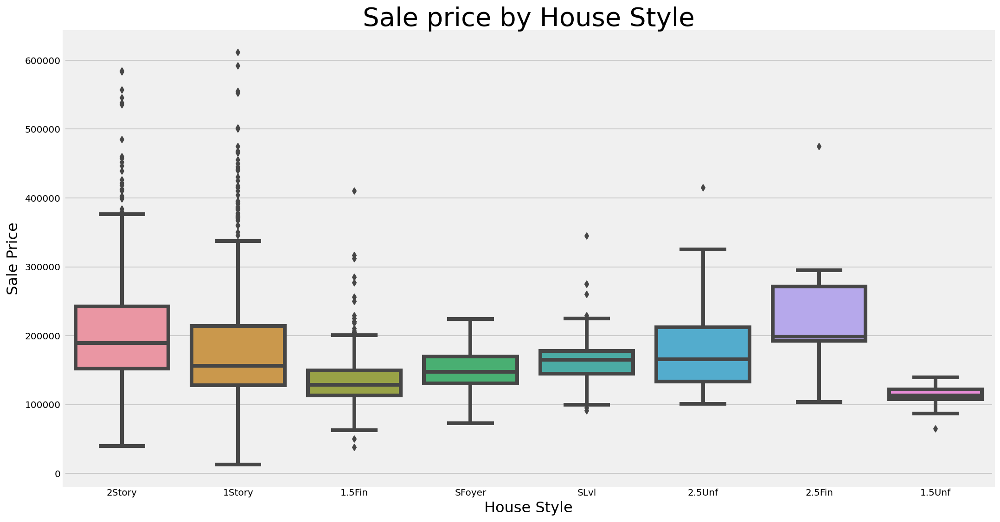

In [268]:
plt.figure(figsize=(16,9))
sns.boxplot(x='house_style', y='saleprice', data=df_train)
plt.title('Sale price by House Style', fontsize=28)
plt.xlabel('House Style', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

### Building Type

In [269]:
df_train.groupby('bldg_type')['saleprice'].agg(['mean', 'count']).sort_values(by = 'mean')

,mean,count
bldg_type,,
2fmCon,123179.891304,46
Twnhs,133100.000000,69
Duplex,135729.109589,73
1Fam,185257.994107,1697
TwnhsE,198312.372671,161


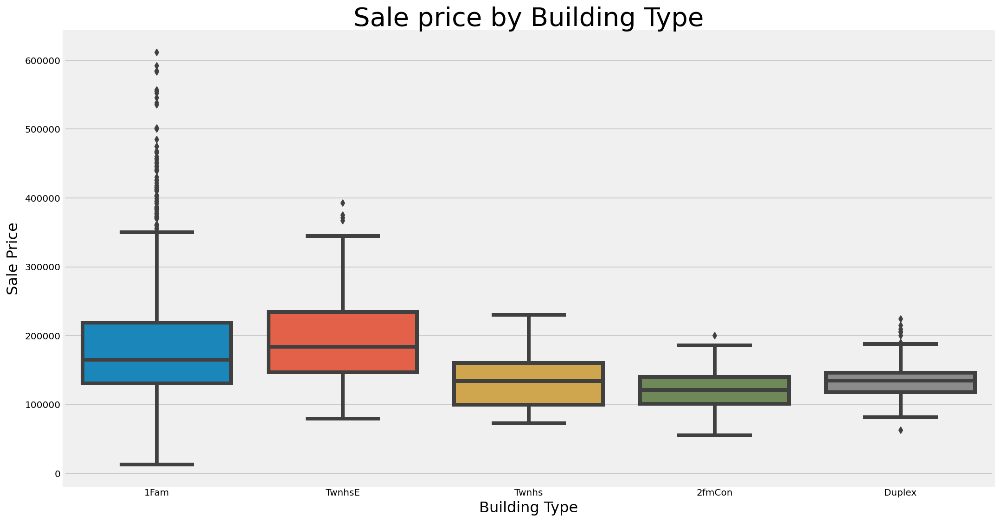

In [270]:
plt.figure(figsize=(16,9))
sns.boxplot(x='bldg_type', y='saleprice', data=df_train)
plt.title('Sale price by Building Type', fontsize=28)
plt.xlabel('Building Type', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

In [271]:
# Dummy the ordinal values column bldg_type
df_train = pd.get_dummies(data=df_train, columns=['bldg_type'], drop_first=True)

In [272]:
# Dummy the ordinal values column bldg_type
df_test = pd.get_dummies(data=df_test, columns=['bldg_type'], drop_first=True)

### Roof Type

In [273]:
df_train.groupby('roof_style')['saleprice'].agg(['mean', 'count']).sort_values(by = 'mean')

,mean,count
roof_style,,
Gambrel,138208.333333,12
Mansard,152642.857143,7
Gable,171264.253243,1619
Flat,187414.166667,12
Shed,208666.666667,3
Hip,224403.847328,393


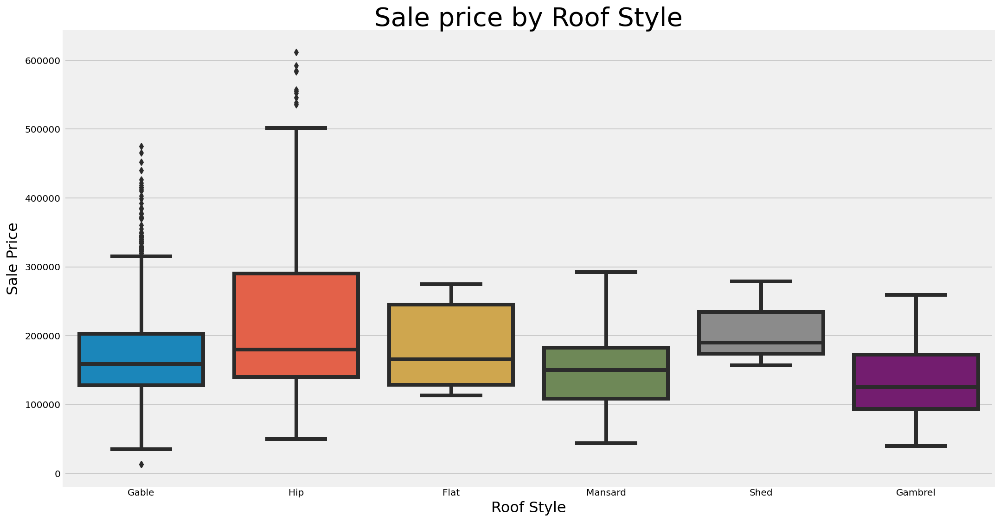

In [274]:
plt.figure(figsize=(16,9))
sns.boxplot(x='roof_style', y='saleprice', data=df_train)
plt.title('Sale price by Roof Style', fontsize=28)
plt.xlabel('Roof Style', fontsize=16)
plt.ylabel('Sale Price', fontsize=16);

In [275]:
# Dummy the ordinal values column roof style
df_train = pd.get_dummies(data=df_train, columns=['roof_style'], drop_first=True)

In [276]:
# Dummy the ordinal values column roof style
df_test = pd.get_dummies(data=df_test, columns=['roof_style'], drop_first=True)

In [277]:
df_train.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,misc_val,mo_sold,yr_sold,sale_type,saleprice,neighborhood_order,pricepsf,positive_cond1,positive_cond2,local_conditions,sale_type_order,age,was_remodeled,bsmtfin_type_sf,garage_fin_area,all_floors_sf,bsmt_all_baths,above_all_baths,all_baths,room_size,outside_porch_sf,mas_vnr_ord,residential,positive_ext1,positive_ext2,exterior_1n2,house_style_order_1.5,house_style_order_2.0,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,roof_style_Gable,roof_style_Gambrel,roof_style_Hip,roof_style_Mansard,roof_style_Shed
0,109,533352170,60,RL,41.5,13517,Pave,3,Lvl,4,CulDSac,3,Sawyer,RRAe,Norm,2Story,6,8,1976,2005,CompShg,HdBoard,Plywood,BrkFace,289.0,4,3,CBlock,3,3,1,6,533.0,1,0.0,192.0,725.0,GasA,5,Y,1,725,754,0,1479,0.0,0.0,2,1,3,1,4,6,8,0,0,Attchd,1976.0,2,2.0,475.0,3,3,2,0,44,0,0,0,0,0,0,3,2010,WD,130500,1,88.235294,0,1,1,2,34,1,3198.0,950.0,1479,0.0,2.5,2.5,246.500000,44,1,1,3,4,7,0,1,0,0,0,0,1,0,0,0,0
1,544,531379050,60,RL,43.0,11492,Pave,3,Lvl,4,CulDSac,3,SawyerW,Norm,Norm,2Story,7,5,1996,1997,CompShg,VinylSd,VinylSd,BrkFace,132.0,4,3,PConc,4,3,1,6,637.0,1,0.0,276.0,913.0,GasA,5,Y,1,913,1209,0,2122,1.0,0.0,2,1,4,1,4,8,8,1,3,Attchd,1997.0,2,2.0,559.0,3,3,2,0,74,0,0,0,0,0,0,4,2009,WD,220000,3,103.675778,1,1,2,2,13,1,3822.0,1118.0,2122,1.0,2.5,3.5,265.250000,74,1,1,5,5,10,0,1,0,0,0,0,1,0,0,0,0
2,153,535304180,20,RL,68.0,7922,Pave,4,Lvl,4,Inside,3,NAmes,Norm,Norm,1Story,5,7,1953,2007,CompShg,VinylSd,VinylSd,None,0.0,3,4,CBlock,3,3,1,6,731.0,1,0.0,326.0,1057.0,GasA,3,Y,1,1057,0,0,1057,1.0,0.0,1,0,3,1,4,5,8,0,0,Detchd,1953.0,1,1.0,246.0,3,3,2,0,52,0,0,0,0,0,0,1,2010,WD,109000,2,103.122044,1,1,2,2,57,1,4386.0,246.0,1057,1.0,1.0,2.0,211.400000,52,0,1,5,5,10,0,0,0,0,0,0,1,0,0,0,0
3,318,916386060,60,RL,73.0,9802,Pave,4,Lvl,4,Inside,3,Timber,Norm,Norm,2Story,5,5,2006,2007,CompShg,VinylSd,VinylSd,None,0.0,3,3,PConc,4,3,1,1,0.0,1,0.0,384.0,384.0,GasA,4,Y,1,744,700,0,1444,0.0,0.0,2,1,3,1,3,7,8,0,0,BuiltIn,2007.0,3,2.0,400.0,3,3,2,100,0,0,0,0,0,0,0,4,2010,WD,174000,4,120.498615,1,1,2,2,4,1,0.0,1200.0,1444,0.0,2.5,2.5,206.285714,100,0,1,5,5,10,0,1,0,0,0,0,1,0,0,0,0
4,255,906425045,50,RL,82.0,14235,Pave,3,Lvl,4,Inside,3,SawyerW,Norm,Norm,1.5Fin,6,8,1900,1993,CompShg,Wd Sdng,Plywood,None,0.0,3,3,PConc,2,4,1,1,0.0,1,0.0,676.0,676.0,GasA,3,Y,1,831,614,0,1445,0.0,0.0,2,0,3,1,3,6,8,0,0,Detchd,1957.0,1,2.0,484.0,3,3,0,0,59,0,0,0,0,0,0,3,2010,WD,138500,3,95.847751,1,1,2,2,110,1,0.0,484.0,1445,0.0,2.0,2.0,240.833333,59,0,1,3,4,7,1,0,0,0,0,0,1,0,0,0,0


In [278]:
df_test.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,misc_val,mo_sold,yr_sold,sale_type,neighborhood_order,positive_cond1,positive_cond2,local_conditions,sale_type_order,age,was_remodeled,bsmtfin_type_sf,garage_fin_area,all_floors_sf,bsmt_all_baths,above_all_baths,all_baths,room_size,outside_porch_sf,mas_vnr_ord,residential,positive_ext1,positive_ext2,exterior_1n2,house_style_order_1.5,house_style_order_2.0,bldg_type_2fmCon,bldg_type_Duplex,bldg_type_Twnhs,bldg_type_TwnhsE,roof_style_Gable,roof_style_Gambrel,roof_style_Hip,roof_style_Mansard,roof_style_Shed
0,2658,902301120,190,RM,69.0,9142,Pave,4,Lvl,4,Inside,3,OldTown,Norm,Norm,2Story,6,8,1910,1950,CompShg,AsbShng,AsbShng,None,0.0,3,2,Stone,2,3,1,1,0,1,0,1020,1020,GasA,4,N,0,908,1020,0,1928,0,0,2,0,4,2,2,9,8,0,0,Detchd,1910.0,1,1,440,1,1,2,0,60,112,0,0,0,0,0,4,2006,WD,2,1,1,2,2,96,1,0,440,1928,0.0,2.0,2.0,214.222222,172,0,1,1,1,2,0,1,1,0,0,0,1,0,0,0,0
1,2718,905108090,90,RL,72.0,9662,Pave,3,Lvl,4,Inside,3,Sawyer,Norm,Norm,1Story,5,4,1977,1977,CompShg,Plywood,Plywood,None,0.0,3,3,CBlock,4,3,1,1,0,1,0,1967,1967,GasA,3,Y,1,1967,0,0,1967,0,0,2,0,6,2,3,10,8,0,0,Attchd,1977.0,3,2,580,3,3,2,170,0,0,0,0,0,0,0,8,2006,WD,1,1,1,2,2,29,0,0,1740,1967,0.0,2.0,2.0,196.700000,170,0,1,4,4,8,0,0,0,1,0,0,1,0,0,0,0
2,2414,528218130,60,RL,58.0,17104,Pave,3,Lvl,4,Inside,3,Gilbert,Norm,Norm,2Story,7,5,2006,2006,CompShg,VinylSd,VinylSd,None,0.0,4,3,PConc,4,4,3,6,554,1,0,100,654,GasA,5,Y,1,664,832,0,1496,1,0,2,1,3,1,4,7,8,1,4,Attchd,2006.0,2,2,426,3,3,2,100,24,0,0,0,0,0,0,9,2006,New,2,1,1,2,3,0,0,3324,852,1496,1.0,2.5,3.5,213.714286,124,0,1,5,5,10,0,1,0,0,0,0,1,0,0,0,0
3,1989,902207150,30,RM,60.0,8520,Pave,4,Lvl,4,Inside,3,OldTown,Norm,Norm,1Story,5,6,1923,2006,CompShg,Wd Sdng,Wd Sdng,None,0.0,4,3,CBlock,3,3,1,1,0,1,0,968,968,GasA,3,Y,1,968,0,0,968,0,0,1,0,2,1,3,5,8,0,0,Detchd,1935.0,1,2,480,2,3,0,0,0,184,0,0,0,0,0,7,2007,WD,2,1,1,2,2,84,1,0,480,968,0.0,1.0,1.0,193.600000,184,0,1,3,3,6,0,0,0,0,0,0,1,0,0,0,0
4,625,535105100,20,RL,74.0,9500,Pave,3,Lvl,4,Inside,3,NAmes,Norm,Norm,1Story,6,5,1963,1963,CompShg,Plywood,Plywood,BrkFace,247.0,3,3,CBlock,4,3,1,4,609,1,0,785,1394,GasA,4,Y,1,1394,0,0,1394,1,0,1,1,3,1,3,6,8,2,4,Attchd,1963.0,2,2,514,3,3,2,0,76,0,0,185,0,0,0,7,2009,WD,2,1,1,2,2,46,0,2436,1028,1394,1.0,1.5,2.5,232.333333,261,1,1,4,4,8,0,0,0,0,0,0,1,0,0,0,0


In [279]:
df_train[df_train['roof_style_Hip']==1]['roof_style_Hip'].sum()

393

In [280]:
df_test[df_test['roof_style_Hip']==1]['roof_style_Hip'].sum()

153

Roof Style Hip will be included in the modeling as it is considered more costly to the pricier home.

In [281]:
# Change columns names to lower case and _ 
df_train.columns = df_train.columns.str.lower()

In [282]:
# Change columns names to lower case and _ 
df_test.columns = df_test.columns.str.lower()

With all the data cleaned, it will support a better modelling and accuracy.

### Heatmap Correlation

In [283]:
df_train_corr =  df_train[['saleprice','age','neighborhood_order','local_conditions','was_remodeled','overall_qual', 
                  'house_style_order_1.5', 'house_style_order_2.0','exter_qual','exterior_1n2', 'bldg_type_duplex',
                  'bldg_type_twnhs','bldg_type_twnhse','bldg_type_2fmcon', 'roof_style_hip','residential',  
                  'functional', 'lot_frontage', 'lot_area','outside_porch_sf'
                  ,'garage_fin_area','garage_cars', 'paved_drive',
                 'bsmt_qual','bsmtfin_type_sf', 'bsmt_exposure',
                 'heating_qc','kitchen_qual', 'fireplace_qu', 
                 'all_floors_sf', 'totrms_abvgrd', 'room_size', 'all_baths', 'gr_liv_area'
                          ]] 

In [284]:
df_test_corr =  df_test[['id','age','neighborhood_order','local_conditions','was_remodeled','overall_qual', 
                  'house_style_order_1.5', 'house_style_order_2.0','exter_qual','exterior_1n2', 'bldg_type_duplex',
                  'bldg_type_twnhs','bldg_type_twnhse','bldg_type_2fmcon', 'roof_style_hip','residential',  
                  'functional', 'lot_frontage', 'lot_area','outside_porch_sf'
                  ,'garage_fin_area','garage_cars', 'paved_drive',
                 'bsmt_qual','bsmtfin_type_sf', 'bsmt_exposure',
                 'heating_qc','kitchen_qual', 'fireplace_qu', 
                 'all_floors_sf', 'totrms_abvgrd', 'room_size', 'all_baths', 'gr_liv_area'
                          ]] 

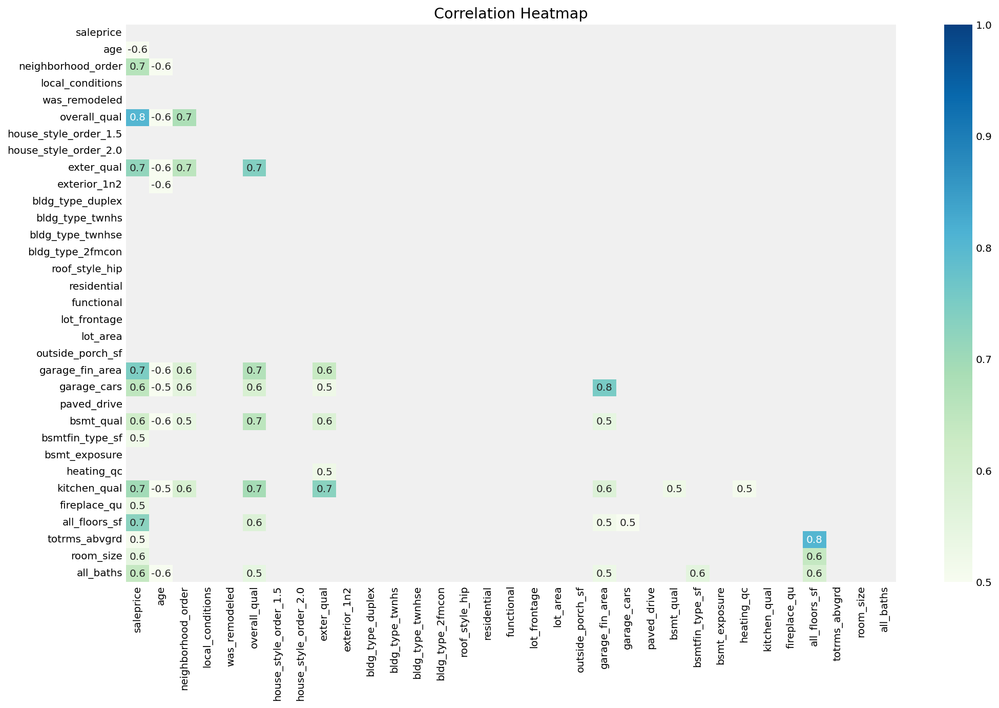

In [285]:
# Create correlation matrix from train data excluding `SalePrice`
corr_mat = df_train_corr.iloc[:, :-1].corr()

# Select correlations greater than 0.5
high_corr_mat = corr_mat[abs(corr_mat) >= 0.5]

# Masking of symmetrical table
mask = np.zeros_like(high_corr_mat.corr())
mask[np.triu_indices_from(mask)] = True

# Plot correlation heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(high_corr_mat,
            annot=True,
            fmt='.1f',
            cmap='GnBu',
            vmin=0.5,
            vmax=1,
            mask=mask)
title = plt.title('Correlation Heatmap')

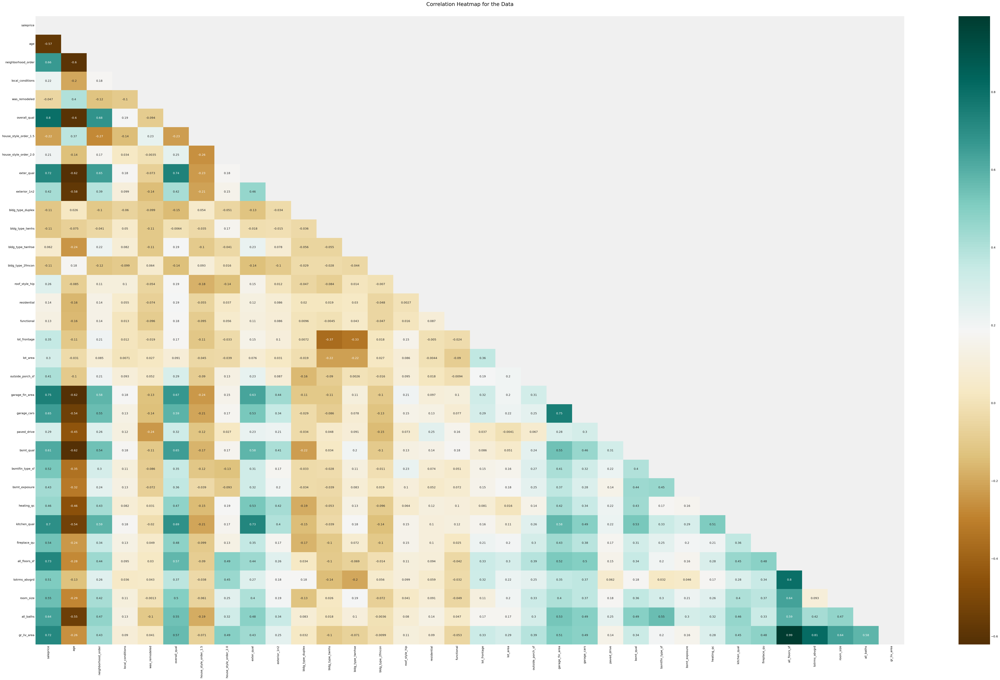

In [286]:
# define the mask to set the values in the upper triangle to True
mask = np.zeros_like(df_train_corr.corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(60, 40))
ax = sns.heatmap(
    df_train_corr.corr(),
    cmap='BrBG', #BrBG also can
    annot=True,
    mask = mask
)
ax.set_title('Correlation Heatmap for the Data\n', fontdict={'fontsize':18}, pad=16);

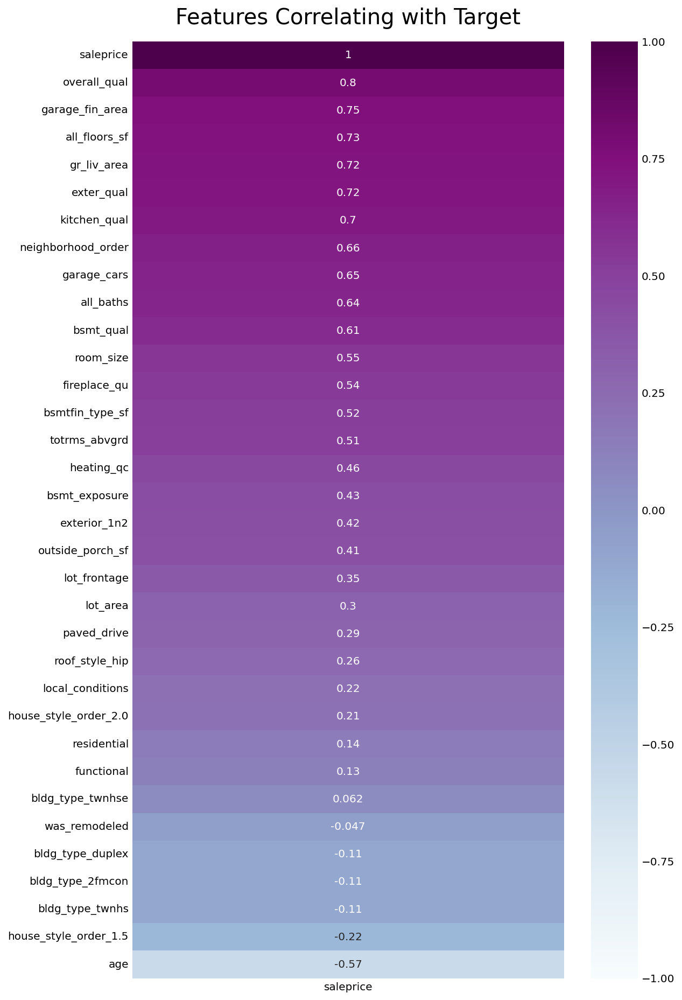

In [287]:
plt.figure(figsize=(8, 16))
heatmap = sns.heatmap(df_train_corr.corr()[['saleprice']].sort_values(by='saleprice', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BuPu')
heatmap.set_title('Features Correlating with Target', fontdict={'fontsize':20}, pad=16);

In [288]:
df_train_corr['saleprice'].describe().T

count      2046.000000
mean     181363.395894
std       79294.920396
min       12789.000000
25%      129575.000000
50%      162250.000000
75%      214000.000000
max      611657.000000
Name: saleprice, dtype: float64

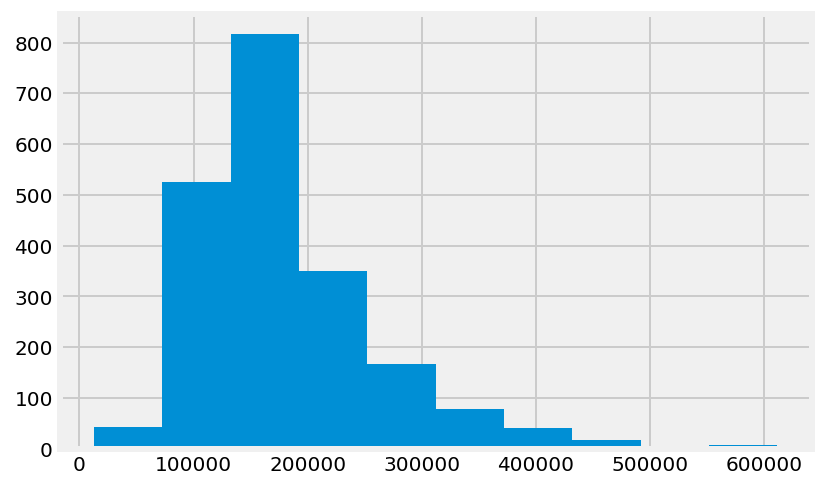

In [289]:
# Looking at the histogram, there are outliers stewing to the right. 
df_train_corr['saleprice'].hist();

In [290]:
# Dropping the outlier rows with standard deviation
df_train_final = df_train_corr.copy()

factor = 3
upper_lim = df_train_final['saleprice'].mean () + df_train_final['saleprice'].std () * factor
lower_lim = df_train_final['saleprice'].mean () - df_train_final['saleprice'].std () * factor

print(f'Saleprice Upper limit: {upper_lim}')
print(f'Saleprice Lower limit: {lower_lim}')

Saleprice Upper limit: 419248.1570832607
Saleprice Lower limit: -56521.36529440436


In [291]:
df_train_final = df_train_final[(df_train_final['saleprice'] < upper_lim) & (df_train_final['saleprice'] > lower_lim)]

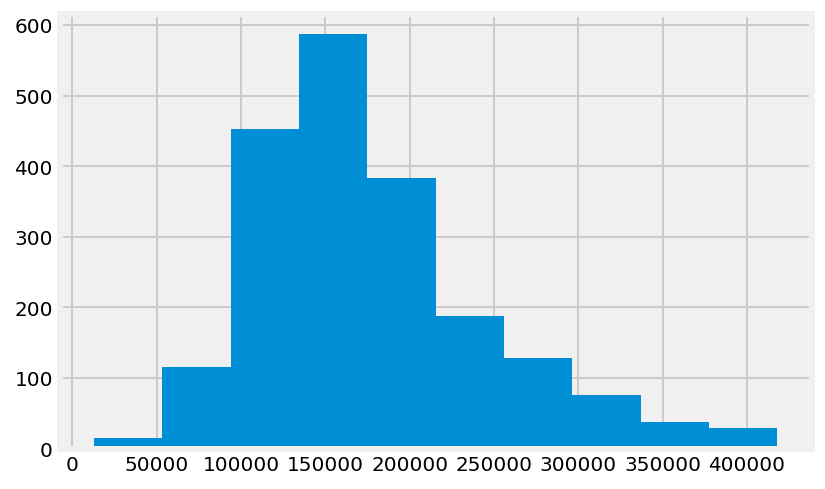

In [292]:
# Looking at the histogram, there are outliers stewing to the right. 
df_train_final['saleprice'].hist();

In [293]:
df_train[(df_train['year_built'] < 1900) & (df_train['saleprice'] > 290000)][['year_built','year_remod/add', 'saleprice']].T

,1035,1141,1939
year_built,1892,1893,1880
year_remod/add,1993,2000,2002
saleprice,475000,325000,295000


In [294]:
df_train_final[(df_train_final['saleprice'] > 290000) & (df_train_final['age'] > 100)]['saleprice']

1141    325000
1939    295000
Name: saleprice, dtype: int64

In [295]:
# I am dropping the houses with 100 years of age and price of 290,000 above. 
# It could be used as historical heritage protected home

df_train_clean = df_train_final.copy()
df_train_clean = df_train_clean.drop(df_train_clean[(df_train_clean['saleprice']> 290000) & (df_train_final['age'] > 100)].index)

In [296]:
df_test_clean = df_test_corr.copy()

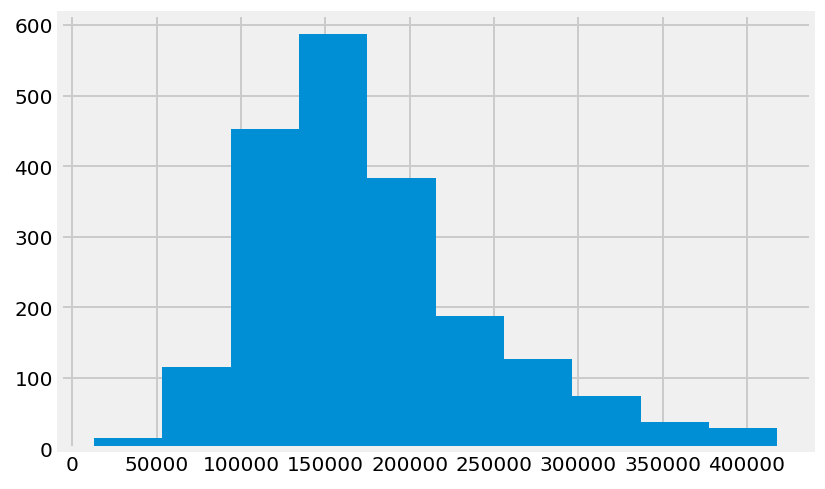

In [297]:
# Looking at the histogram, there are outliers stewing to the right. 
df_train_clean['saleprice'].hist();

In [298]:
# Checking other outliners for Gr Liv Area
df_train['gr_liv_area'][(df_train['gr_liv_area'] > (df_train_final['gr_liv_area'].mean () + df_train_final['saleprice'].std () * 3))].count()

0

<Figure size 1152x648 with 0 Axes>

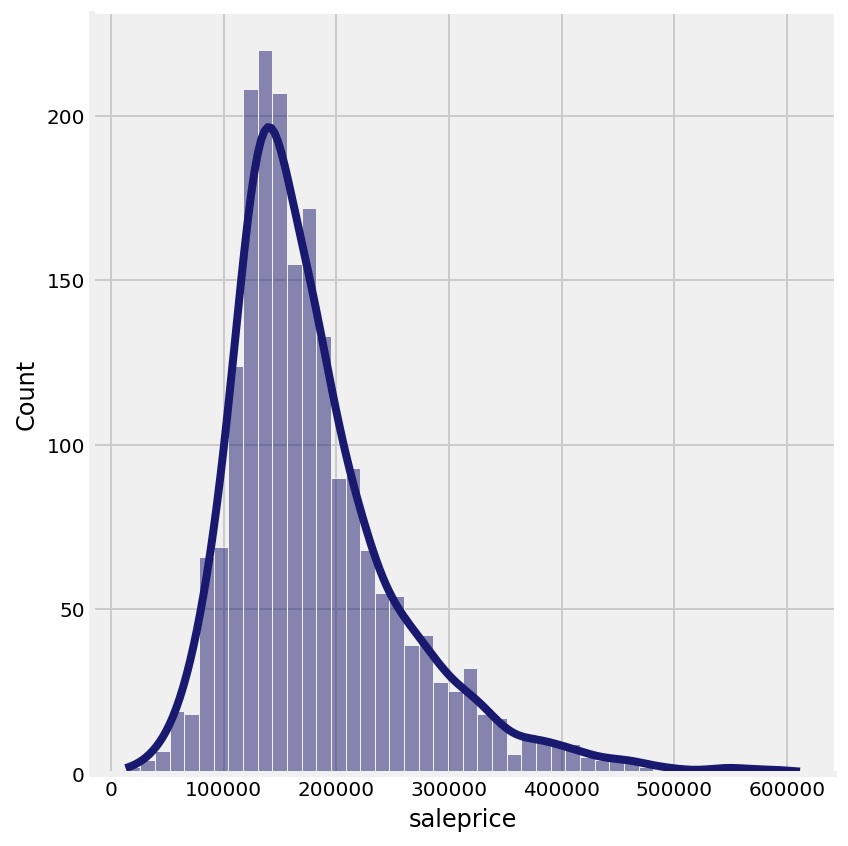

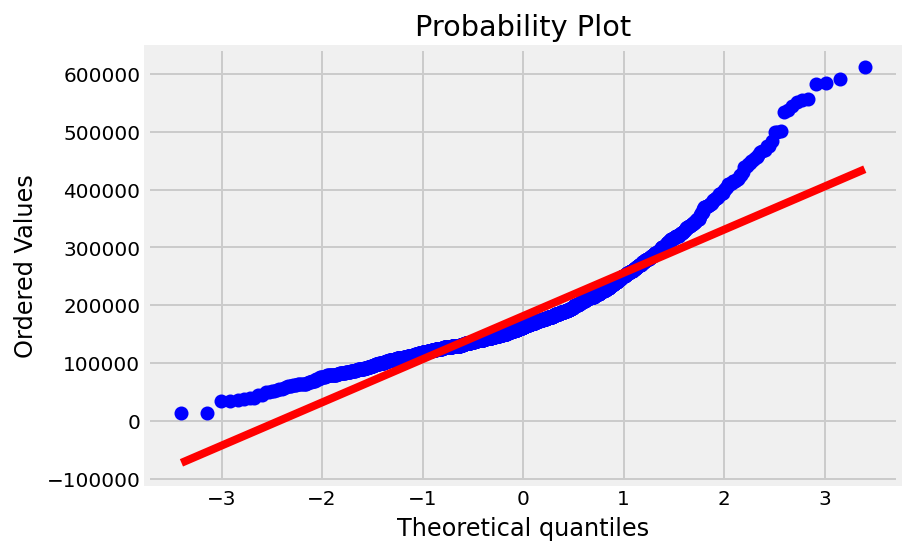

In [299]:
plt.figure(figsize=(16,9))
sns.displot(data=df_train, x='saleprice', kde=True, color= 'midnightblue', height=6)
fig = plt.figure()
pro = stats.probplot(df_train['saleprice'], plot=plt);

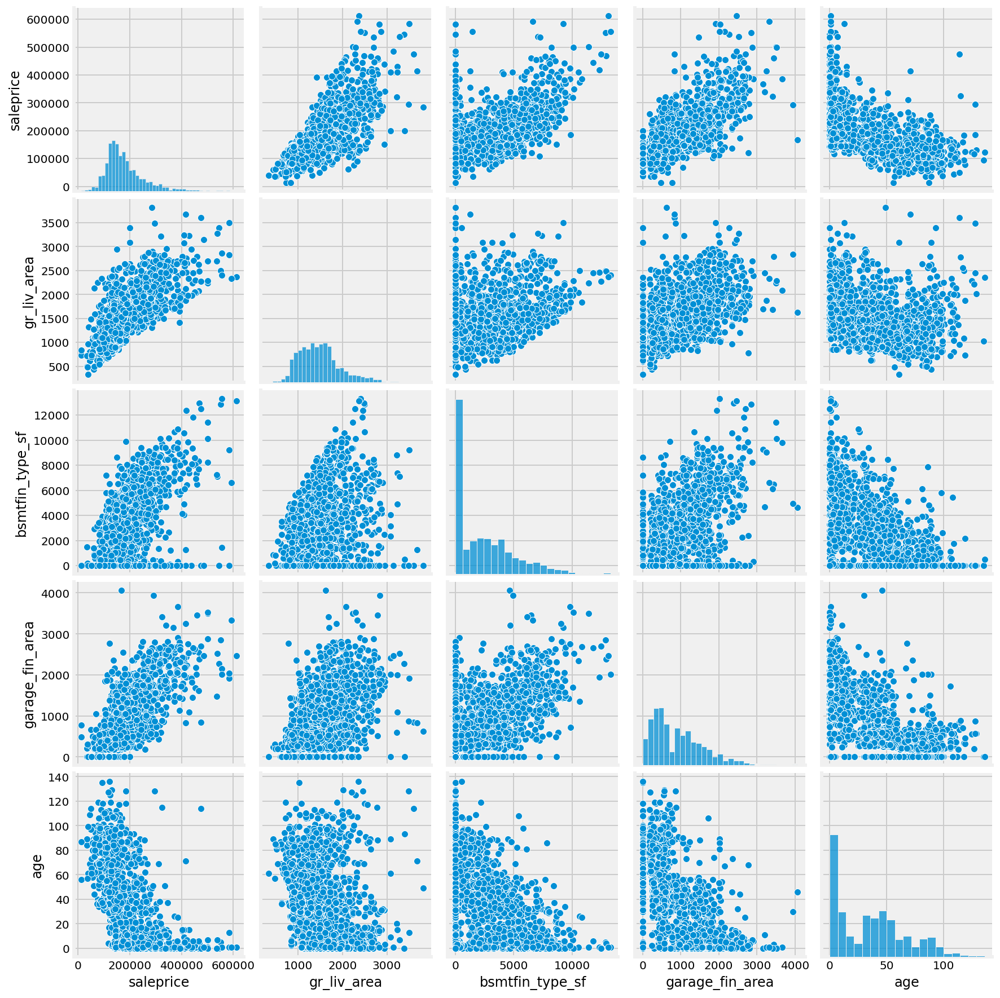

In [300]:
sns.pairplot(df_train[['saleprice', 'gr_liv_area', 'bsmtfin_type_sf', 
                       'garage_fin_area','age']]);

In [301]:
# df_train.missing and df_train.nan to show missing values in the columns
null_cols = df_train.isnull().sum()
null_cols[null_cols > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [302]:
# df_test.missing and df_test.nan to show missing values in the columns
null_cols = df_test.isnull().sum()
null_cols[null_cols > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [303]:
df_train_clean.to_csv('./datasets/train_clean.csv', index = False)
df_test_clean.to_csv('./datasets/test_clean.csv', index = False)

In [304]:
# Summary stats of the features included
df_train_clean[['saleprice','age','neighborhood_order','local_conditions','was_remodeled','overall_qual', 
                  'house_style_order_1.5', 'house_style_order_2.0','exter_qual','exterior_1n2', 'bldg_type_duplex',
                  'bldg_type_twnhs','bldg_type_twnhse','bldg_type_2fmcon', 'roof_style_hip','residential',  
                  'functional', 'lot_frontage', 'lot_area','outside_porch_sf'
                  ,'garage_fin_area','garage_cars', 'paved_drive',
                 'bsmt_qual','bsmtfin_type_sf', 'bsmt_exposure',
                 'heating_qc','kitchen_qual', 'fireplace_qu', 
                 'all_floors_sf', 'totrms_abvgrd', 'room_size', 'all_baths', 'gr_liv_area'
                          ]].describe().T

,count,mean,std,min,25%,50%,75%,max
saleprice,2011.0,176167.133267,68832.228258,12789.0,129225.00000,160000.000000,210650.000000,418000.000000
age,2011.0,36.530085,30.005861,0.0,8.00000,34.000000,55.000000,136.000000
neighborhood_order,2011.0,2.400298,1.004160,1.0,2.00000,2.000000,3.000000,4.000000
local_conditions,2011.0,1.888613,0.398411,0.0,2.00000,2.000000,2.000000,4.000000
was_remodeled,2011.0,0.459970,0.498519,0.0,0.00000,0.000000,1.000000,1.000000
overall_qual,2011.0,6.052710,1.369245,1.0,5.00000,6.000000,7.000000,10.000000
house_style_order_1.5,2011.0,0.139234,0.346277,0.0,0.00000,0.000000,0.000000,1.000000
house_style_order_2.0,2011.0,0.297364,0.457212,0.0,0.00000,0.000000,1.000000,1.000000
exter_qual,2011.0,3.383391,0.563131,2.0,3.00000,3.000000,4.000000,5.000000
exterior_1n2,2011.0,7.726504,2.030560,2.0,6.00000,7.000000,10.000000,10.000000


In [305]:
# Summary stats of the features included
# Except for saleprice which is already not included in the test data, and id which is used for Kaggle submission,
# the rest are the same field as train data
df_test_clean[['id','age','neighborhood_order','local_conditions','was_remodeled','overall_qual', 
                  'house_style_order_1.5', 'house_style_order_2.0','exter_qual','exterior_1n2', 'bldg_type_duplex',
                  'bldg_type_twnhs','bldg_type_twnhse','bldg_type_2fmcon', 'roof_style_hip','residential',  
                  'functional', 'lot_frontage', 'lot_area','outside_porch_sf'
                  ,'garage_fin_area','garage_cars', 'paved_drive',
                 'bsmt_qual','bsmtfin_type_sf', 'bsmt_exposure',
                 'heating_qc','kitchen_qual', 'fireplace_qu', 
                 'all_floors_sf', 'totrms_abvgrd', 'room_size', 'all_baths', 'gr_liv_area'
                          ]].describe().T

,count,mean,std,min,25%,50%,75%,max
id,878.0,1444.749431,850.838263,2.0,692.250000,1433.0000,2197.500000,2928.0
age,878.0,37.333713,30.469253,0.0,8.250000,36.0000,54.750000,129.0
neighborhood_order,878.0,2.447608,0.990888,1.0,2.000000,2.0000,3.000000,4.0
local_conditions,878.0,1.902050,0.375377,0.0,2.000000,2.0000,2.000000,4.0
was_remodeled,878.0,0.466970,0.499192,0.0,0.000000,0.0000,1.000000,1.0
overall_qual,878.0,6.050114,1.369065,2.0,5.000000,6.0000,7.000000,10.0
house_style_order_1.5,878.0,0.154897,0.362013,0.0,0.000000,0.0000,0.000000,1.0
house_style_order_2.0,878.0,0.325740,0.468918,0.0,0.000000,0.0000,1.000000,1.0
exter_qual,878.0,3.379271,0.559670,2.0,3.000000,3.0000,4.000000,5.0
exterior_1n2,878.0,7.686788,2.021229,2.0,6.000000,7.0000,10.000000,10.0
